# Libraries

In [1]:
import pathlib
import random

import cv2
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow.keras.utils import plot_model
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import (
    Input,
    Conv2D,
    MaxPool2D,
    Flatten,
    Dense,
    Dropout,
    BatchNormalization,
)
from tensorflow.keras.regularizers import l1, l2, l1_l2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import SparseCategoricalCrossentropy

from sklearn.metrics import (
    confusion_matrix,
    ConfusionMatrixDisplay,
    classification_report,
    accuracy_score,
    roc_curve,
    auc,
)
from sklearn.preprocessing import label_binarize

from IPython.display import Image, display
from concurrent.futures import ThreadPoolExecutor

# Data loading

In [2]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
data_dir_train = pathlib.Path('/content/drive/MyDrive/Magisterka/Datasets/Vegetable Images Dataset/train')
data_dir_train

PosixPath('/content/drive/MyDrive/Magisterka/Datasets/Vegetable Images Dataset/train')

In [4]:
list(data_dir_train.glob('*'))

[PosixPath('/content/drive/MyDrive/Magisterka/Datasets/Vegetable Images Dataset/train/.DS_Store'),
 PosixPath('/content/drive/MyDrive/Magisterka/Datasets/Vegetable Images Dataset/train/Capsicum'),
 PosixPath('/content/drive/MyDrive/Magisterka/Datasets/Vegetable Images Dataset/train/Radish'),
 PosixPath('/content/drive/MyDrive/Magisterka/Datasets/Vegetable Images Dataset/train/Pumpkin'),
 PosixPath('/content/drive/MyDrive/Magisterka/Datasets/Vegetable Images Dataset/train/Cauliflower'),
 PosixPath('/content/drive/MyDrive/Magisterka/Datasets/Vegetable Images Dataset/train/Potato'),
 PosixPath('/content/drive/MyDrive/Magisterka/Datasets/Vegetable Images Dataset/train/Bean'),
 PosixPath('/content/drive/MyDrive/Magisterka/Datasets/Vegetable Images Dataset/train/Cucumber'),
 PosixPath('/content/drive/MyDrive/Magisterka/Datasets/Vegetable Images Dataset/train/Brinjal'),
 PosixPath('/content/drive/MyDrive/Magisterka/Datasets/Vegetable Images Dataset/train/Cabbage'),
 PosixPath('/content/drive/

In [5]:
class_list = [str(i).split('/')[-1] for i in list(data_dir_train.glob('*')) if not str(i).split('/')[-1].startswith('.')]
class_list

['Capsicum',
 'Radish',
 'Pumpkin',
 'Cauliflower',
 'Potato',
 'Bean',
 'Cucumber',
 'Brinjal',
 'Cabbage',
 'Broccoli',
 'Bitter_Gourd',
 'Papaya',
 'Bottle_Gourd',
 'Tomato',
 'Carrot']

In [6]:
class_dict = {v: i for i, v in enumerate(class_list)}
class_dict

{'Capsicum': 0,
 'Radish': 1,
 'Pumpkin': 2,
 'Cauliflower': 3,
 'Potato': 4,
 'Bean': 5,
 'Cucumber': 6,
 'Brinjal': 7,
 'Cabbage': 8,
 'Broccoli': 9,
 'Bitter_Gourd': 10,
 'Papaya': 11,
 'Bottle_Gourd': 12,
 'Tomato': 13,
 'Carrot': 14}

In [ ]:
image_count = len(list(data_dir_train.glob('*/*.jpg')))
image_count

15000

In [ ]:
beans = list(data_dir_train.glob('Bean/*'))
beans[:5]

[PosixPath('/content/drive/MyDrive/Magisterka/Datasets/Vegetable Images Dataset/train/Bean/0902.jpg'),
 PosixPath('/content/drive/MyDrive/Magisterka/Datasets/Vegetable Images Dataset/train/Bean/0237.jpg'),
 PosixPath('/content/drive/MyDrive/Magisterka/Datasets/Vegetable Images Dataset/train/Bean/0908.jpg'),
 PosixPath('/content/drive/MyDrive/Magisterka/Datasets/Vegetable Images Dataset/train/Bean/0504.jpg'),
 PosixPath('/content/drive/MyDrive/Magisterka/Datasets/Vegetable Images Dataset/train/Bean/0421.jpg')]

In [7]:
vegetables_images_dict_train = {}
for c in class_list:
    vegetables_images_dict_train[c] = list(data_dir_train.glob(f'{c}/*.jpg'))

In [8]:
print('Counted images by class (train set):')
{k: len(v) for k, v in vegetables_images_dict_train.items()}

Counted images by class (train set):


{'Capsicum': 1000,
 'Radish': 1000,
 'Pumpkin': 1000,
 'Cauliflower': 1000,
 'Potato': 1000,
 'Bean': 1000,
 'Cucumber': 1000,
 'Brinjal': 1000,
 'Cabbage': 1000,
 'Broccoli': 1000,
 'Bitter_Gourd': 1000,
 'Papaya': 1000,
 'Bottle_Gourd': 1000,
 'Tomato': 1000,
 'Carrot': 1000}

In [ ]:
len(vegetables_images_dict_train['Bean'])

1000

In [ ]:
str(vegetables_images_dict_train['Bean'][0])

'/content/drive/MyDrive/Magisterka/Datasets/Vegetable Images Dataset/train/Bean/0902.jpg'

In [ ]:
bean_0 = cv2.imread(str(vegetables_images_dict_train['Bean'][0]))
bean_0.shape

(224, 224, 3)

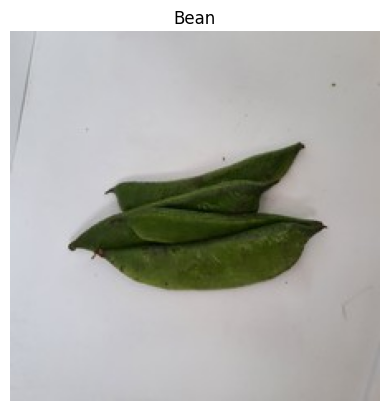

In [ ]:
bean_0_rgb = cv2.cvtColor(bean_0, cv2.COLOR_BGR2RGB)

plt.title('Bean')
plt.axis('off')
plt.imshow(cv2.resize(bean_0_rgb, (224, 224)))
plt.show()

In [9]:
X_train, y_train = [], []

def process_image(args):
    vegetable, image = args
    img = cv2.imread(str(image))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (224, 224))
    return img / 255.0, class_dict[vegetable]

all_images = [(vegetable, image) for vegetable, images in vegetables_images_dict_train.items() for image in images]

with ThreadPoolExecutor() as executor:
    results = list(executor.map(process_image, all_images))

for img, label in results:
    X_train.append(img)
    y_train.append(label)

In [10]:
X_train = np.array(X_train, dtype=np.float32)
y_train = np.array(y_train, dtype=np.int32)

In [11]:
X_train

array([[[[0.6784314 , 0.69803923, 0.77254903],
         [0.6784314 , 0.7058824 , 0.76862746],
         [0.6627451 , 0.7176471 , 0.7529412 ],
         ...,
         [0.6627451 , 0.70980394, 0.75686276],
         [0.67058825, 0.7176471 , 0.7647059 ],
         [0.6784314 , 0.7254902 , 0.77254903]],

        [[0.68235296, 0.7019608 , 0.7764706 ],
         [0.6784314 , 0.7058824 , 0.76862746],
         [0.6627451 , 0.7176471 , 0.7529412 ],
         ...,
         [0.654902  , 0.7019608 , 0.7490196 ],
         [0.6627451 , 0.70980394, 0.75686276],
         [0.67058825, 0.7176471 , 0.7647059 ]],

        [[0.6784314 , 0.7058824 , 0.7764706 ],
         [0.6784314 , 0.7137255 , 0.77254903],
         [0.6666667 , 0.72156864, 0.75686276],
         ...,
         [0.6509804 , 0.69803923, 0.74509805],
         [0.65882355, 0.7058824 , 0.7529412 ],
         [0.6627451 , 0.70980394, 0.75686276]],

        ...,

        [[0.6392157 , 0.6784314 , 0.7176471 ],
         [0.6392157 , 0.6784314 , 0.7176471 ]

In [ ]:
X_train.shape

(15000, 224, 224, 3)

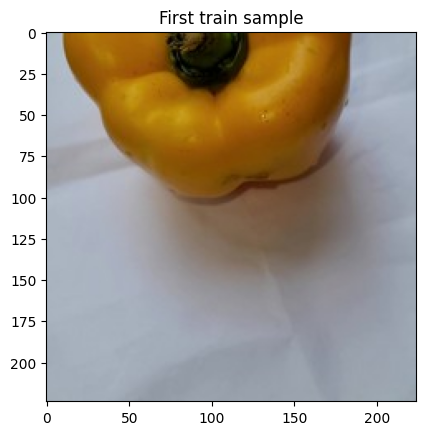

In [12]:
plt.title('First train sample')
plt.imshow(X_train[0])
plt.show()

In [ ]:
y_train

array([ 0,  0,  0, ..., 14, 14, 14], dtype=int32)

In [13]:
data_dir_test = pathlib.Path('/content/drive/MyDrive/Magisterka/Datasets/Vegetable Images Dataset/test')
data_dir_valid = pathlib.Path('/content/drive/MyDrive/Magisterka/Datasets/Vegetable Images Dataset/validation')

In [14]:
vegetables_images_dict_test = {}
for c in class_list:
    vegetables_images_dict_test[c] = list(data_dir_test.glob(f'{c}/*.jpg'))


vegetables_images_dict_valid = {}
for c in class_list:
    vegetables_images_dict_valid[c] = list(data_dir_valid.glob(f'{c}/*.jpg'))


In [15]:
print('Counted images by class (test set):')
{k: len(v) for k, v in vegetables_images_dict_test.items()}

Counted images by class (test set):


{'Capsicum': 200,
 'Radish': 200,
 'Pumpkin': 200,
 'Cauliflower': 200,
 'Potato': 200,
 'Bean': 200,
 'Cucumber': 200,
 'Brinjal': 200,
 'Cabbage': 200,
 'Broccoli': 200,
 'Bitter_Gourd': 200,
 'Papaya': 200,
 'Bottle_Gourd': 200,
 'Tomato': 200,
 'Carrot': 200}

In [16]:
print('Counted images by class (valid set):')
{k: len(v) for k, v in vegetables_images_dict_valid.items()}

Counted images by class (valid set):


{'Capsicum': 200,
 'Radish': 200,
 'Pumpkin': 200,
 'Cauliflower': 200,
 'Potato': 200,
 'Bean': 200,
 'Cucumber': 200,
 'Brinjal': 200,
 'Cabbage': 200,
 'Broccoli': 200,
 'Bitter_Gourd': 200,
 'Papaya': 200,
 'Bottle_Gourd': 200,
 'Tomato': 200,
 'Carrot': 200}

In [17]:
X_test, y_test = [], []

def process_test_image(args):
    vegetable, image = args
    img = cv2.imread(str(image))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (224, 224))
    return img / 255.0, class_dict[vegetable]

all_test_images = [(vegetable, image) for vegetable, images in vegetables_images_dict_test.items() for image in images]

with ThreadPoolExecutor() as executor:
    test_results = list(executor.map(process_test_image, all_test_images))

for img, label in test_results:
    X_test.append(img)
    y_test.append(label)

In [18]:
X_valid, y_valid = [], []

def process_valid_image(args):
    vegetable, image = args
    img = cv2.imread(str(image))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (224, 224))
    return img / 255.0, class_dict[vegetable]

all_valid_images = [(vegetable, image) for vegetable, images in vegetables_images_dict_valid.items() for image in images]

with ThreadPoolExecutor() as executor:
    valid_results = list(executor.map(process_valid_image, all_valid_images))

for img, label in valid_results:
    X_valid.append(img)
    y_valid.append(label)

In [19]:
X_test = np.array(X_test, dtype=np.float32)
y_test = np.array(y_test, dtype=np.int32)

X_valid = np.array(X_valid, dtype=np.float32)
y_valid = np.array(y_valid, dtype=np.int32)

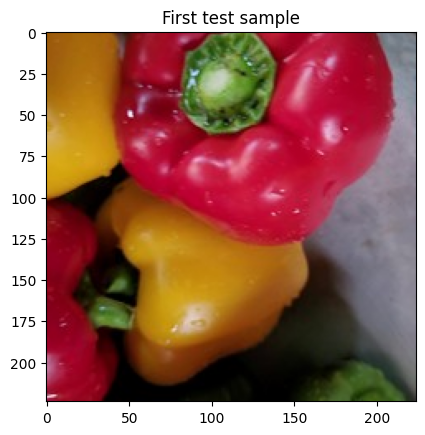

In [ ]:
plt.title('First test sample')
plt.imshow(X_test[0])
plt.show()

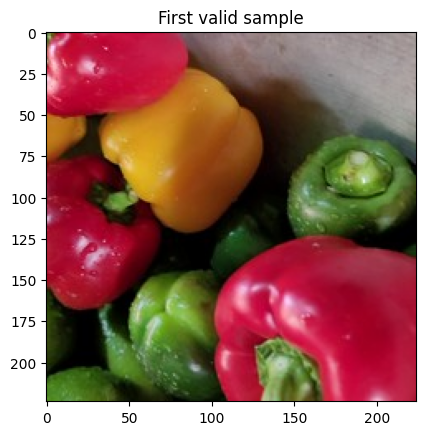

In [ ]:
plt.title('First valid sample')
plt.imshow(X_valid[0])
plt.show()

In [ ]:
print('Unique classes (iterators): {0[0]}\nNumber of unique elements per class {0[1]}'.
      format(np.unique(y_train, return_counts=True)))

Unique classes (iterators): [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14]
Number of unique elements per class [1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000
 1000]


In [ ]:
print(f'Number of classes: {len(np.unique(y_train))}')

Number of classes: 15


# Base architecture

## Model base

In [ ]:
model = Sequential([
    Input(shape=X_train.shape[1:]),
    Conv2D(32, (3, 3), activation='relu'),
    MaxPool2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPool2D((2, 2)),

    Flatten(),
    Dense(128, activation='relu'),
    Dense(len(np.unique(y_train)), activation='softmax'),
])

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 186624)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │      23,888,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 15)                  │           1,935 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,909,327 (91.21 MB)

 Trainable params: 23,909,327 (91.21 MB)

 Non-trainable params: 0 (0.00 B)

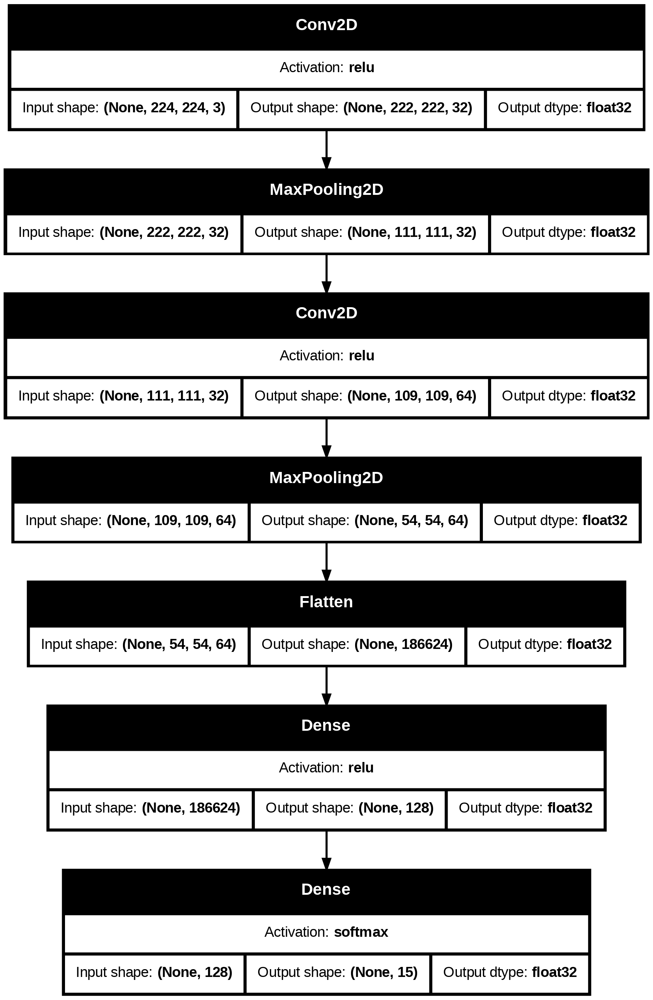

In [ ]:
try:
    plot_model(model, 'model1_base.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model1_base.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [20]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10,
                                                  restore_best_weights=True, verbose=1)

epochs = 100
batch_size = 32

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - accuracy: 0.5085 - loss: 1.8875 - val_accuracy: 0.8197 - val_loss: 0.5653
Epoch 2/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.9070 - loss: 0.3065 - val_accuracy: 0.8800 - val_loss: 0.3848
Epoch 3/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.9729 - loss: 0.0973 - val_accuracy: 0.9117 - val_loss: 0.3077
Epoch 4/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.9891 - loss: 0.0403 - val_accuracy: 0.9150 - val_loss: 0.3255
Epoch 5/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.9936 - loss: 0.0245 - val_accuracy: 0.8767 - val_loss: 0.5525
Epoch 6/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.9890 - loss: 0.0354 - val_accuracy: 0.9177 - val_loss: 0.3622
Epoch 7/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.9928 - loss: 0.0220 - val_accuracy: 0.8920 - val_loss: 0.4749
Epoch 8/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.9912 - loss: 0.0295 -

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f'model1_base - loss: {loss}, accuracy: {acc}')

model1_base - loss: 0.30017364025115967, accuracy: 0.9116666913032532


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[1.0325345993041992,
 0.2797797620296478,
 0.102052703499794,
 0.037378259003162384,
 0.04278718680143356,
 0.04883638396859169,
 0.024417413398623466,
 0.05818365514278412,
 0.023997239768505096,
 0.02082955464720726,
 0.020093141123652458,
 0.006823258008807898,
 0.05991324409842491]

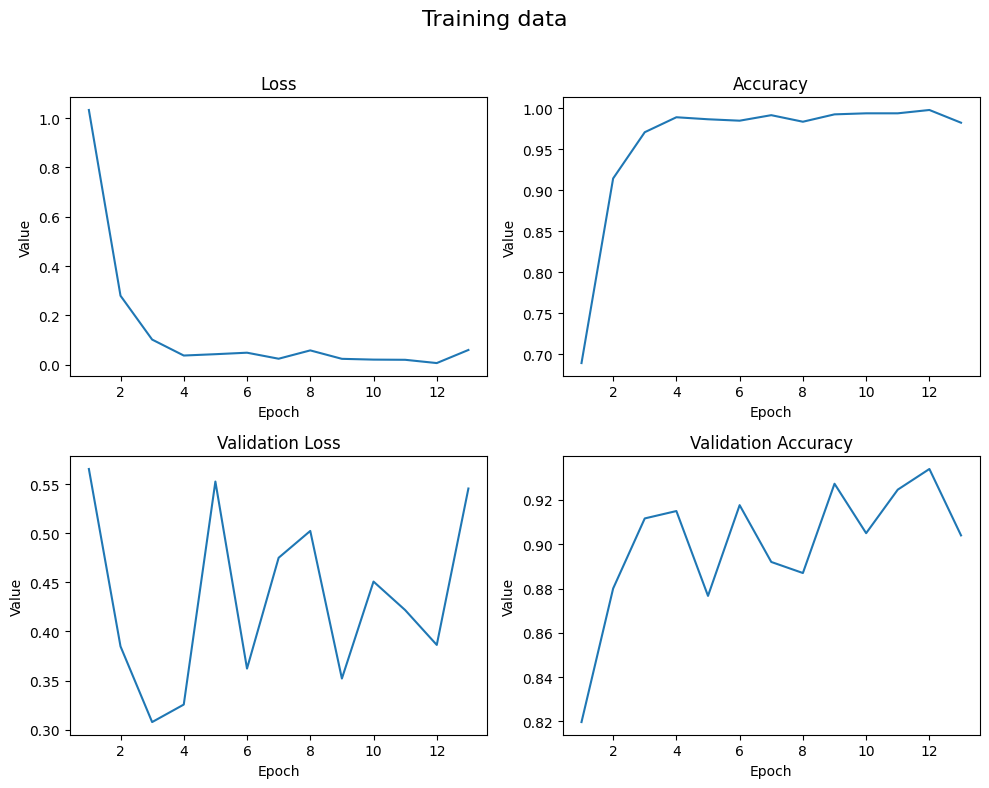

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

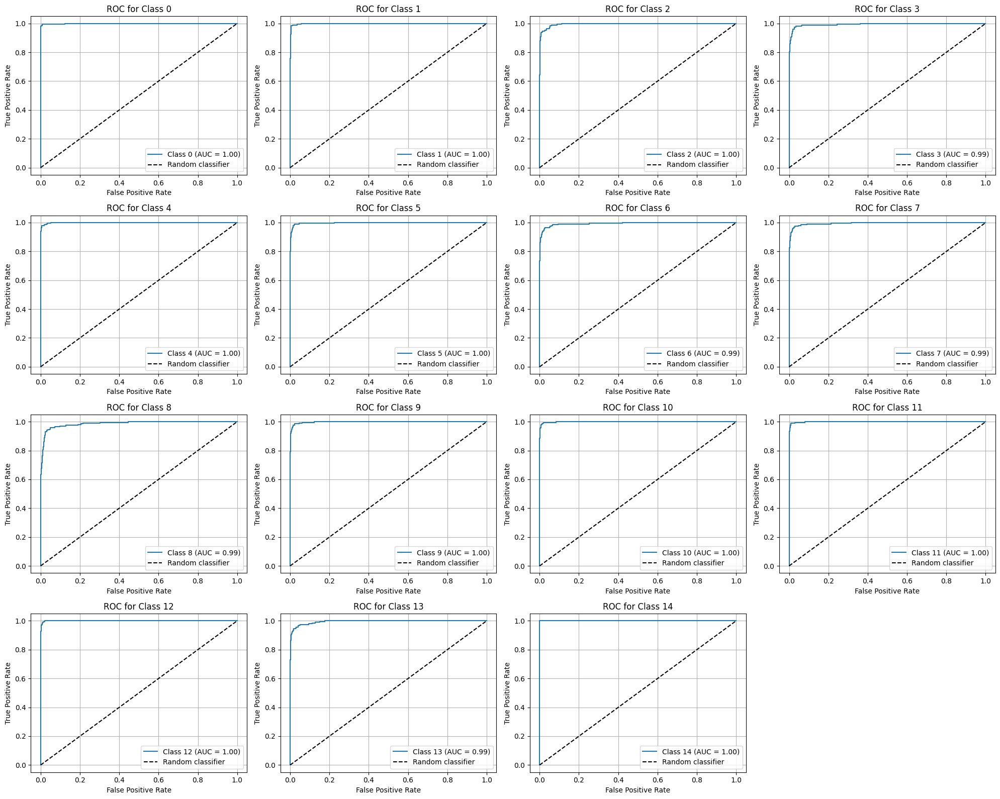

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

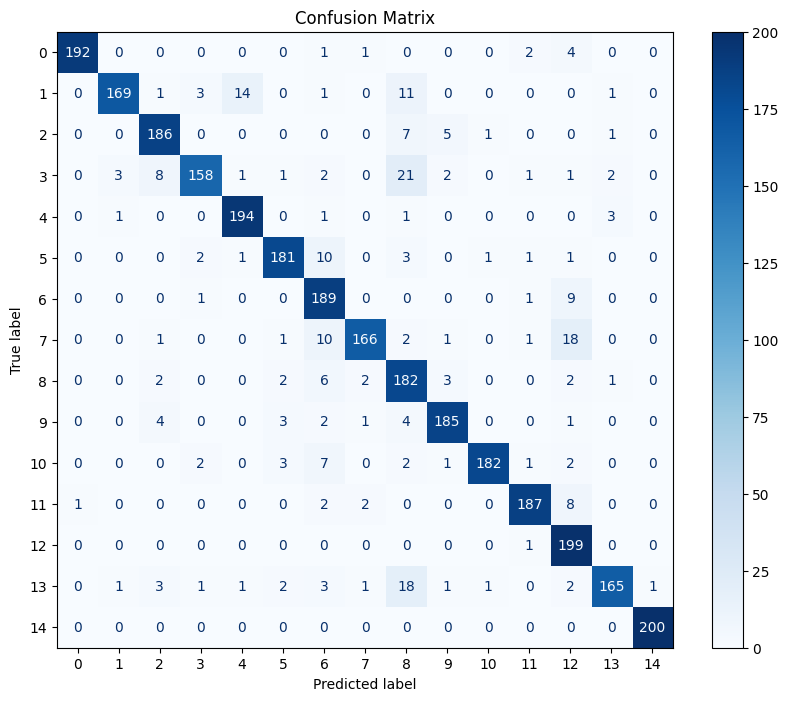

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.9116666666666666


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      0.96      0.98       200
           1       0.97      0.84      0.90       200
           2       0.91      0.93      0.92       200
           3       0.95      0.79      0.86       200
           4       0.92      0.97      0.94       200
           5       0.94      0.91      0.92       200
           6       0.81      0.94      0.87       200
           7       0.96      0.83      0.89       200
           8       0.73      0.91      0.81       200
           9       0.93      0.93      0.93       200
          10       0.98      0.91      0.95       200
          11       0.96      0.94      0.95       200
          12       0.81      0.99      0.89       200
          13       0.95      0.82      0.88       200
          14       1.00      1.00      1.00       200

    accuracy                           0.91      3000
   macro avg       0.92      0.91      0.91      3000
weighted avg       0.92   

## Model l1 = 0.01

In [21]:
input_shape = X_train.shape[1:]
num_classes = len(np.unique(y_train))

In [ ]:
model = Sequential([
    Input(shape=input_shape),
    Conv2D(32, (3, 3), activation="relu", kernel_regularizer=l1(0.01)),
    MaxPool2D((2, 2)),
    Conv2D(64, (3, 3), activation="relu", kernel_regularizer=l1(0.01)),
    MaxPool2D((2, 2)),
    Flatten(),
    Dense(128, activation="relu", kernel_regularizer=l1(0.01)),
    Dense(num_classes, activation="softmax"),
])

In [ ]:
model.compile(
    optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=["accuracy"]
)

In [ ]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_2 (Conv2D)                    │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 186624)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 128)                 │      23,888,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 15)                  │           1,935 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,909,327 (91.21 MB)

 Trainable params: 23,909,327 (91.21 MB)

 Non-trainable params: 0 (0.00 B)

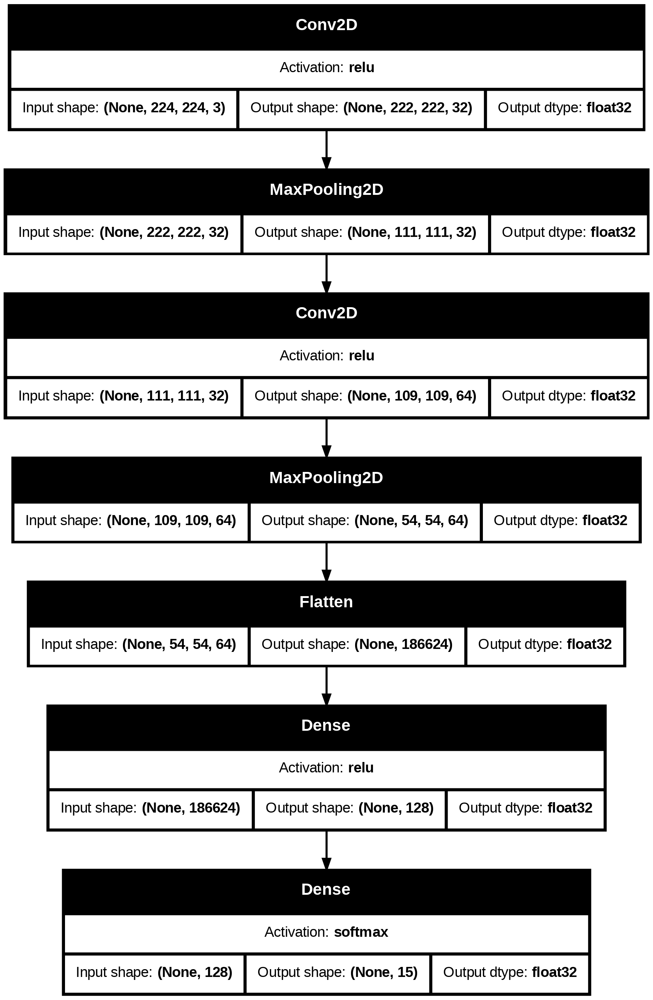

In [ ]:
try:
    plot_model(model, "model1_l1_001.png", show_dtype=True,
        show_shapes=True, show_layer_activations=True,)
    display(Image("model1_l1_001.png"))
except Exception as e:
    print(f"Error occurred: {e}")

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss", patience=10, restore_best_weights=True, verbose=1
)

epochs = 100
batch_size = 32

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - accuracy: 0.0672 - loss: 69.7002 - val_accuracy: 0.0667 - val_loss: 32.2723
Epoch 2/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.0642 - loss: 31.7907 - val_accuracy: 0.0667 - val_loss: 31.5644
Epoch 3/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.0622 - loss: 31.7800 - val_accuracy: 0.0667 - val_loss: 31.5093
Epoch 4/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.0665 - loss: 31.7869 - val_accuracy: 0.0667 - val_loss: 32.2899
Epoch 5/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.0646 - loss: 31.7865 - val_accuracy: 0.0667 - val_loss: 31.9557
Epoch 6/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.0644 - loss: 31.7815 - val_accuracy: 0.0667 - val_loss: 32.3663
Epoch 7/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.0672 - loss: 31.7860 - val_accuracy: 0.0667 - val_loss: 31.8644
Epoch 8/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.0655 - 

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f"model1_l1_001 - loss: {loss}, accuracy: {acc}")

model1_l1_001 - loss: 30.991453170776367, accuracy: 0.06666667014360428


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data["loss"]

[40.224334716796875,
 31.790109634399414,
 31.78325843811035,
 31.784961700439453,
 31.785682678222656,
 31.783599853515625,
 31.78399085998535,
 31.78191375732422,
 31.780624389648438,
 31.77838706970215,
 31.779151916503906,
 31.780269622802734,
 31.78180694580078,
 31.7774658203125,
 31.776901245117188,
 31.7774658203125,
 31.778833389282227,
 31.778541564941406]

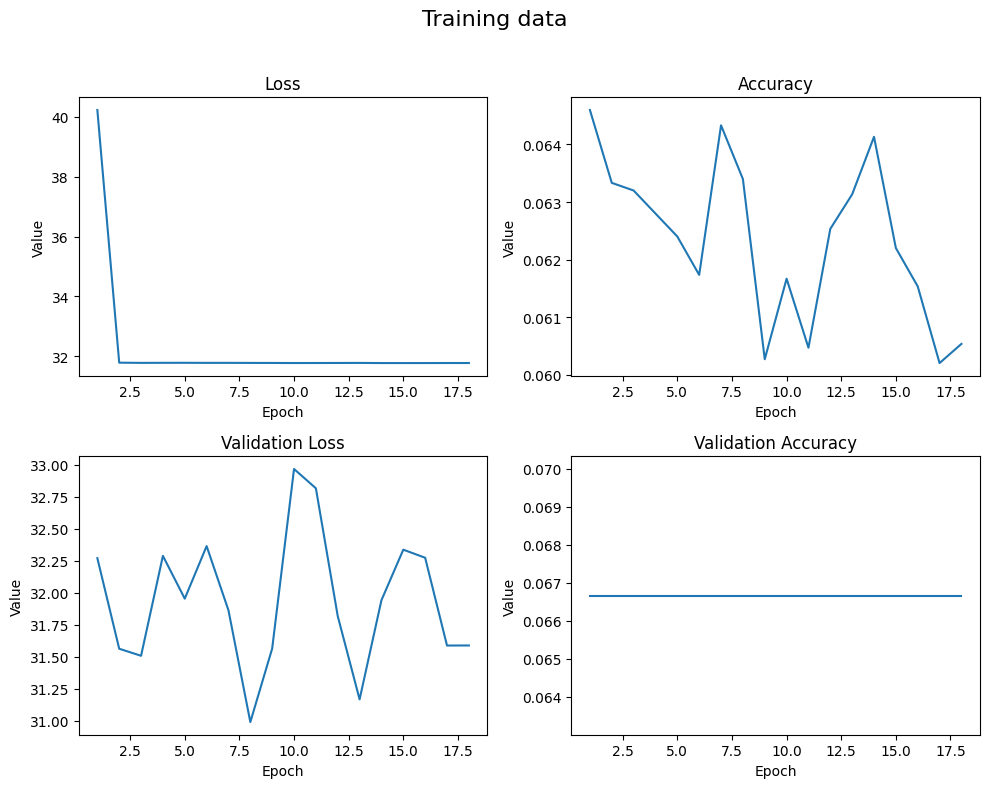

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

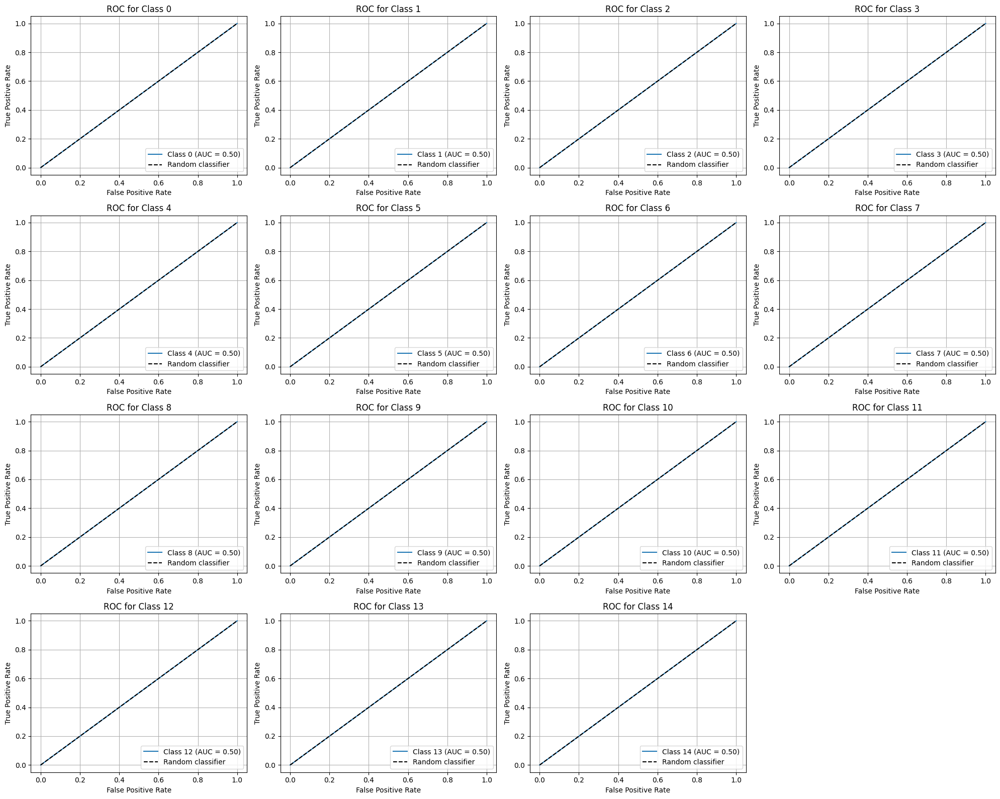

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f"Class {i} (AUC = {roc_auc[i]:.2f})")
    ax.plot([0, 1], [0, 1], "k--", label="Random classifier")
    ax.set_title(f"ROC for Class {i}")
    ax.set_xlabel("False Positive Rate")
    ax.set_ylabel("True Positive Rate")
    ax.legend(loc="lower right")
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis("off")

plt.tight_layout()
plt.show()

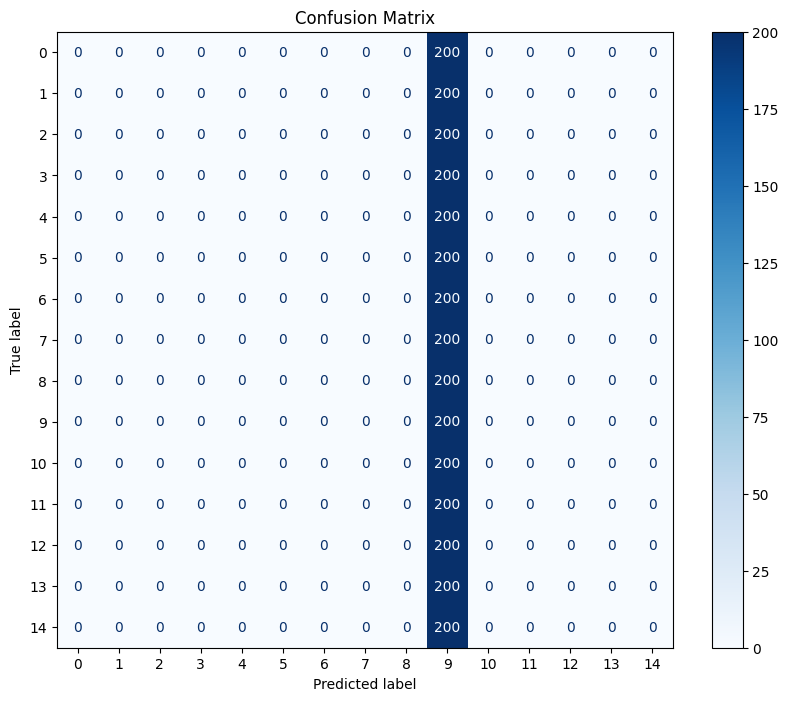

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap="Blues", colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))

Accuracy: 0.06666666666666667


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       200
           1       0.00      0.00      0.00       200
           2       0.00      0.00      0.00       200
           3       0.00      0.00      0.00       200
           4       0.00      0.00      0.00       200
           5       0.00      0.00      0.00       200
           6       0.00      0.00      0.00       200
           7       0.00      0.00      0.00       200
           8       0.00      0.00      0.00       200
           9       0.07      1.00      0.12       200
          10       0.00      0.00      0.00       200
          11       0.00      0.00      0.00       200
          12       0.00      0.00      0.00       200
          13       0.00      0.00      0.00       200
          14       0.00      0.00      0.00       200

    accuracy                           0.07      3000
   macro avg       0.00      0.07      0.01      3000
weighted avg       0.00   

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


## Model l1 = 0.001

In [ ]:
model = Sequential([
    Input(shape=input_shape),
    Conv2D(32, (3, 3), activation="relu", kernel_regularizer=l1(0.001)),
    MaxPool2D((2, 2)),
    Conv2D(64, (3, 3), activation="relu", kernel_regularizer=l1(0.001)),
    MaxPool2D((2, 2)),
    Flatten(),
    Dense(128, activation="relu", kernel_regularizer=l1(0.001)),
    Dense(num_classes, activation="softmax"),
])

In [ ]:
model.compile(
    optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=["accuracy"]
)

In [ ]:
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)                    │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 186624)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 128)                 │      23,888,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 15)                  │           1,935 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,909,327 (91.21 MB)

 Trainable params: 23,909,327 (91.21 MB)

 Non-trainable params: 0 (0.00 B)

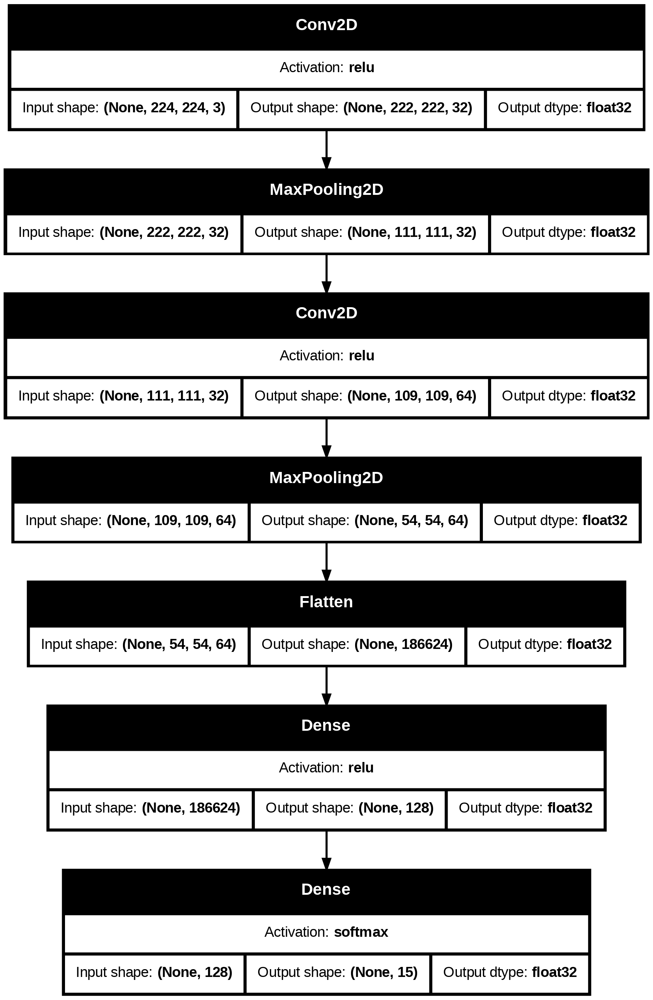

In [ ]:
try:
    plot_model(model, "model1_l1_0001.png", show_dtype=True,
        show_shapes=True, show_layer_activations=True,)
    display(Image("model1_l1_0001.png"))
except Exception as e:
    print(f"Error occurred: {e}")

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - accuracy: 0.2607 - loss: 11.2612 - val_accuracy: 0.4580 - val_loss: 5.4981
Epoch 2/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.4418 - loss: 5.4531 - val_accuracy: 0.4930 - val_loss: 5.1066
Epoch 3/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.4972 - loss: 5.0087 - val_accuracy: 0.5387 - val_loss: 4.7066
Epoch 4/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.5140 - loss: 4.7928 - val_accuracy: 0.4973 - val_loss: 4.8177
Epoch 5/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.5360 - loss: 4.6842 - val_accuracy: 0.4917 - val_loss: 4.7998
Epoch 6/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.5495 - loss: 4.6467 - val_accuracy: 0.5817 - val_loss: 4.5321
Epoch 7/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.5635 - loss: 4.5713 - val_accuracy: 0.5367 - val_loss: 4.6094
Epoch 8/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.5886 - loss: 4.5221 

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f"model1_l1_0001 - loss: {loss}, accuracy: {acc}")

model1_l1_0001 - loss: 4.075446605682373, accuracy: 0.7096666693687439


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data["loss"]

[7.098264694213867,
 5.354518413543701,
 4.938760280609131,
 4.760979652404785,
 4.669388771057129,
 4.614647388458252,
 4.560089588165283,
 4.540157318115234,
 4.499168395996094,
 4.458455562591553,
 4.428303241729736,
 4.432162284851074,
 4.436543941497803,
 4.38606595993042,
 4.389693737030029,
 4.391841888427734,
 4.322684288024902,
 4.320955276489258,
 4.324765205383301,
 4.3216400146484375,
 4.29911470413208,
 4.298068046569824,
 4.299111843109131,
 4.281771659851074,
 4.290489673614502,
 4.2667059898376465,
 4.239809036254883,
 4.251380443572998,
 4.241849899291992,
 4.2215399742126465,
 4.243305683135986,
 4.218031883239746,
 4.206448554992676,
 4.1982269287109375,
 4.223054885864258,
 4.199925422668457,
 4.191406726837158,
 4.190784931182861,
 4.219387531280518,
 4.203407287597656,
 4.174228191375732,
 4.1660237312316895,
 4.173573017120361,
 4.1576619148254395,
 4.182834625244141,
 4.165924072265625,
 4.16096305847168,
 4.167353630065918,
 4.1489081382751465,
 4.1362824440002

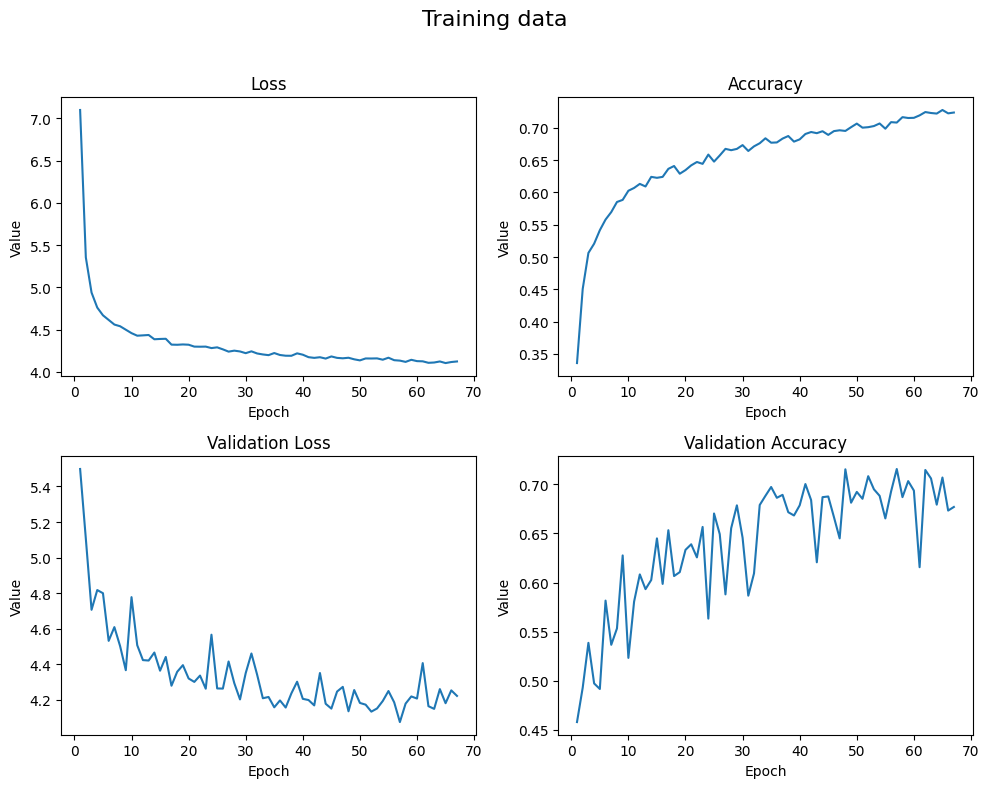

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

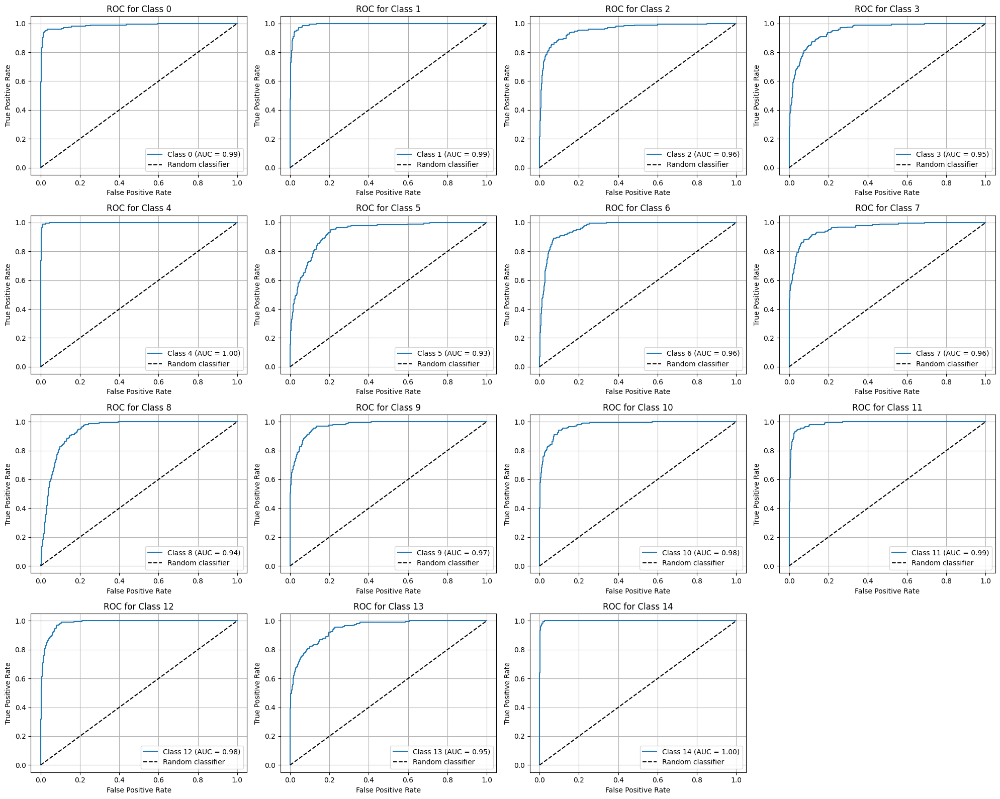

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f"Class {i} (AUC = {roc_auc[i]:.2f})")
    ax.plot([0, 1], [0, 1], "k--", label="Random classifier")
    ax.set_title(f"ROC for Class {i}")
    ax.set_xlabel("False Positive Rate")
    ax.set_ylabel("True Positive Rate")
    ax.legend(loc="lower right")
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis("off")

plt.tight_layout()
plt.show()

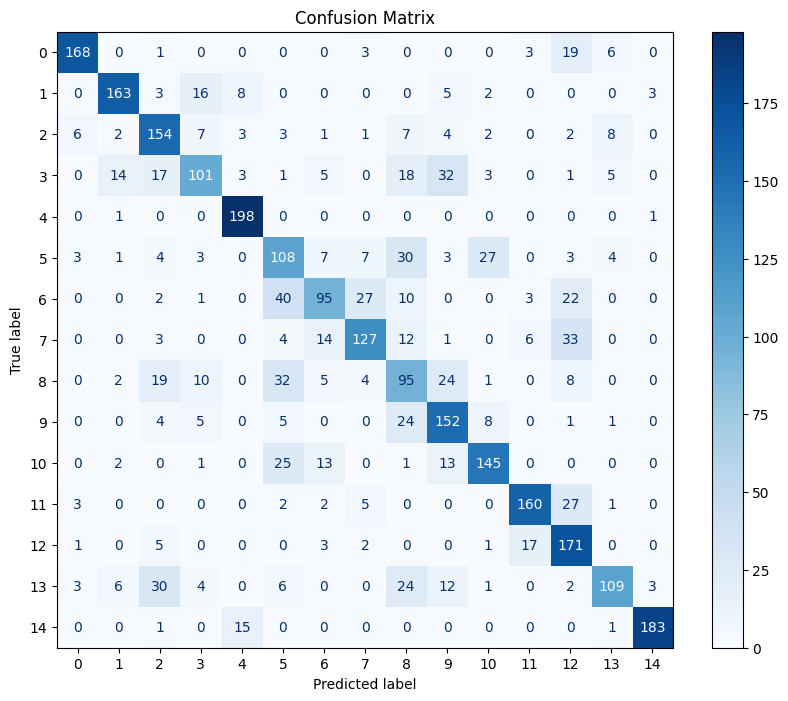

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap="Blues", colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))

Accuracy: 0.7096666666666667


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.91      0.84      0.88       200
           1       0.85      0.81      0.83       200
           2       0.63      0.77      0.70       200
           3       0.68      0.51      0.58       200
           4       0.87      0.99      0.93       200
           5       0.48      0.54      0.51       200
           6       0.66      0.47      0.55       200
           7       0.72      0.64      0.68       200
           8       0.43      0.47      0.45       200
           9       0.62      0.76      0.68       200
          10       0.76      0.72      0.74       200
          11       0.85      0.80      0.82       200
          12       0.59      0.85      0.70       200
          13       0.81      0.55      0.65       200
          14       0.96      0.92      0.94       200

    accuracy                           0.71      3000
   macro avg       0.72      0.71      0.71      3000
weighted avg       0.72   

## Model l2 = 0.01

In [ ]:
model = Sequential([
    Input(shape=input_shape),
    Conv2D(32, (3, 3), activation="relu", kernel_regularizer=l2(0.01)),
    MaxPool2D((2, 2)),
    Conv2D(64, (3, 3), activation="relu", kernel_regularizer=l2(0.01)),
    MaxPool2D((2, 2)),
    Flatten(),
    Dense(128, activation="relu", kernel_regularizer=l2(0.01)),
    Dense(num_classes, activation="softmax"),
])

In [ ]:
model.compile(
    optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=["accuracy"]
)

In [ ]:
model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_6 (Conv2D)                    │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_6 (MaxPooling2D)       │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_7 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_3 (Flatten)                  │ (None, 186624)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 128)                 │      23,888,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 15)                  │           1,935 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,909,327 (91.21 MB)

 Trainable params: 23,909,327 (91.21 MB)

 Non-trainable params: 0 (0.00 B)

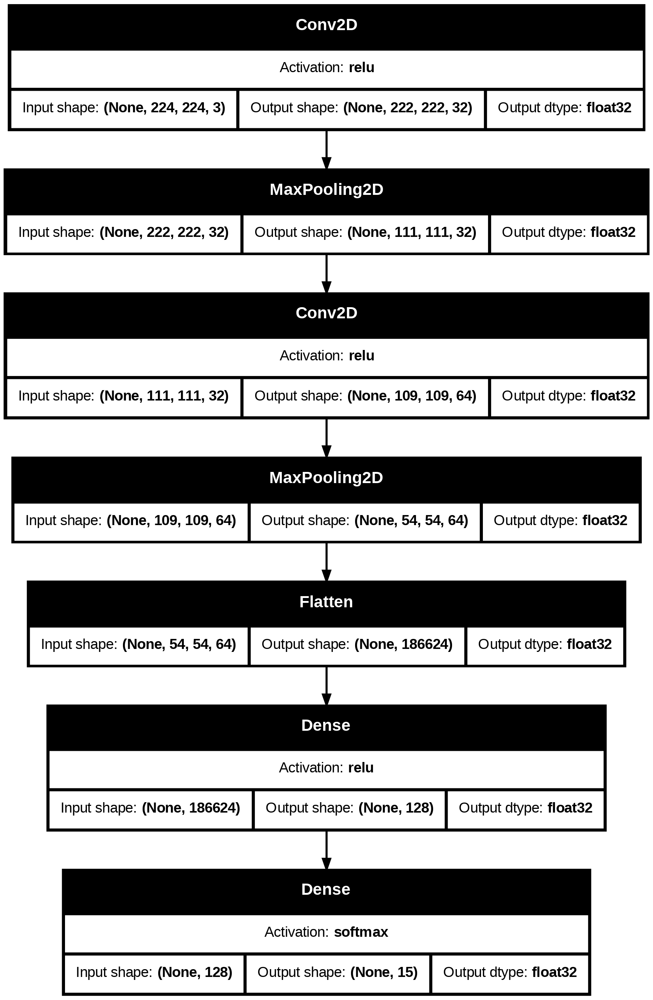

In [ ]:
try:
    plot_model(
        model,
        "model1_l2_001.png",
        show_dtype=True,
        show_shapes=True,
        show_layer_activations=True,
    )
    display(Image("model1_l2_001.png"))
except Exception as e:
    print(f"Error occurred: {e}")

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - accuracy: 0.4187 - loss: 3.1112 - val_accuracy: 0.6590 - val_loss: 1.7046
Epoch 2/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.6784 - loss: 1.6784 - val_accuracy: 0.7063 - val_loss: 1.5144
Epoch 3/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.7171 - loss: 1.4976 - val_accuracy: 0.6740 - val_loss: 1.5821
Epoch 4/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.7262 - loss: 1.4299 - val_accuracy: 0.7120 - val_loss: 1.4040
Epoch 5/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.7348 - loss: 1.3521 - val_accuracy: 0.7590 - val_loss: 1.3275
Epoch 6/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.7547 - loss: 1.2921 - val_accuracy: 0.7700 - val_loss: 1.2923
Epoch 7/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.7548 - loss: 1.2820 - val_accuracy: 0.8000 - val_loss: 1.1605
Epoch 8/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.7662 - loss: 1.2217 -

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f"model1_l2_001 - loss: {loss}, accuracy: {acc}")

model1_l2_001 - loss: 0.8346724510192871, accuracy: 0.874666690826416


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data["loss"]

[2.2537143230438232,
 1.6740857362747192,
 1.4827523231506348,
 1.424965739250183,
 1.3498482704162598,
 1.3097655773162842,
 1.283987283706665,
 1.2378250360488892,
 1.2009342908859253,
 1.1833631992340088,
 1.166927695274353,
 1.1454803943634033,
 1.140188455581665,
 1.1016994714736938,
 1.093562364578247,
 1.0913201570510864,
 1.0936424732208252,
 1.057151198387146,
 1.0568602085113525,
 1.050047516822815,
 1.0442650318145752,
 1.016418218612671,
 1.0063037872314453,
 0.9972360134124756,
 1.0095056295394897,
 1.0073649883270264,
 0.9995473027229309,
 1.0038753747940063,
 0.9852415919303894,
 0.9712843894958496,
 0.9544545412063599,
 0.9578723907470703,
 0.9559286236763,
 0.9593823552131653,
 0.9385571479797363,
 0.9315796494483948,
 0.9502954483032227,
 0.9408338069915771,
 0.9492387771606445,
 0.9299526810646057,
 0.9237526059150696,
 0.9085350036621094,
 0.9368042945861816,
 0.9080577492713928,
 0.908612072467804,
 0.901303231716156,
 0.9194580316543579,
 0.9161978363990784,
 0.91

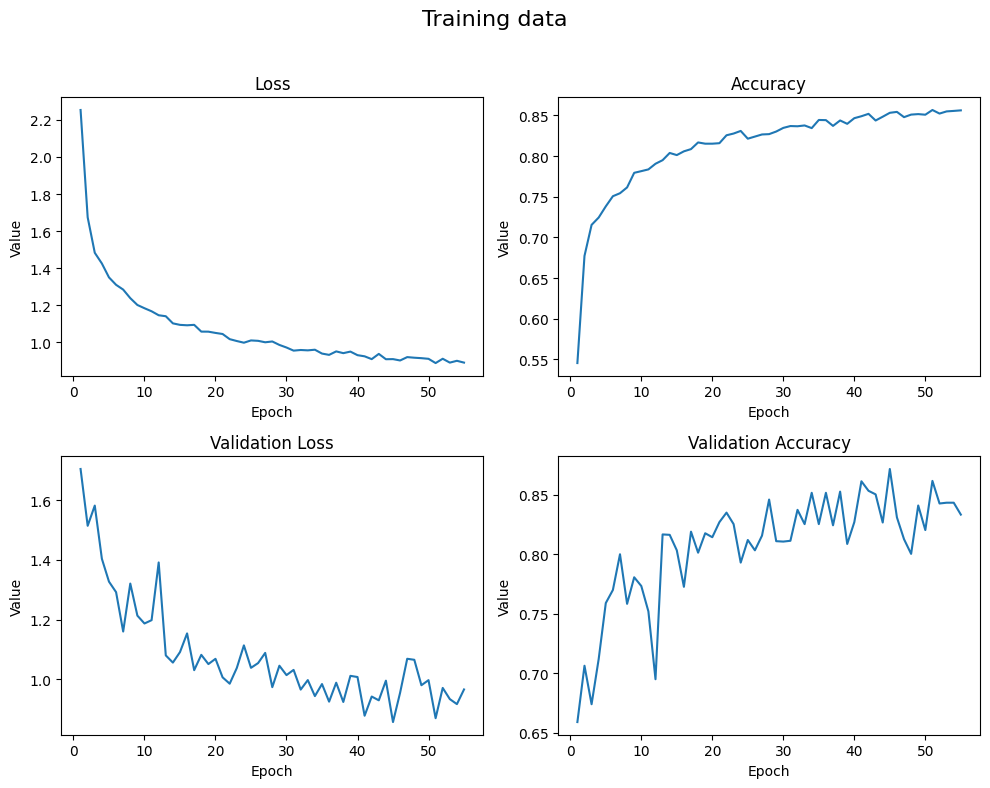

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

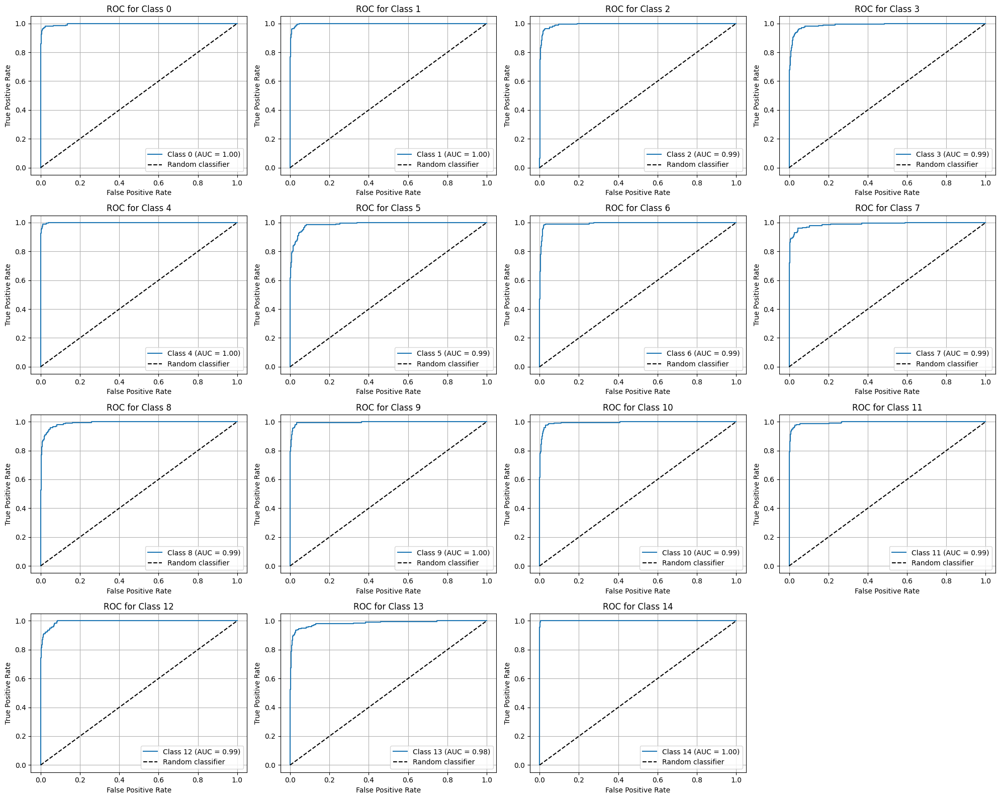

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f"Class {i} (AUC = {roc_auc[i]:.2f})")
    ax.plot([0, 1], [0, 1], "k--", label="Random classifier")
    ax.set_title(f"ROC for Class {i}")
    ax.set_xlabel("False Positive Rate")
    ax.set_ylabel("True Positive Rate")
    ax.legend(loc="lower right")
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis("off")

plt.tight_layout()
plt.show()

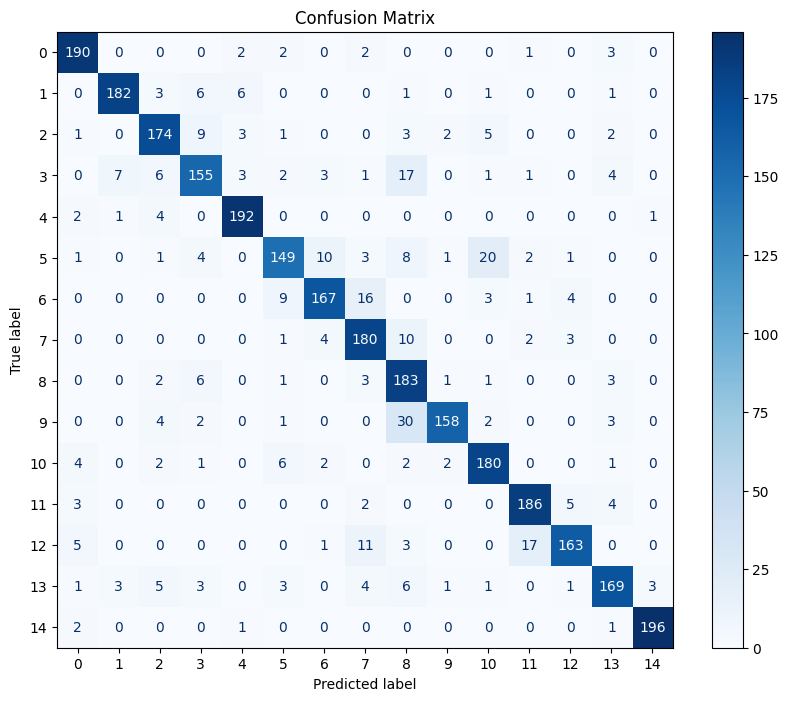

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap="Blues", colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))

Accuracy: 0.8746666666666667


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.91      0.95      0.93       200
           1       0.94      0.91      0.93       200
           2       0.87      0.87      0.87       200
           3       0.83      0.78      0.80       200
           4       0.93      0.96      0.94       200
           5       0.85      0.74      0.79       200
           6       0.89      0.83      0.86       200
           7       0.81      0.90      0.85       200
           8       0.70      0.92      0.79       200
           9       0.96      0.79      0.87       200
          10       0.84      0.90      0.87       200
          11       0.89      0.93      0.91       200
          12       0.92      0.81      0.86       200
          13       0.88      0.84      0.86       200
          14       0.98      0.98      0.98       200

    accuracy                           0.87      3000
   macro avg       0.88      0.87      0.87      3000
weighted avg       0.88   

## Model l2 = 0.001

In [ ]:
model = Sequential([
    Input(shape=input_shape),
    Conv2D(32, (3, 3), activation="relu", kernel_regularizer=l2(0.001)),
    MaxPool2D((2, 2)),
    Conv2D(64, (3, 3), activation="relu", kernel_regularizer=l2(0.001)),
    MaxPool2D((2, 2)),
    Flatten(),
    Dense(128, activation="relu", kernel_regularizer=l2(0.001)),
    Dense(num_classes, activation="softmax"),
])

In [ ]:
model.compile(
    optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=["accuracy"]
)

In [ ]:
model.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_8 (Conv2D)                    │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_8 (MaxPooling2D)       │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_9 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_9 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_4 (Flatten)                  │ (None, 186624)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 128)                 │      23,888,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 15)                  │           1,935 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,909,327 (91.21 MB)

 Trainable params: 23,909,327 (91.21 MB)

 Non-trainable params: 0 (0.00 B)

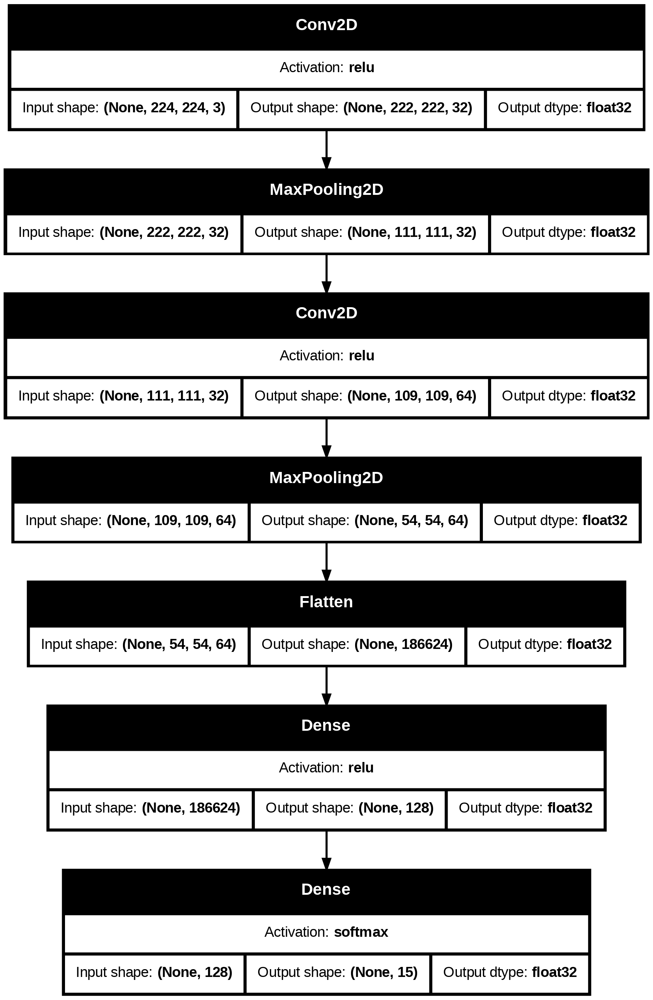

In [ ]:
try:
    plot_model(
        model,
        "model1_l2_0001.png",
        show_dtype=True,
        show_shapes=True,
        show_layer_activations=True,
    )
    display(Image("model1_l2_0001.png"))
except Exception as e:
    print(f"Error occurred: {e}")

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - accuracy: 0.5051 - loss: 2.2501 - val_accuracy: 0.7517 - val_loss: 1.1447
Epoch 2/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.8434 - loss: 0.9244 - val_accuracy: 0.8473 - val_loss: 0.9316
Epoch 3/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.8934 - loss: 0.7713 - val_accuracy: 0.8893 - val_loss: 0.7945
Epoch 4/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9183 - loss: 0.6763 - val_accuracy: 0.8647 - val_loss: 0.8653
Epoch 5/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.9174 - loss: 0.7106 - val_accuracy: 0.9207 - val_loss: 0.7110
Epoch 6/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.9287 - loss: 0.6591 - val_accuracy: 0.9143 - val_loss: 0.7134
Epoch 7/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.9490 - loss: 0.5824 - val_accuracy: 0.9113 - val_loss: 0.7729
Epoch 8/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9392 - loss: 0.6471 -

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f"model1_l2_0001 - loss: {loss}, accuracy: {acc}")

model1_l2_0001 - loss: 0.7181298136711121, accuracy: 0.9206666946411133


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data["loss"]

[1.4987858533859253,
 0.9212141036987305,
 0.8153464794158936,
 0.739410936832428,
 0.7339945435523987,
 0.7100237011909485,
 0.6380253434181213,
 0.6683971285820007,
 0.6090487241744995,
 0.6305712461471558,
 0.612315833568573,
 0.587286651134491,
 0.5923747420310974,
 0.5500838160514832,
 0.5909424424171448]

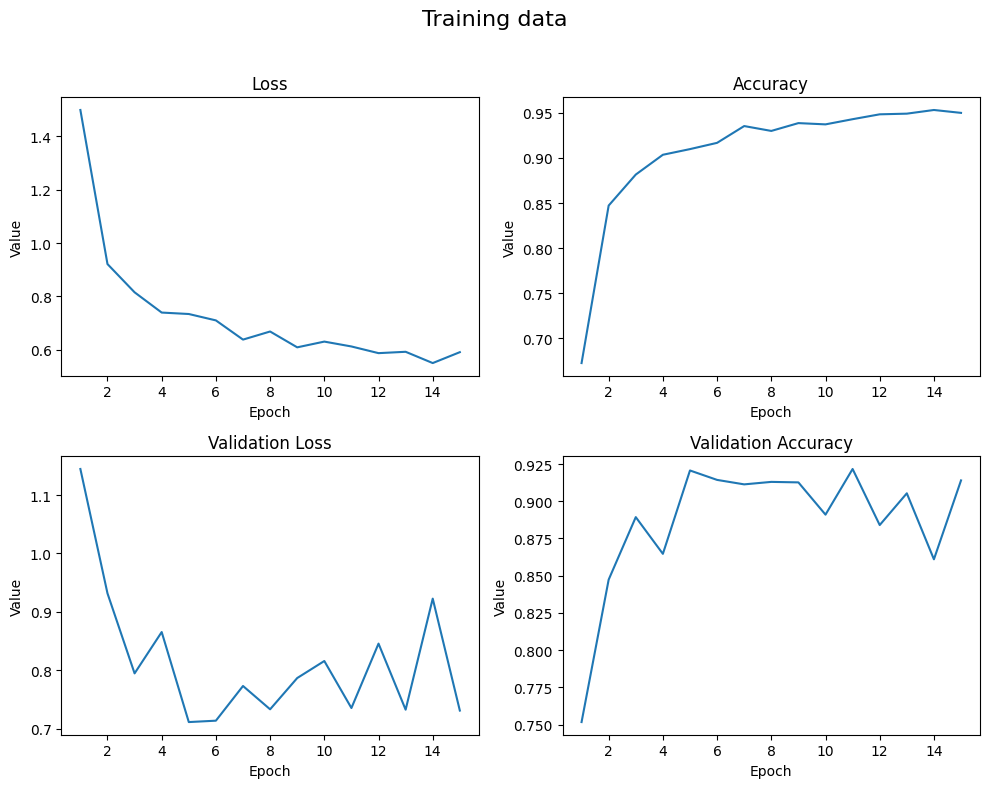

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

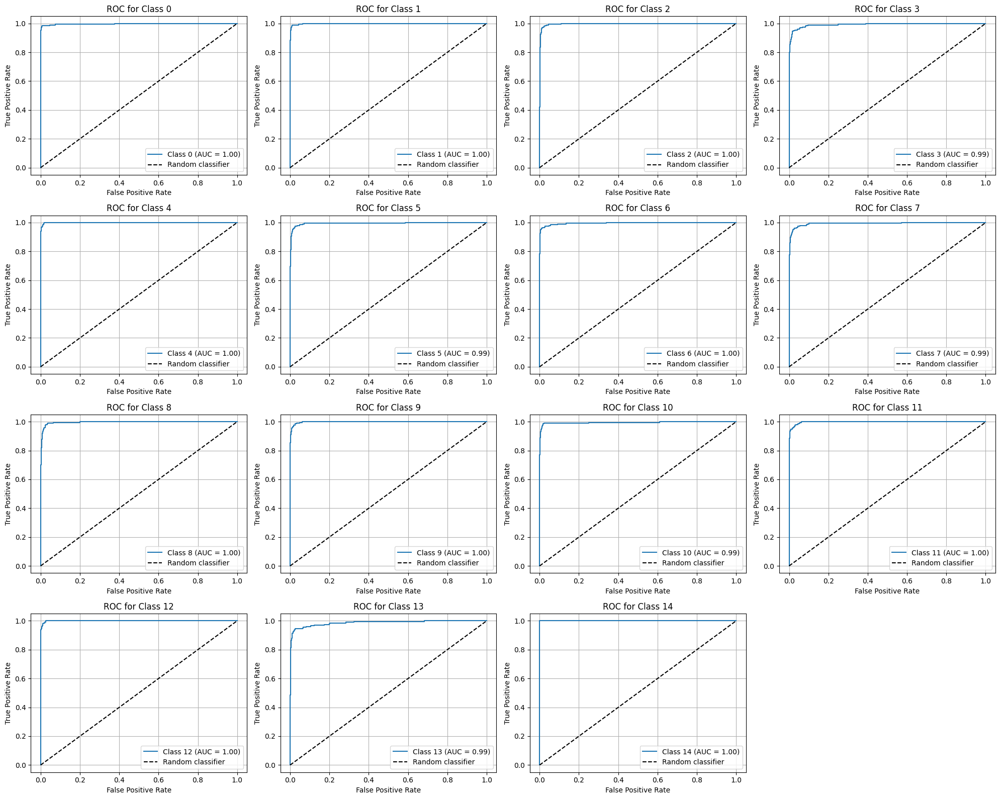

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f"Class {i} (AUC = {roc_auc[i]:.2f})")
    ax.plot([0, 1], [0, 1], "k--", label="Random classifier")
    ax.set_title(f"ROC for Class {i}")
    ax.set_xlabel("False Positive Rate")
    ax.set_ylabel("True Positive Rate")
    ax.legend(loc="lower right")
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis("off")

plt.tight_layout()
plt.show()

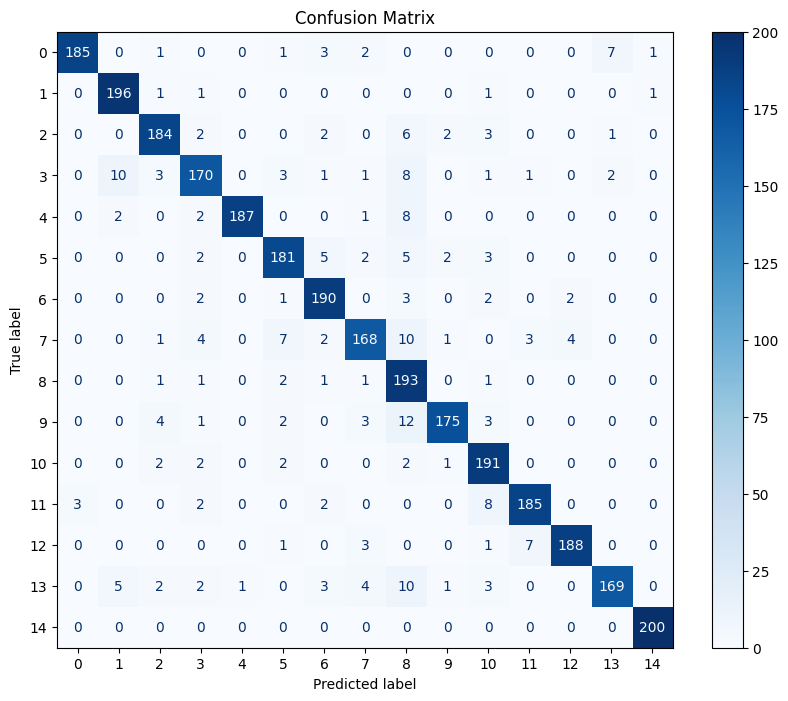

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap="Blues", colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))

Accuracy: 0.9206666666666666


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.98      0.93      0.95       200
           1       0.92      0.98      0.95       200
           2       0.92      0.92      0.92       200
           3       0.89      0.85      0.87       200
           4       0.99      0.94      0.96       200
           5       0.91      0.91      0.91       200
           6       0.91      0.95      0.93       200
           7       0.91      0.84      0.87       200
           8       0.75      0.96      0.84       200
           9       0.96      0.88      0.92       200
          10       0.88      0.95      0.92       200
          11       0.94      0.93      0.93       200
          12       0.97      0.94      0.95       200
          13       0.94      0.84      0.89       200
          14       0.99      1.00      1.00       200

    accuracy                           0.92      3000
   macro avg       0.93      0.92      0.92      3000
weighted avg       0.93   

## Model dropout = 0.2

In [ ]:
model = Sequential([
    Input(shape=input_shape),
    Conv2D(32, (3, 3), activation="relu"),
    MaxPool2D((2, 2)),
    Dropout(0.2),
    Conv2D(64, (3, 3), activation="relu"),
    MaxPool2D((2, 2)),
    Dropout(0.2),
    Flatten(),
    Dense(128, activation="relu"),
    Dropout(0.2),
    Dense(num_classes, activation="softmax"),
])

In [ ]:
model.compile(
    optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=["accuracy"]
)

In [ ]:
model.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_10 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_10 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_11 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_11 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_5 (Flatten)                  │ (None, 186624)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 128)                 │      23,888,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 15)                  │           1,935 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,909,327 (91.21 MB)

 Trainable params: 23,909,327 (91.21 MB)

 Non-trainable params: 0 (0.00 B)

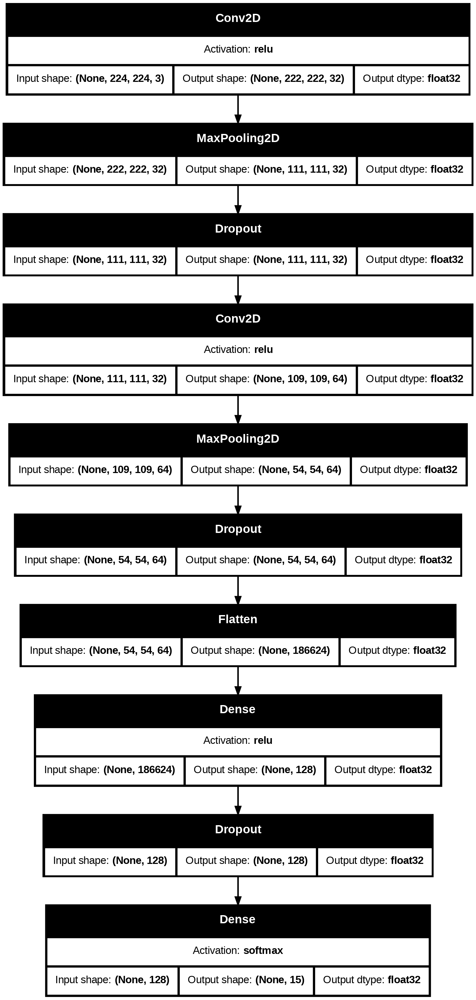

In [ ]:
try:
    plot_model(
        model,
        "model1_dropout_02.png",
        show_dtype=True,
        show_shapes=True,
        show_layer_activations=True,
    )
    display(Image("model1_dropout_02.png"))
except Exception as e:
    print(f"Error occurred: {e}")

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - accuracy: 0.3442 - loss: 2.6725 - val_accuracy: 0.7333 - val_loss: 0.8343
Epoch 2/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.7807 - loss: 0.6988 - val_accuracy: 0.8513 - val_loss: 0.4870
Epoch 3/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.8954 - loss: 0.3477 - val_accuracy: 0.8817 - val_loss: 0.4072
Epoch 4/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9351 - loss: 0.2067 - val_accuracy: 0.8963 - val_loss: 0.3676
Epoch 5/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9579 - loss: 0.1407 - val_accuracy: 0.8893 - val_loss: 0.3806
Epoch 6/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9627 - loss: 0.1295 - val_accuracy: 0.9013 - val_loss: 0.3915
Epoch 7/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9682 - loss: 0.1027 - val_accuracy: 0.9043 - val_loss: 0.3844
Epoch 8/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9758 - loss: 0.0806 -

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f"model1_dropout_02 - loss: {loss}, accuracy: {acc}")

model1_dropout_02 - loss: 0.38016048073768616, accuracy: 0.8920000195503235


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data["loss"]

[1.6239091157913208,
 0.6344782114028931,
 0.3347034454345703,
 0.2230568826198578,
 0.15060770511627197,
 0.12659187614917755,
 0.10821588337421417,
 0.08244611322879791,
 0.07500892132520676,
 0.08876430988311768,
 0.0672149583697319,
 0.06717477738857269,
 0.05897897854447365,
 0.05971764028072357]

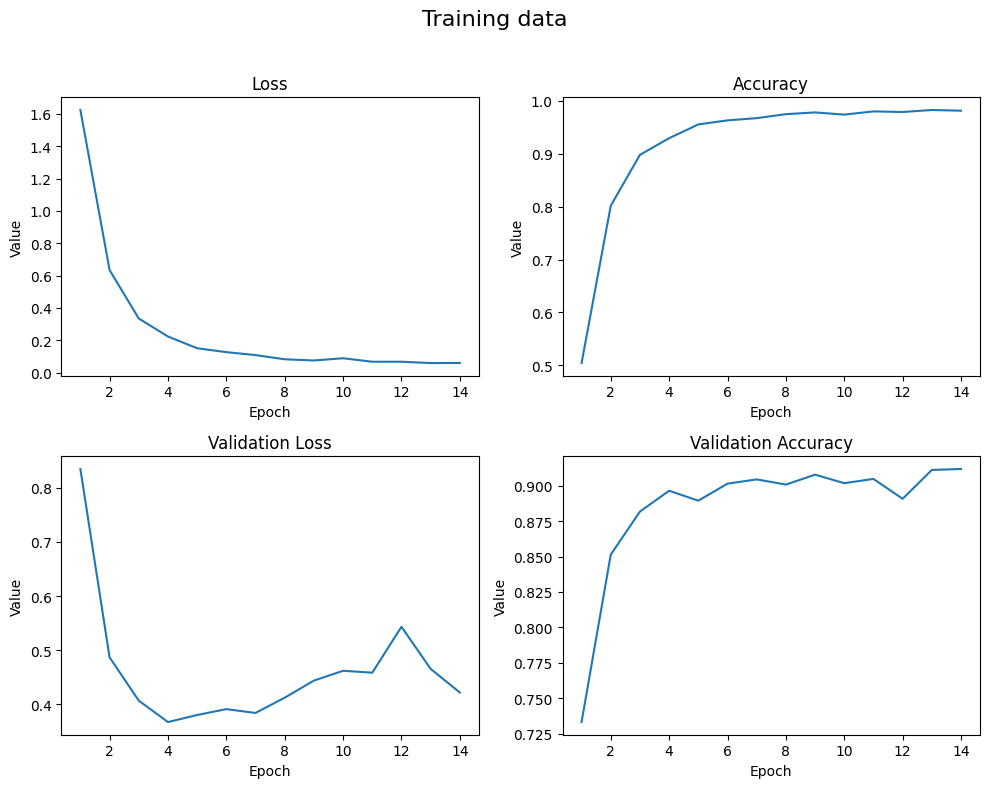

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

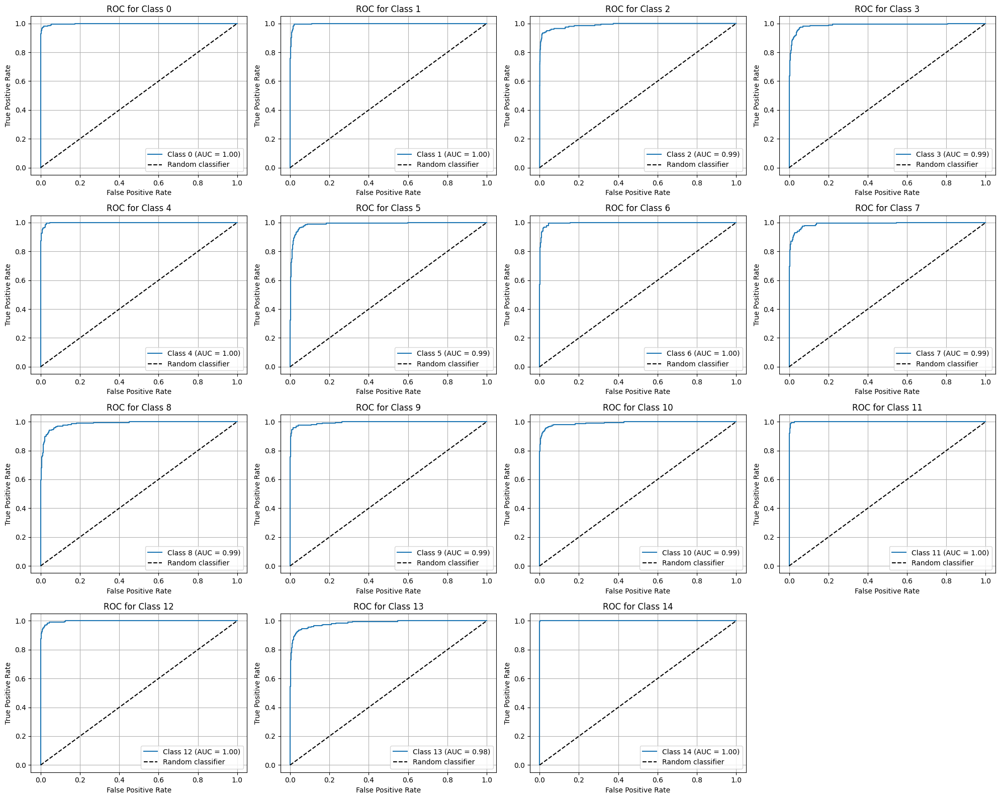

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f"Class {i} (AUC = {roc_auc[i]:.2f})")
    ax.plot([0, 1], [0, 1], "k--", label="Random classifier")
    ax.set_title(f"ROC for Class {i}")
    ax.set_xlabel("False Positive Rate")
    ax.set_ylabel("True Positive Rate")
    ax.legend(loc="lower right")
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis("off")

plt.tight_layout()
plt.show()

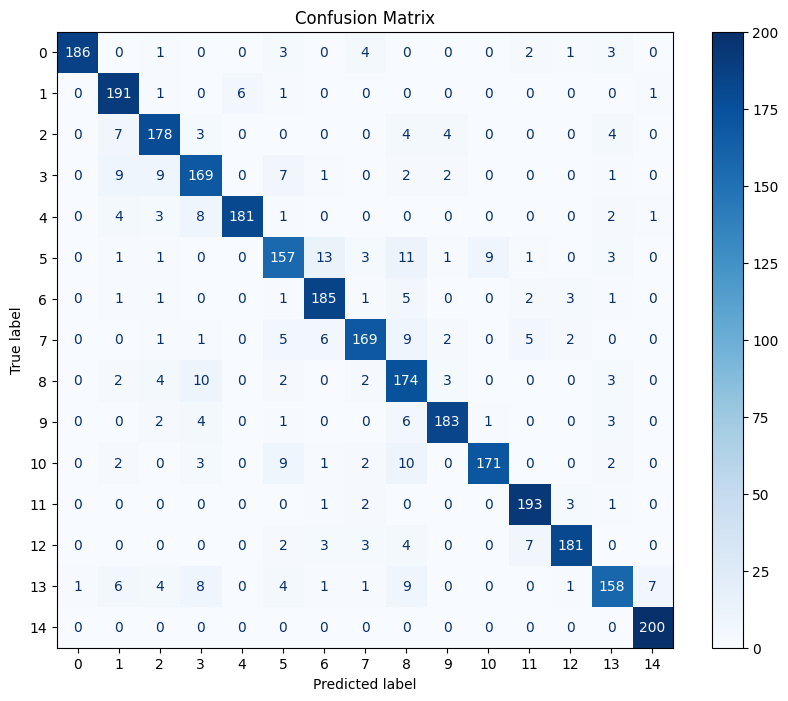

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap="Blues", colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))

Accuracy: 0.892


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      0.93      0.96       200
           1       0.86      0.95      0.90       200
           2       0.87      0.89      0.88       200
           3       0.82      0.84      0.83       200
           4       0.97      0.91      0.94       200
           5       0.81      0.79      0.80       200
           6       0.88      0.93      0.90       200
           7       0.90      0.84      0.87       200
           8       0.74      0.87      0.80       200
           9       0.94      0.92      0.93       200
          10       0.94      0.85      0.90       200
          11       0.92      0.96      0.94       200
          12       0.95      0.91      0.93       200
          13       0.87      0.79      0.83       200
          14       0.96      1.00      0.98       200

    accuracy                           0.89      3000
   macro avg       0.90      0.89      0.89      3000
weighted avg       0.90   

## Model dropout = 0.3

In [ ]:
model = Sequential([
    Input(shape=input_shape),
    Conv2D(32, (3, 3), activation="relu"),
    MaxPool2D((2, 2)),
    Dropout(0.3),
    Conv2D(64, (3, 3), activation="relu"),
    MaxPool2D((2, 2)),
    Dropout(0.3),
    Flatten(),
    Dense(128, activation="relu"),
    Dropout(0.3),
    Dense(num_classes, activation="softmax"),
])

In [ ]:
model.compile(
    optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=["accuracy"]
)

In [ ]:
model.summary()

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_12 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_12 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_13 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_13 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_6 (Flatten)                  │ (None, 186624)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_12 (Dense)                     │ (None, 128)                 │      23,888,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_13 (Dense)                     │ (None, 15)                  │           1,935 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,909,327 (91.21 MB)

 Trainable params: 23,909,327 (91.21 MB)

 Non-trainable params: 0 (0.00 B)

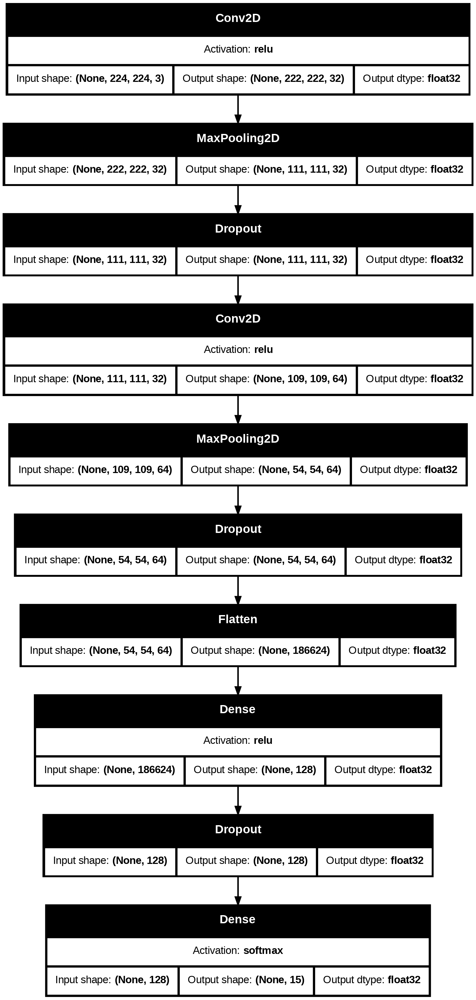

In [ ]:
try:
    plot_model(
        model,
        "model1_dropout_03.png",
        show_dtype=True,
        show_shapes=True,
        show_layer_activations=True,
    )
    display(Image("model1_dropout_03.png"))
except Exception as e:
    print(f"Error occurred: {e}")

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - accuracy: 0.2383 - loss: 3.4596 - val_accuracy: 0.6667 - val_loss: 1.0918
Epoch 2/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.6626 - loss: 0.9937 - val_accuracy: 0.8343 - val_loss: 0.6166
Epoch 3/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.7792 - loss: 0.6628 - val_accuracy: 0.8660 - val_loss: 0.4795
Epoch 4/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.8366 - loss: 0.4854 - val_accuracy: 0.8760 - val_loss: 0.4037
Epoch 5/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.8741 - loss: 0.3704 - val_accuracy: 0.9007 - val_loss: 0.3380
Epoch 6/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9007 - loss: 0.2930 - val_accuracy: 0.9003 - val_loss: 0.3674
Epoch 7/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9077 - loss: 0.2701 - val_accuracy: 0.9100 - val_loss: 0.3216
Epoch 8/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9270 - loss: 0.2164 -

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f"model1_dropout_03 - loss: {loss}, accuracy: {acc}")

model1_dropout_03 - loss: 0.32488054037094116, accuracy: 0.9086666703224182


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data["loss"]

[2.041316270828247,
 0.9216415882110596,
 0.6332811117172241,
 0.46628040075302124,
 0.3767242729663849,
 0.3079536259174347,
 0.2593376338481903,
 0.23659692704677582,
 0.20388861000537872,
 0.18618044257164001,
 0.1952204555273056,
 0.16480518877506256,
 0.163741797208786,
 0.14238914847373962,
 0.14368031919002533,
 0.1473519206047058,
 0.12459024041891098,
 0.1076817512512207]

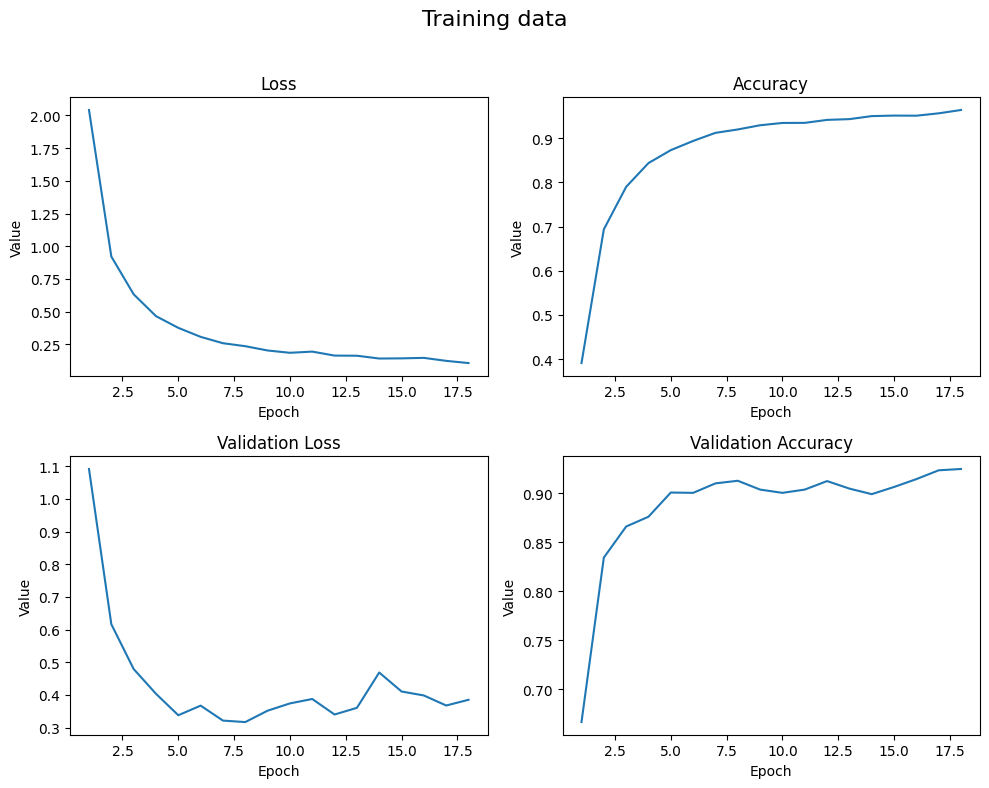

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

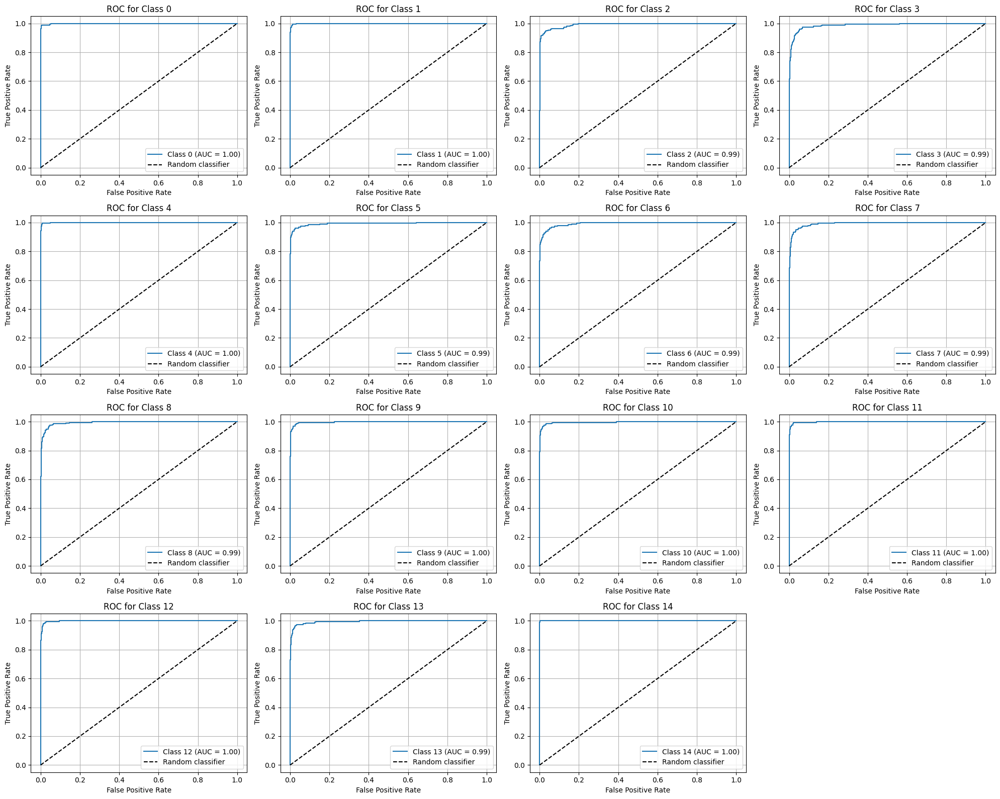

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f"Class {i} (AUC = {roc_auc[i]:.2f})")
    ax.plot([0, 1], [0, 1], "k--", label="Random classifier")
    ax.set_title(f"ROC for Class {i}")
    ax.set_xlabel("False Positive Rate")
    ax.set_ylabel("True Positive Rate")
    ax.legend(loc="lower right")
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis("off")

plt.tight_layout()
plt.show()

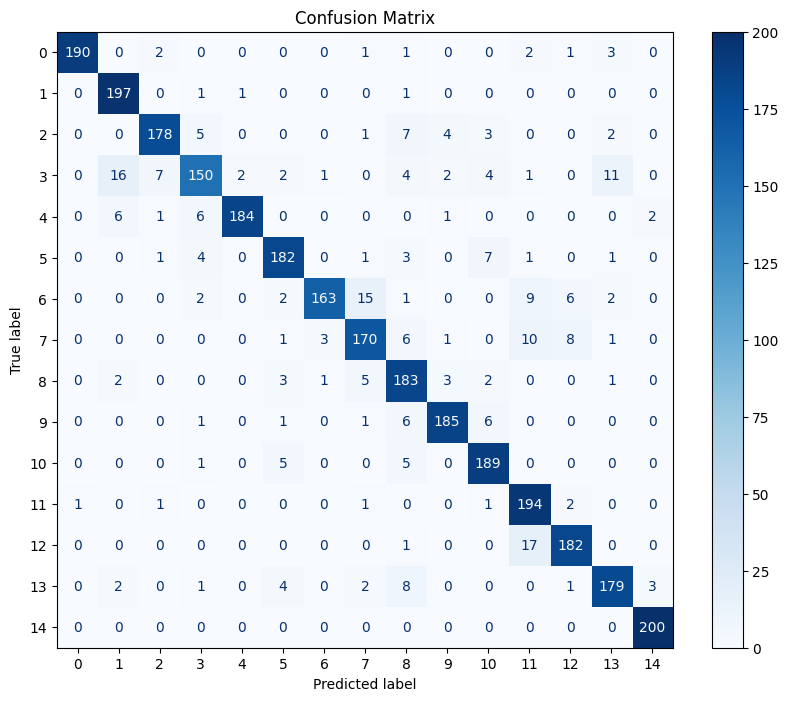

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap="Blues", colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))

Accuracy: 0.9086666666666666


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      0.95      0.97       200
           1       0.88      0.98      0.93       200
           2       0.94      0.89      0.91       200
           3       0.88      0.75      0.81       200
           4       0.98      0.92      0.95       200
           5       0.91      0.91      0.91       200
           6       0.97      0.81      0.89       200
           7       0.86      0.85      0.86       200
           8       0.81      0.92      0.86       200
           9       0.94      0.93      0.93       200
          10       0.89      0.94      0.92       200
          11       0.83      0.97      0.89       200
          12       0.91      0.91      0.91       200
          13       0.90      0.90      0.90       200
          14       0.98      1.00      0.99       200

    accuracy                           0.91      3000
   macro avg       0.91      0.91      0.91      3000
weighted avg       0.91   

## Model dropout = 0.4

In [ ]:
model = Sequential([
    Input(shape=input_shape),
    Conv2D(32, (3, 3), activation="relu"),
    MaxPool2D((2, 2)),
    Dropout(0.4),
    Conv2D(64, (3, 3), activation="relu"),
    MaxPool2D((2, 2)),
    Dropout(0.4),
    Flatten(),
    Dense(128, activation="relu"),
    Dropout(0.4),
    Dense(num_classes, activation="softmax"),
])

In [ ]:
model.compile(
    optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=["accuracy"]
)

In [ ]:
model.summary()

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_14 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_14 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_15 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_15 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_7 (Flatten)                  │ (None, 186624)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_14 (Dense)                     │ (None, 128)                 │      23,888,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_8 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_15 (Dense)                     │ (None, 15)                  │           1,935 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,909,327 (91.21 MB)

 Trainable params: 23,909,327 (91.21 MB)

 Non-trainable params: 0 (0.00 B)

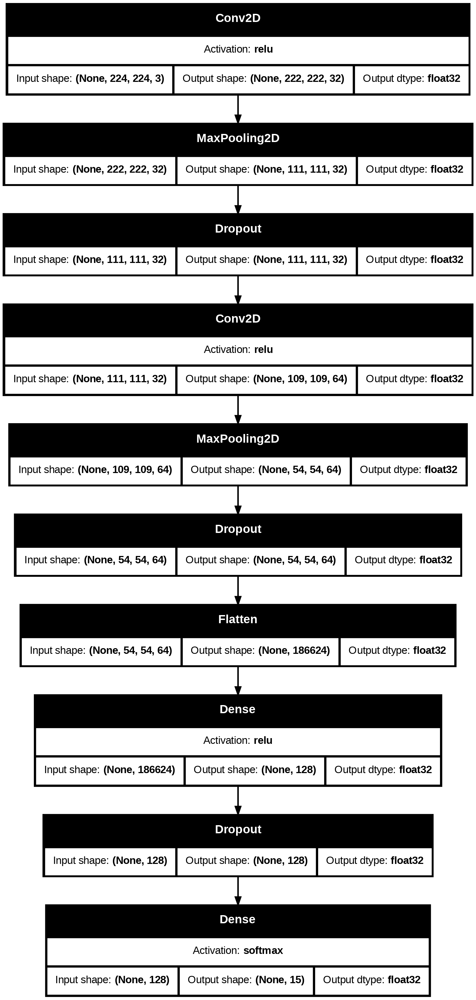

In [ ]:
try:
    plot_model(
        model,
        "model1_dropout_04.png",
        show_dtype=True,
        show_shapes=True,
        show_layer_activations=True,
    )
    display(Image("model1_dropout_04.png"))
except Exception as e:
    print(f"Error occurred: {e}")

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - accuracy: 0.1946 - loss: 3.1757 - val_accuracy: 0.6060 - val_loss: 1.2995
Epoch 2/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.5273 - loss: 1.3549 - val_accuracy: 0.7230 - val_loss: 0.8839
Epoch 3/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.6458 - loss: 1.0470 - val_accuracy: 0.8243 - val_loss: 0.6432
Epoch 4/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.7039 - loss: 0.8514 - val_accuracy: 0.8447 - val_loss: 0.5422
Epoch 5/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.7485 - loss: 0.7059 - val_accuracy: 0.8833 - val_loss: 0.4013
Epoch 6/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.7847 - loss: 0.5971 - val_accuracy: 0.8777 - val_loss: 0.3986
Epoch 7/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.8171 - loss: 0.5152 - val_accuracy: 0.8777 - val_loss: 0.4097
Epoch 8/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.8155 - loss: 0.5082 -

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f"model1_dropout_04 - loss: {loss}, accuracy: {acc}")

model1_dropout_04 - loss: 0.26181477308273315, accuracy: 0.9229999780654907


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data["loss"]

[2.1509318351745605,
 1.2682193517684937,
 1.002800703048706,
 0.8285212516784668,
 0.6965290904045105,
 0.6034829020500183,
 0.5282661318778992,
 0.5032474398612976,
 0.4588320851325989,
 0.4207165837287903,
 0.3754079341888428,
 0.3711559772491455,
 0.3372611999511719,
 0.3228505253791809,
 0.30089840292930603,
 0.2930600941181183,
 0.2910751402378082,
 0.25392305850982666,
 0.2561594843864441,
 0.233026385307312,
 0.225223571062088,
 0.20615245401859283,
 0.2075972557067871,
 0.19751018285751343,
 0.2079719603061676,
 0.18018589913845062,
 0.18341192603111267,
 0.17297179996967316,
 0.16096895933151245,
 0.16312675178050995]

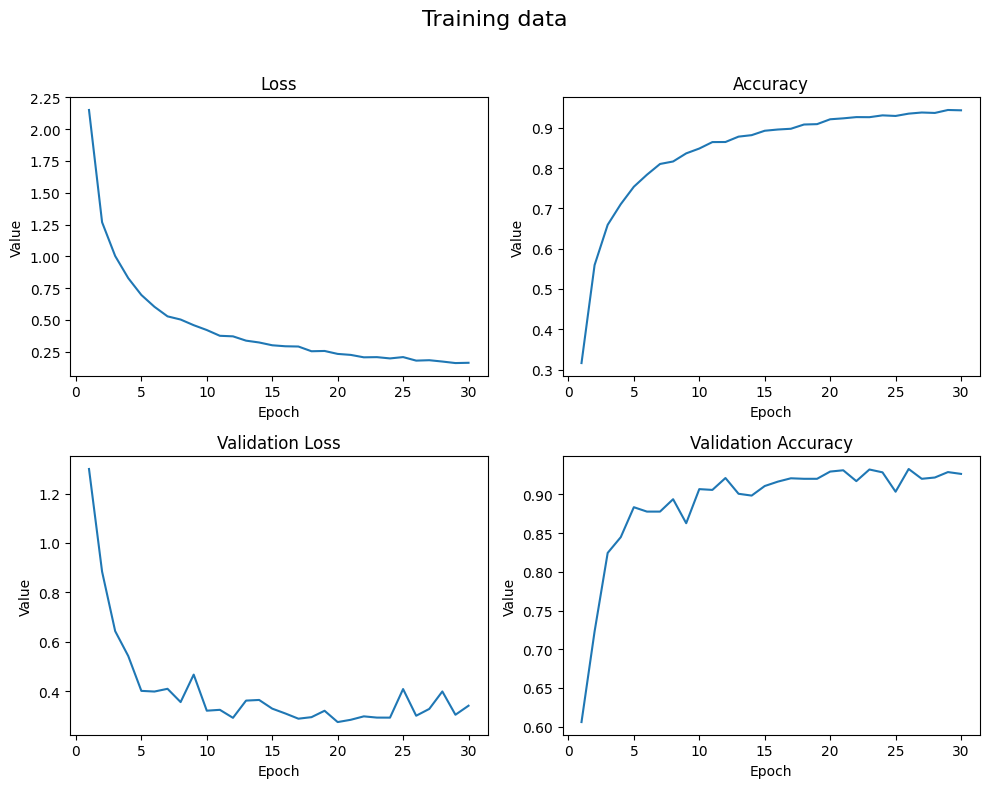

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

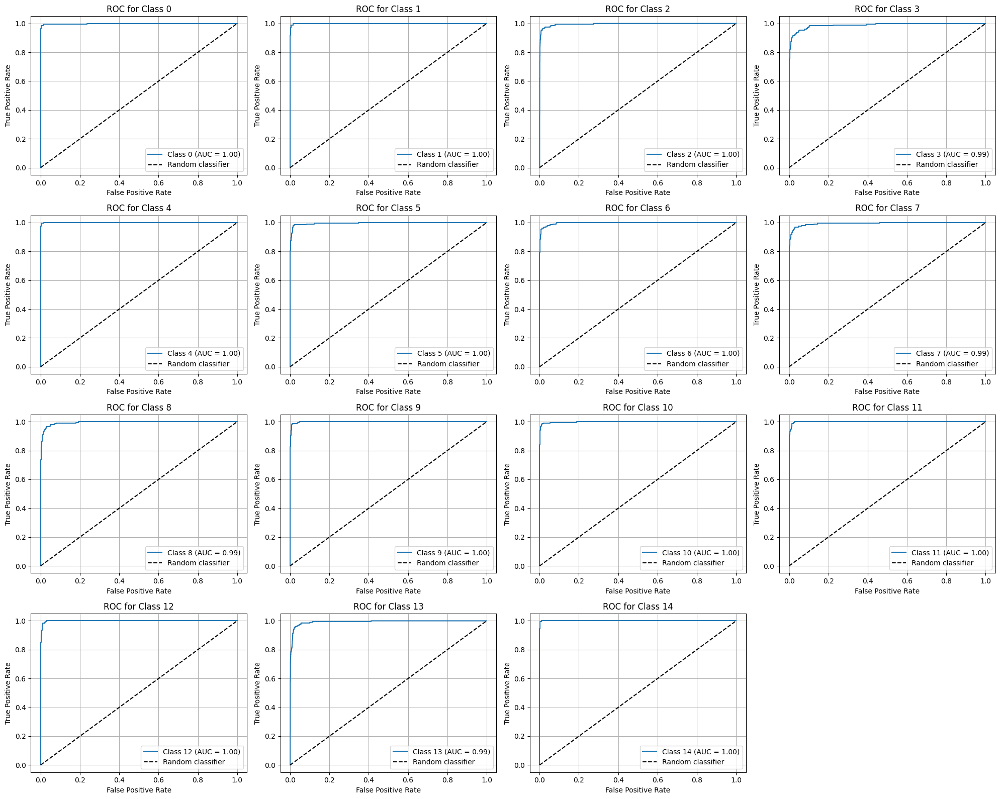

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f"Class {i} (AUC = {roc_auc[i]:.2f})")
    ax.plot([0, 1], [0, 1], "k--", label="Random classifier")
    ax.set_title(f"ROC for Class {i}")
    ax.set_xlabel("False Positive Rate")
    ax.set_ylabel("True Positive Rate")
    ax.legend(loc="lower right")
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis("off")

plt.tight_layout()
plt.show()

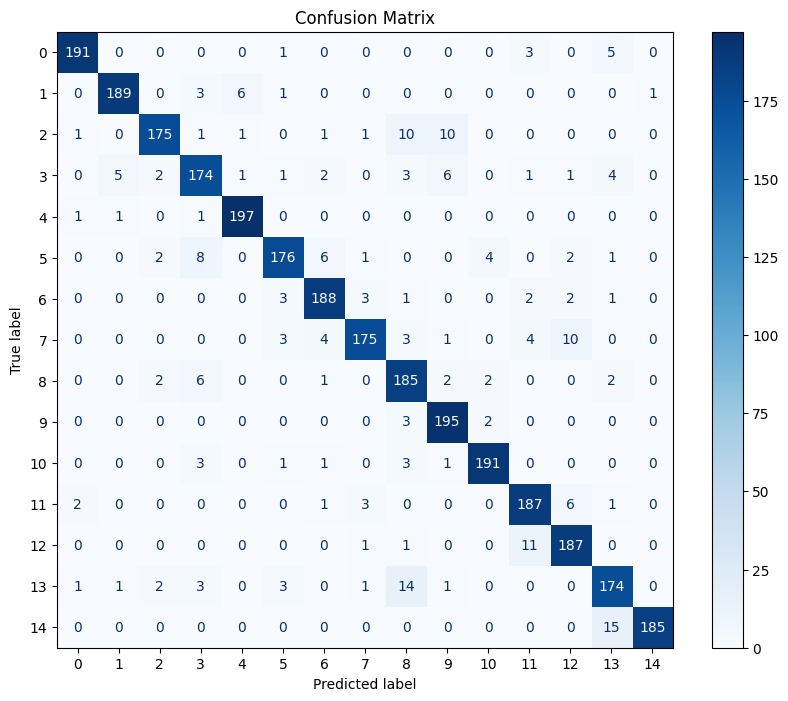

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap="Blues", colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))

Accuracy: 0.923


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.97      0.95      0.96       200
           1       0.96      0.94      0.95       200
           2       0.96      0.88      0.91       200
           3       0.87      0.87      0.87       200
           4       0.96      0.98      0.97       200
           5       0.93      0.88      0.90       200
           6       0.92      0.94      0.93       200
           7       0.95      0.88      0.91       200
           8       0.83      0.93      0.87       200
           9       0.90      0.97      0.94       200
          10       0.96      0.95      0.96       200
          11       0.90      0.94      0.92       200
          12       0.90      0.94      0.92       200
          13       0.86      0.87      0.86       200
          14       0.99      0.93      0.96       200

    accuracy                           0.92      3000
   macro avg       0.92      0.92      0.92      3000
weighted avg       0.92   

## Model batch normalization

In [22]:
model = Sequential([
    Input(shape=input_shape),
    Conv2D(32, (3, 3), activation="relu"),
    BatchNormalization(),
    MaxPool2D((2, 2)),
    Conv2D(64, (3, 3), activation="relu"),
    BatchNormalization(),
    MaxPool2D((2, 2)),
    Flatten(),
    Dense(128, activation="relu"),
    BatchNormalization(),
    Dense(num_classes, activation="softmax"),
])

In [23]:
model.compile(
    optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=["accuracy"]
)

In [24]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 222, 222, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 109, 109, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 186624)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │      23,888,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 15)                  │           1,935 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,910,223 (91.21 MB)

 Trainable params: 23,909,775 (91.21 MB)

 Non-trainable params: 448 (1.75 KB)

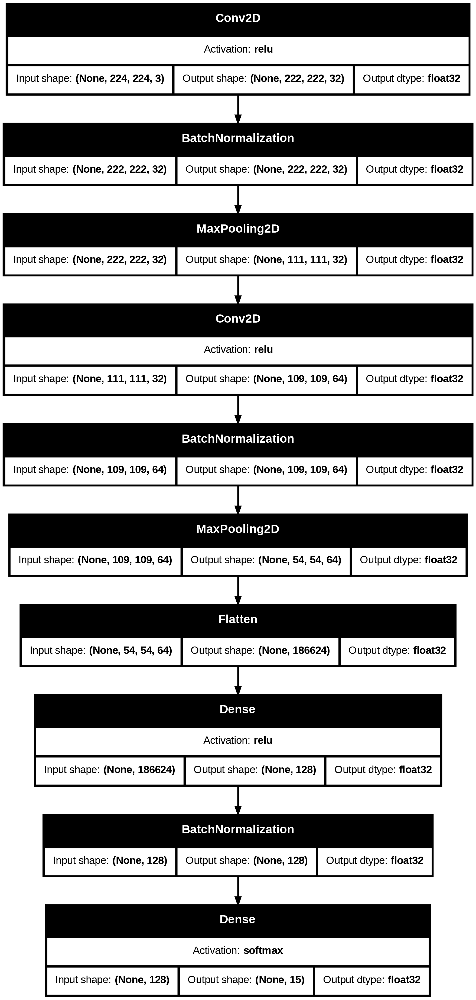

In [ ]:
try:
    plot_model(
        model,
        "model1_batchnorm.png",
        show_dtype=True,
        show_shapes=True,
        show_layer_activations=True,
    )
    display(Image("model1_batchnorm.png"))
except Exception as e:
    print(f"Error occurred: {e}")

In [25]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - accuracy: 0.6847 - loss: 1.1055 - val_accuracy: 0.3747 - val_loss: 2.6057
Epoch 2/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.9756 - loss: 0.1033 - val_accuracy: 0.9403 - val_loss: 0.1920
Epoch 3/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - accuracy: 0.9934 - loss: 0.0340 - val_accuracy: 0.8277 - val_loss: 0.7110
Epoch 4/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - accuracy: 0.9976 - loss: 0.0145 - val_accuracy: 0.8063 - val_loss: 0.6920
Epoch 5/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - accuracy: 0.9927 - loss: 0.0316 - val_accuracy: 0.9460 - val_loss: 0.1896
Epoch 6/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - accuracy: 0.9985 - loss: 0.0117 - val_accuracy: 0.9573 - val_loss: 0.1407
Epoch 7/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - accuracy: 0.9979 - loss: 0.0100 - val_accuracy: 0.8173 - val_loss: 0.7269
Epoch 8/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - accuracy: 0.9915 - loss: 0.0342 -

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f"model1_batchnorm - loss: {loss}, accuracy: {acc}")

model_batchnormn - loss: 0.13522231578826904, accuracy: 0.9573333263397217


In [27]:
training_data = history.history

In [28]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [29]:
training_data["loss"]

[0.61961829662323,
 0.10154341161251068,
 0.027117526158690453,
 0.01114717498421669,
 0.03141247108578682,
 0.009948930703103542,
 0.014825795777142048,
 0.03302258625626564,
 0.013616420328617096,
 0.011833391152322292,
 0.01731010526418686,
 0.011826527304947376,
 0.014417161233723164,
 0.01638239063322544,
 0.007386902812868357,
 0.012149376794695854]

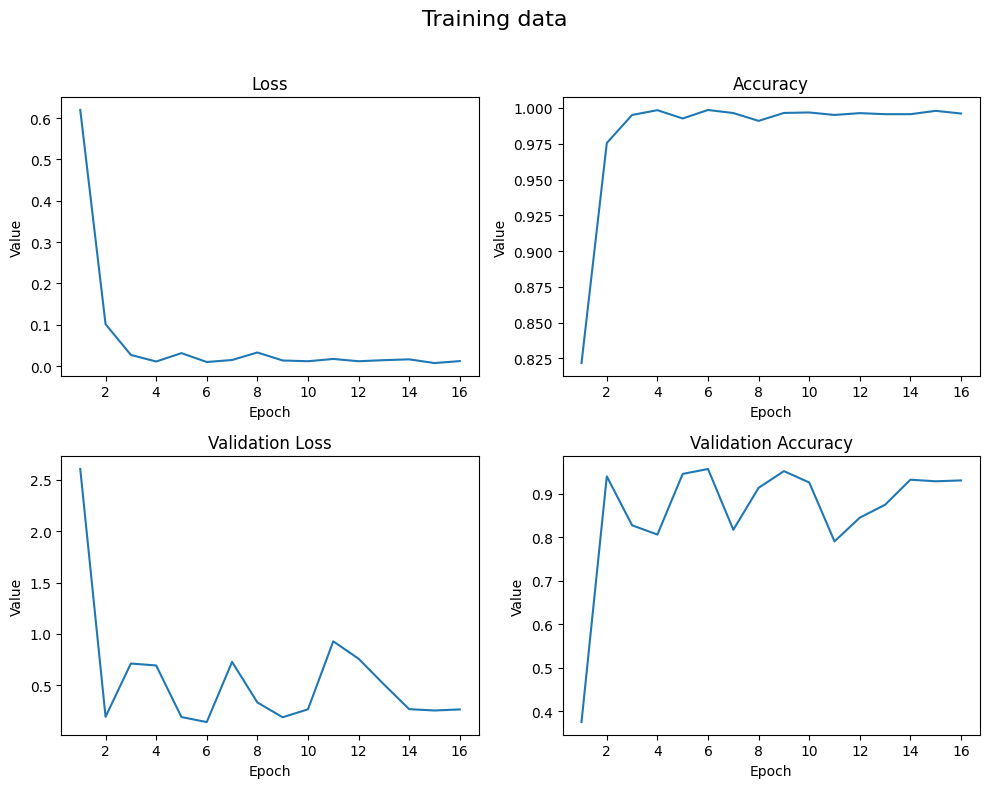

In [30]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [31]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

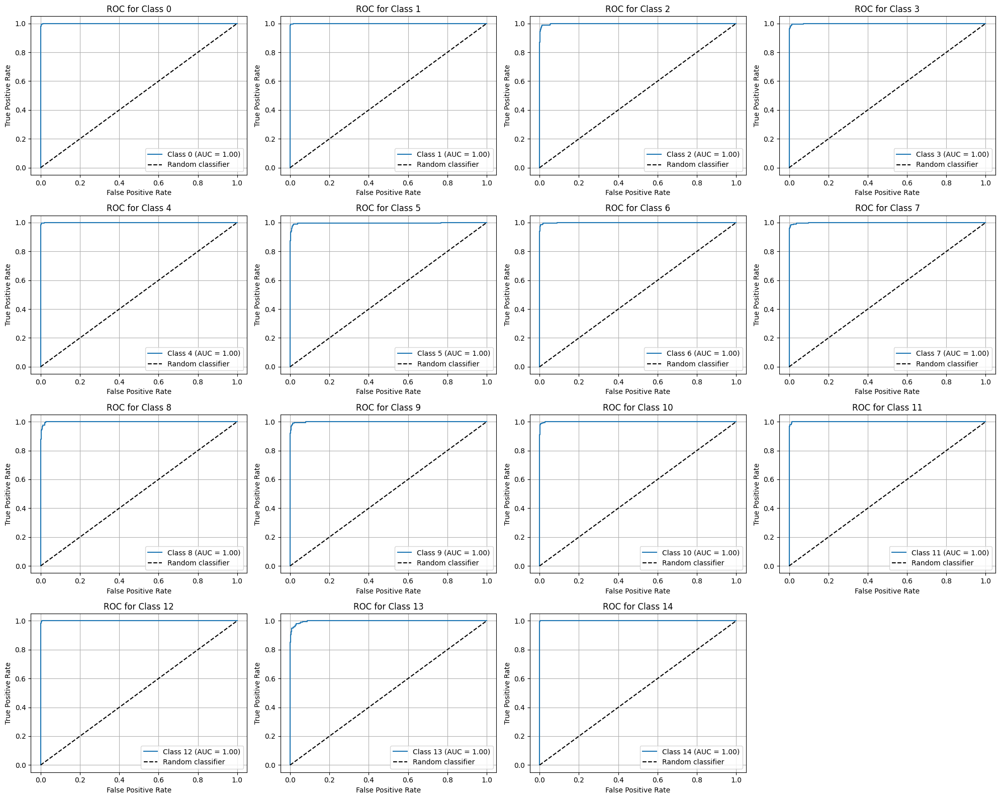

In [32]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f"Class {i} (AUC = {roc_auc[i]:.2f})")
    ax.plot([0, 1], [0, 1], "k--", label="Random classifier")
    ax.set_title(f"ROC for Class {i}")
    ax.set_xlabel("False Positive Rate")
    ax.set_ylabel("True Positive Rate")
    ax.legend(loc="lower right")
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis("off")

plt.tight_layout()
plt.show()

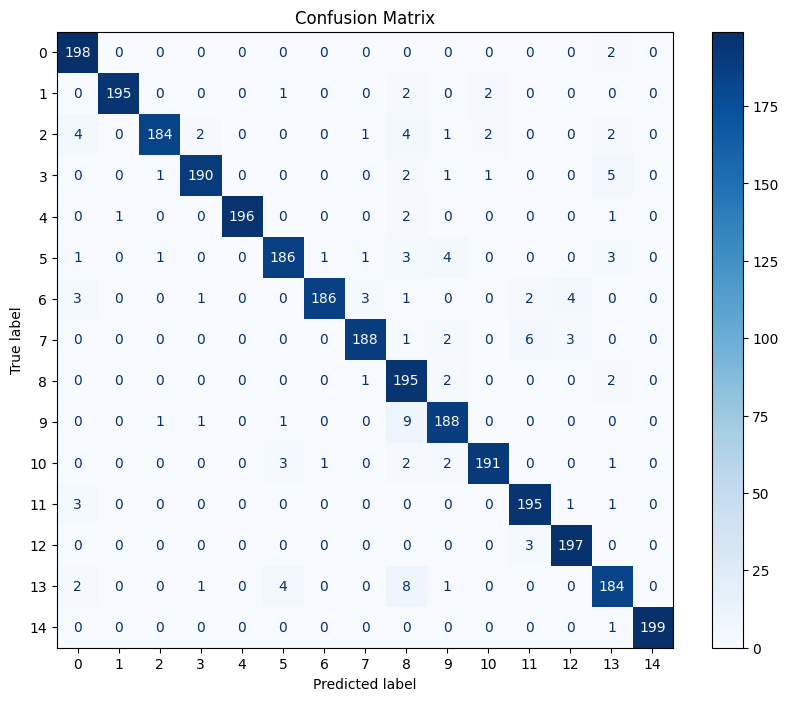

In [33]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [34]:
print("Accuracy:", accuracy_score(y_test, y_pred))

Accuracy: 0.9573333333333334


In [35]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.94      0.99      0.96       200
           1       0.99      0.97      0.98       200
           2       0.98      0.92      0.95       200
           3       0.97      0.95      0.96       200
           4       1.00      0.98      0.99       200
           5       0.95      0.93      0.94       200
           6       0.99      0.93      0.96       200
           7       0.97      0.94      0.95       200
           8       0.85      0.97      0.91       200
           9       0.94      0.94      0.94       200
          10       0.97      0.95      0.96       200
          11       0.95      0.97      0.96       200
          12       0.96      0.98      0.97       200
          13       0.91      0.92      0.92       200
          14       1.00      0.99      1.00       200

    accuracy                           0.96      3000
   macro avg       0.96      0.96      0.96      3000
weighted avg       0.96   

## Model elasticnet (l1 = 0.01; l2 = 0.01)

In [ ]:
input_shape = X_train.shape[1:]
num_classes = len(np.unique(y_train))

In [ ]:
model = Sequential([
    Input(shape=input_shape),
    Conv2D(32, (3, 3), activation='relu', kernel_regularizer=l1_l2(l1=0.01, l2=0.01)),
    MaxPool2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l1_l2(l1=0.01, l2=0.01)),
    MaxPool2D((2, 2)),

    Flatten(),
    Dense(128, activation='relu', kernel_regularizer=l1_l2(l1=0.01, l2=0.01)),
    Dense(num_classes, activation='softmax'),
])

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_18 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_18 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_19 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_19 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_9 (Flatten)                  │ (None, 186624)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_18 (Dense)                     │ (None, 128)                 │      23,888,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_19 (Dense)                     │ (None, 15)                  │           1,935 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,909,327 (91.21 MB)

 Trainable params: 23,909,327 (91.21 MB)

 Non-trainable params: 0 (0.00 B)

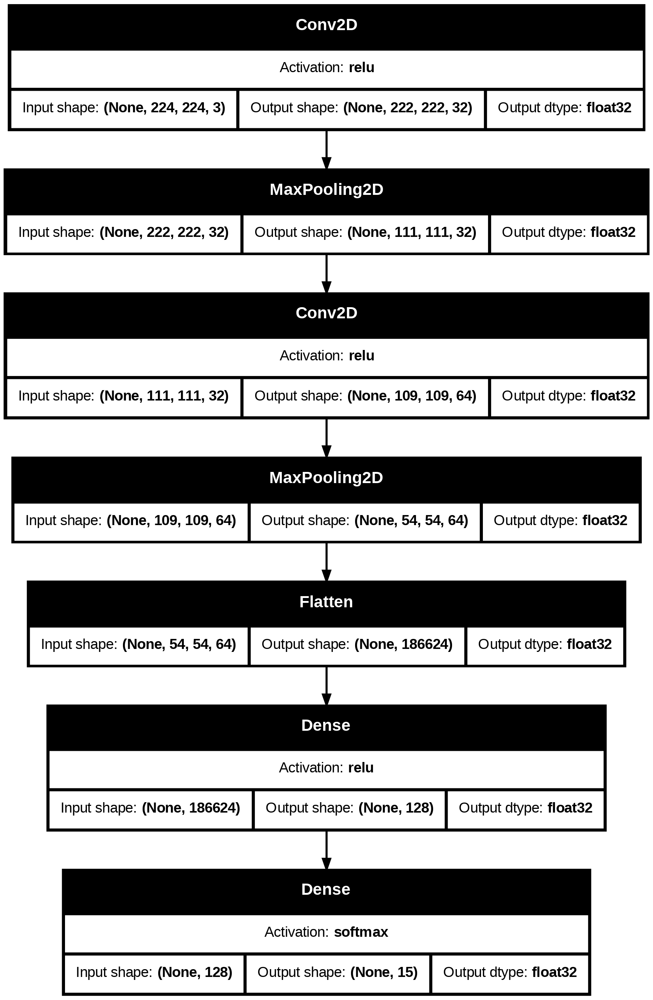

In [ ]:
try:
    plot_model(model, 'model1_l1_l2.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model1_l1_l2.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10,
                                                  restore_best_weights=True, verbose=1)

epochs = 100
batch_size = 32

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - accuracy: 0.0745 - loss: 70.1214 - val_accuracy: 0.0667 - val_loss: 31.4363
Epoch 2/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.0651 - loss: 30.8575 - val_accuracy: 0.0667 - val_loss: 30.0985
Epoch 3/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.0678 - loss: 30.4909 - val_accuracy: 0.0667 - val_loss: 30.3520
Epoch 4/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.0665 - loss: 30.7287 - val_accuracy: 0.0667 - val_loss: 31.4640
Epoch 5/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.0656 - loss: 31.0611 - val_accuracy: 0.0667 - val_loss: 32.0579
Epoch 6/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.0658 - loss: 31.7077 - val_accuracy: 0.0667 - val_loss: 32.4518
Epoch 7/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.0662 - loss: 31.7735 - val_accuracy: 0.0667 - val_loss: 31.8739
Epoch 8/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.0640 - 

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f'model1_l1_l2 - loss: {loss}, accuracy: {acc}')

model1_l1_l2 - loss: 30.09846305847168, accuracy: 0.06666667014360428


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[40.15592956542969,
 30.67678451538086,
 30.59672737121582,
 30.76321029663086,
 31.279584884643555,
 31.730714797973633,
 31.774560928344727,
 31.795536041259766,
 31.80348777770996,
 31.803560256958008,
 31.806161880493164,
 31.807153701782227]

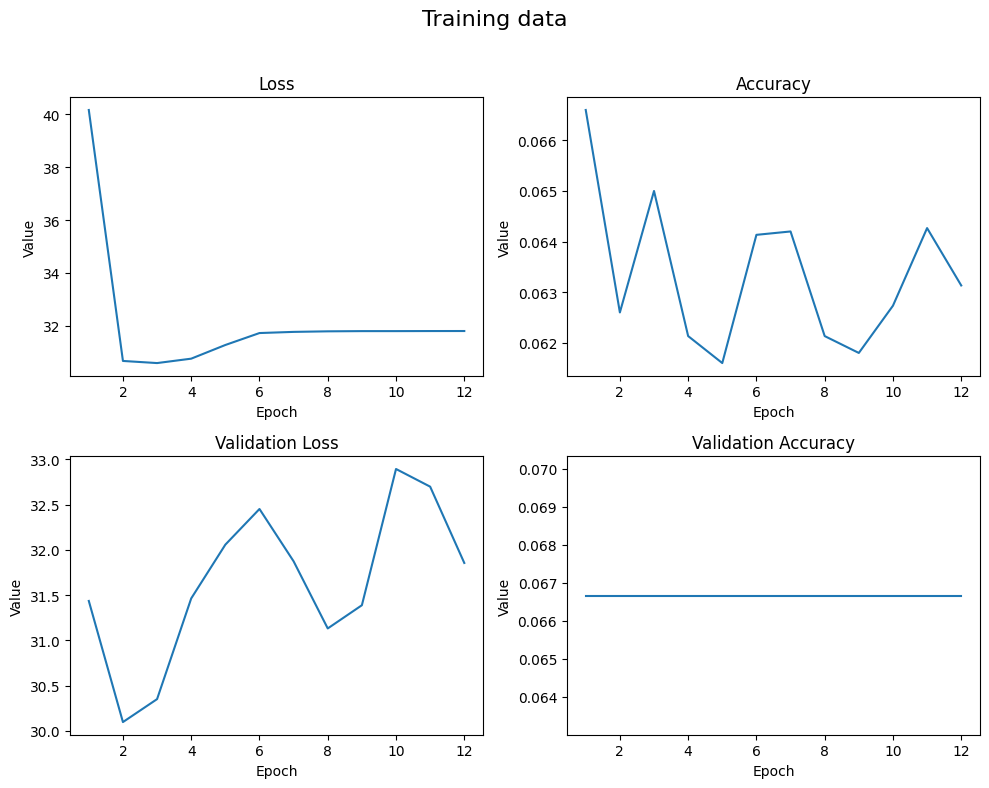

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

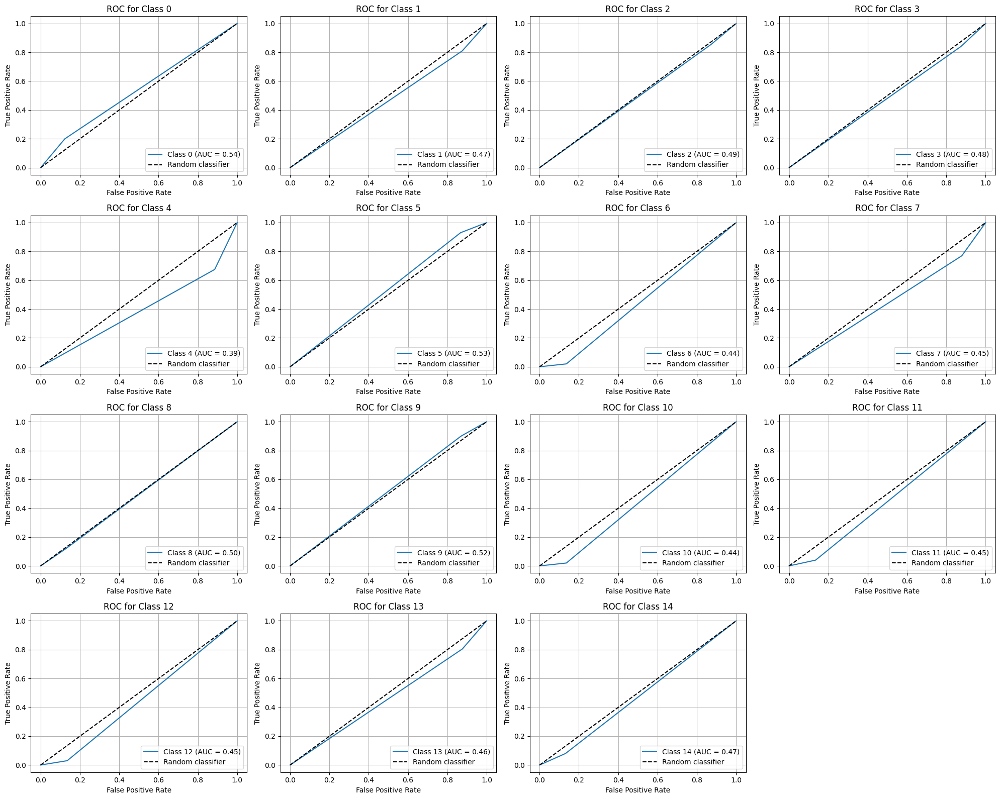

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

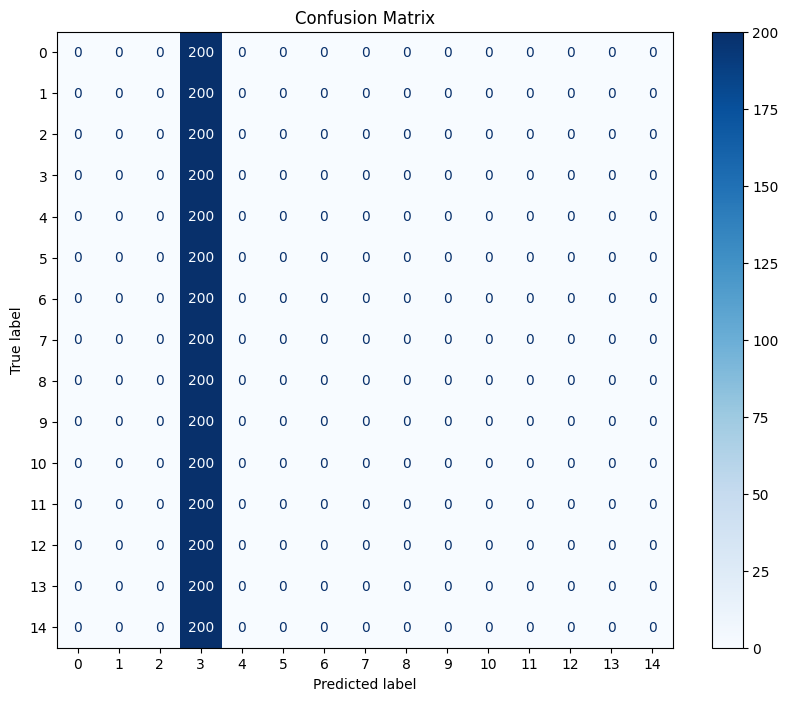

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.06666666666666667


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       200
           1       0.00      0.00      0.00       200
           2       0.00      0.00      0.00       200
           3       0.07      1.00      0.12       200
           4       0.00      0.00      0.00       200
           5       0.00      0.00      0.00       200
           6       0.00      0.00      0.00       200
           7       0.00      0.00      0.00       200
           8       0.00      0.00      0.00       200
           9       0.00      0.00      0.00       200
          10       0.00      0.00      0.00       200
          11       0.00      0.00      0.00       200
          12       0.00      0.00      0.00       200
          13       0.00      0.00      0.00       200
          14       0.00      0.00      0.00       200

    accuracy                           0.07      3000
   macro avg       0.00      0.07      0.01      3000
weighted avg       0.00   

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


## Model batchnormalization; dropout = 0.03;

In [ ]:
model = Sequential([
    Input(shape=input_shape),
    Conv2D(32, (3, 3), activation='relu'),
    BatchNormalization(),
    MaxPool2D((2, 2)),
    Dropout(0.3),
    Conv2D(64, (3, 3), activation='relu'),
    BatchNormalization(),
    MaxPool2D((2, 2)),
    Dropout(0.3),

    Flatten(),
    Dense(128, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),
    Dense(len(np.unique(y_train)), activation='softmax'),
])

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_20 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 222, 222, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_20 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_9 (Dropout)                  │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_21 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 109, 109, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_21 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_10 (Dropout)                 │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_10 (Flatten)                 │ (None, 186624)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_20 (Dense)                     │ (None, 128)                 │      23,888,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_11 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_21 (Dense)                     │ (None, 15)                  │           1,935 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,910,223 (91.21 MB)

 Trainable params: 23,909,775 (91.21 MB)

 Non-trainable params: 448 (1.75 KB)

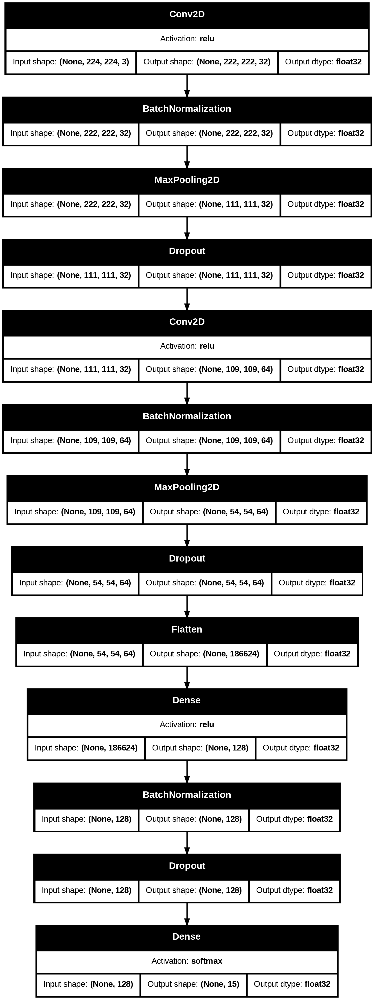

In [ ]:
try:
    plot_model(model, 'model1_dropout_batchnorm.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model1_dropout_batchnorm.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - accuracy: 0.5622 - loss: 1.4700 - val_accuracy: 0.4410 - val_loss: 1.7260
Epoch 2/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.8671 - loss: 0.4464 - val_accuracy: 0.8760 - val_loss: 0.4194
Epoch 3/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9532 - loss: 0.1792 - val_accuracy: 0.5880 - val_loss: 2.4114
Epoch 4/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9709 - loss: 0.1136 - val_accuracy: 0.8040 - val_loss: 0.6231
Epoch 5/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9793 - loss: 0.0778 - val_accuracy: 0.9187 - val_loss: 0.2560
Epoch 6/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9825 - loss: 0.0584 - val_accuracy: 0.9103 - val_loss: 0.2979
Epoch 7/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9856 - loss: 0.0504 - val_accuracy: 0.9360 - val_loss: 0.2071
Epoch 8/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9899 - loss: 0.0365 -

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f'model1_dropout_batchnorm - loss: {loss}, accuracy: {acc}')

model1_dropout_batchnorm - loss: 0.14505214989185333, accuracy: 0.9593333601951599


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[1.0543091297149658,
 0.3808305859565735,
 0.17260946333408356,
 0.10580319911241531,
 0.07092726975679398,
 0.05523804947733879,
 0.044758763164281845,
 0.04047641158103943,
 0.05139559507369995,
 0.041760098189115524,
 0.03986654058098793,
 0.09173192828893661,
 0.09480518847703934,
 0.03335832431912422,
 0.023234130814671516,
 0.018651841208338737,
 0.01987486332654953,
 0.018047697842121124,
 0.01845853589475155,
 0.015766799449920654,
 0.014870774932205677,
 0.014349360018968582,
 0.013921079225838184,
 0.018894914537668228,
 0.015858905389904976]

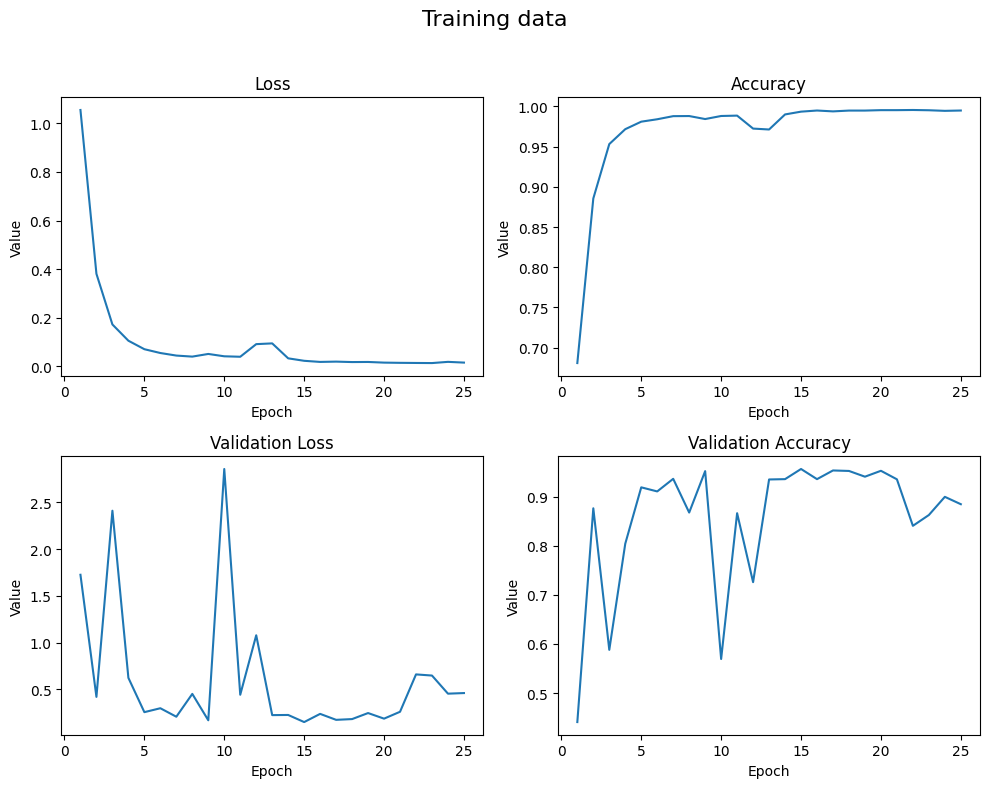

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

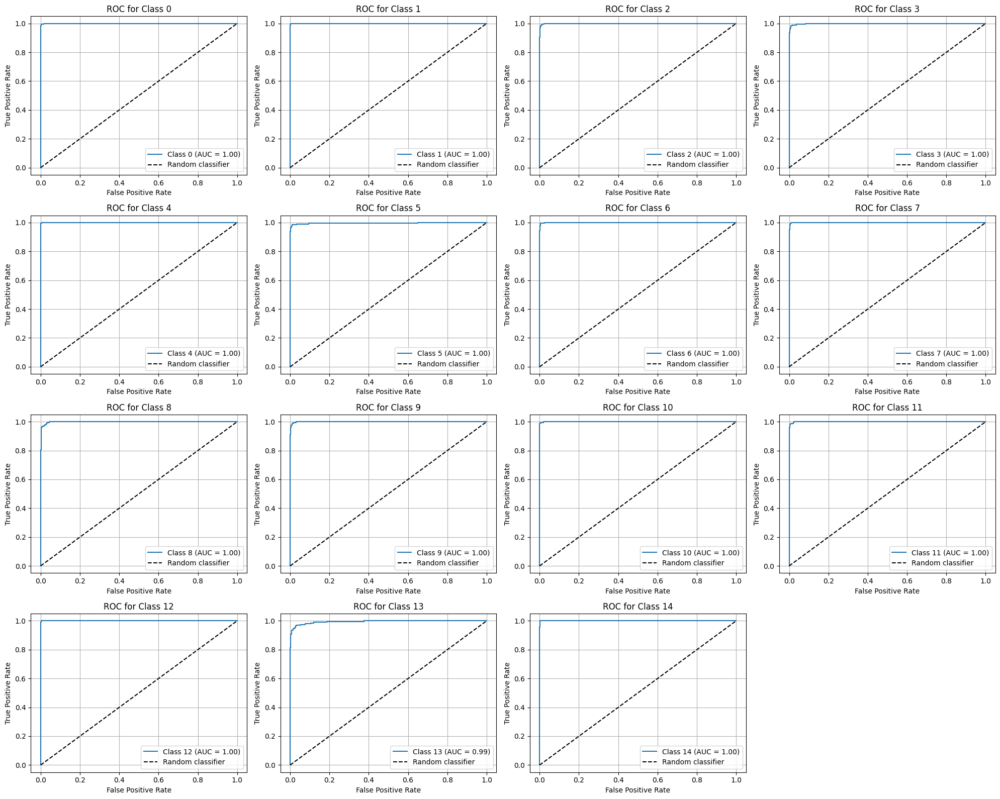

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

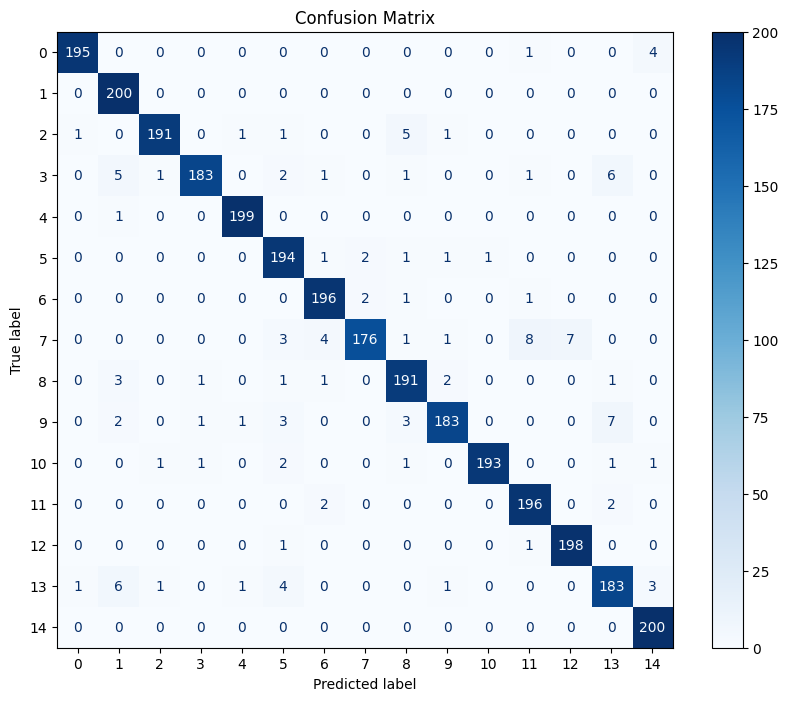

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.9593333333333334


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      0.97      0.98       200
           1       0.92      1.00      0.96       200
           2       0.98      0.95      0.97       200
           3       0.98      0.92      0.95       200
           4       0.99      0.99      0.99       200
           5       0.92      0.97      0.94       200
           6       0.96      0.98      0.97       200
           7       0.98      0.88      0.93       200
           8       0.94      0.95      0.95       200
           9       0.97      0.92      0.94       200
          10       0.99      0.96      0.98       200
          11       0.94      0.98      0.96       200
          12       0.97      0.99      0.98       200
          13       0.92      0.92      0.92       200
          14       0.96      1.00      0.98       200

    accuracy                           0.96      3000
   macro avg       0.96      0.96      0.96      3000
weighted avg       0.96   

# Extended architecture

## Model base

In [ ]:
inputs = Input(shape=X_train.shape[1:])
x = Conv2D(32, (3, 3), activation='relu')(inputs)
x = MaxPool2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation='relu')(x)
x = MaxPool2D((2, 2))(x)
x = Conv2D(128, (3, 3), activation='relu')(x)
x = MaxPool2D((2, 2))(x)

x = Flatten()(x)
x = Dense(128, activation='relu')(x)
outputs = Dense(len(np.unique(y_train)), activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_11 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_22 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_22 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_23 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_23 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_24 (Conv2D)                   │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_24 (MaxPooling2D)      │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_11 (Flatten)                 │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_22 (Dense)                     │ (None, 128)                 │      11,075,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_23 (Dense)                     │ (None, 15)                  │           1,935 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,170,895 (42.61 MB)

 Trainable params: 11,170,895 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

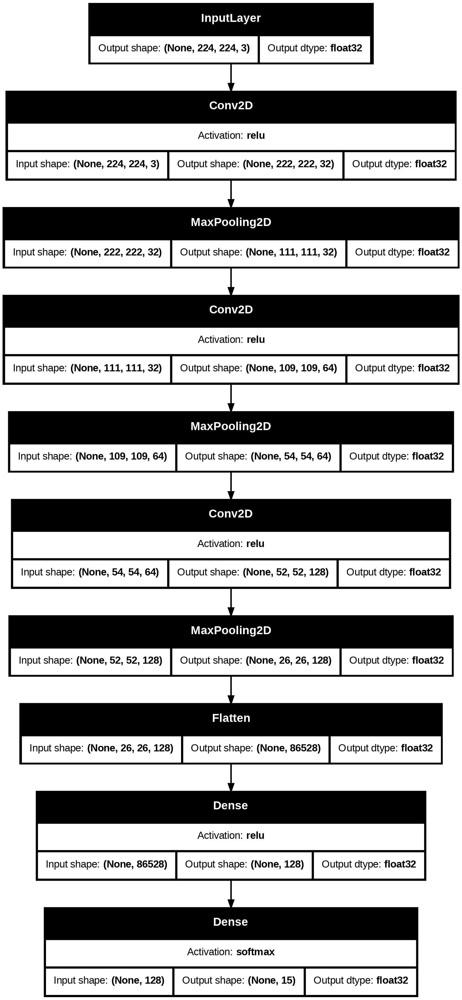

In [ ]:
try:
    plot_model(model, 'model2_base.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model2_base.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10,
                                                  restore_best_weights=True, verbose=1)

epochs = 100
batch_size = 32

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - accuracy: 0.4578 - loss: 1.6538 - val_accuracy: 0.8610 - val_loss: 0.4752
Epoch 2/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.8949 - loss: 0.3457 - val_accuracy: 0.8773 - val_loss: 0.3704
Epoch 3/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9568 - loss: 0.1357 - val_accuracy: 0.9163 - val_loss: 0.2668
Epoch 4/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9737 - loss: 0.0863 - val_accuracy: 0.9437 - val_loss: 0.2231
Epoch 5/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9786 - loss: 0.0688 - val_accuracy: 0.9300 - val_loss: 0.2314
Epoch 6/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9908 - loss: 0.0331 - val_accuracy: 0.9367 - val_loss: 0.2802
Epoch 7/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9917 - loss: 0.0305 - val_accuracy: 0.8863 - val_loss: 0.5098
Epoch 8/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9776 - loss: 0.0716 -

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f'model2_base - loss: {loss}, accuracy: {acc}')

model2_base - loss: 0.1781754344701767, accuracy: 0.9546666741371155


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[1.061112880706787,
 0.3001815378665924,
 0.14292927086353302,
 0.08848100900650024,
 0.08976811170578003,
 0.037339210510253906,
 0.047414183616638184,
 0.0747310221195221,
 0.026224536821246147,
 0.022313933819532394,
 0.04687749966979027,
 0.027127742767333984,
 0.034389592707157135,
 0.030378542840480804]

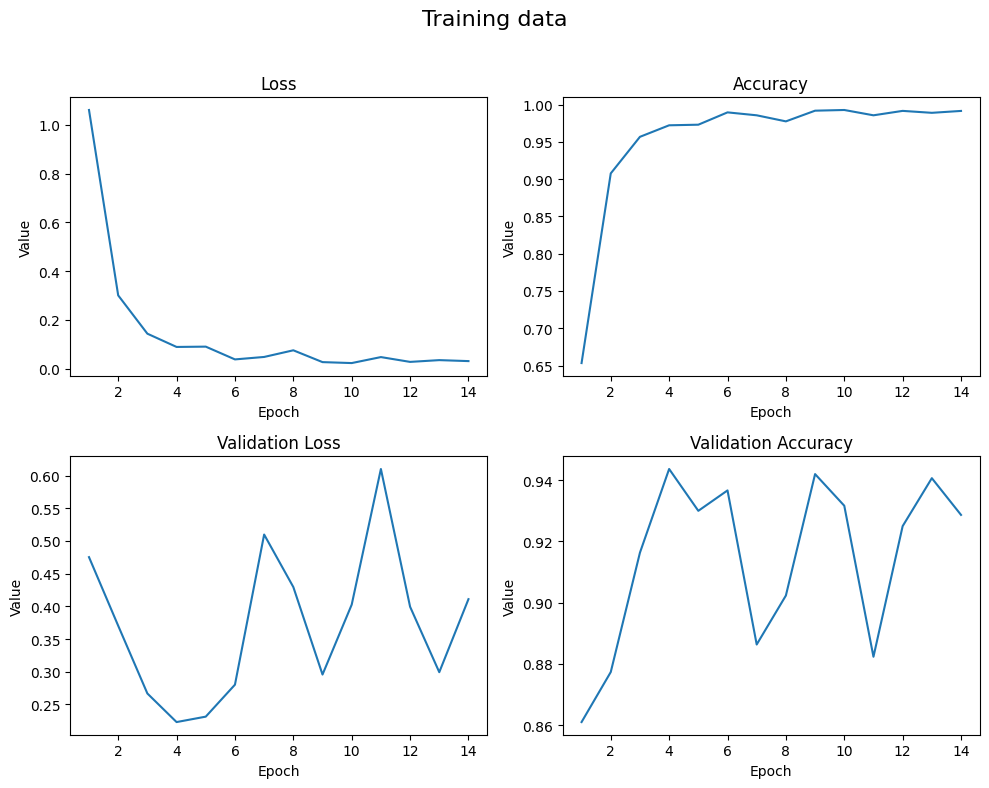

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

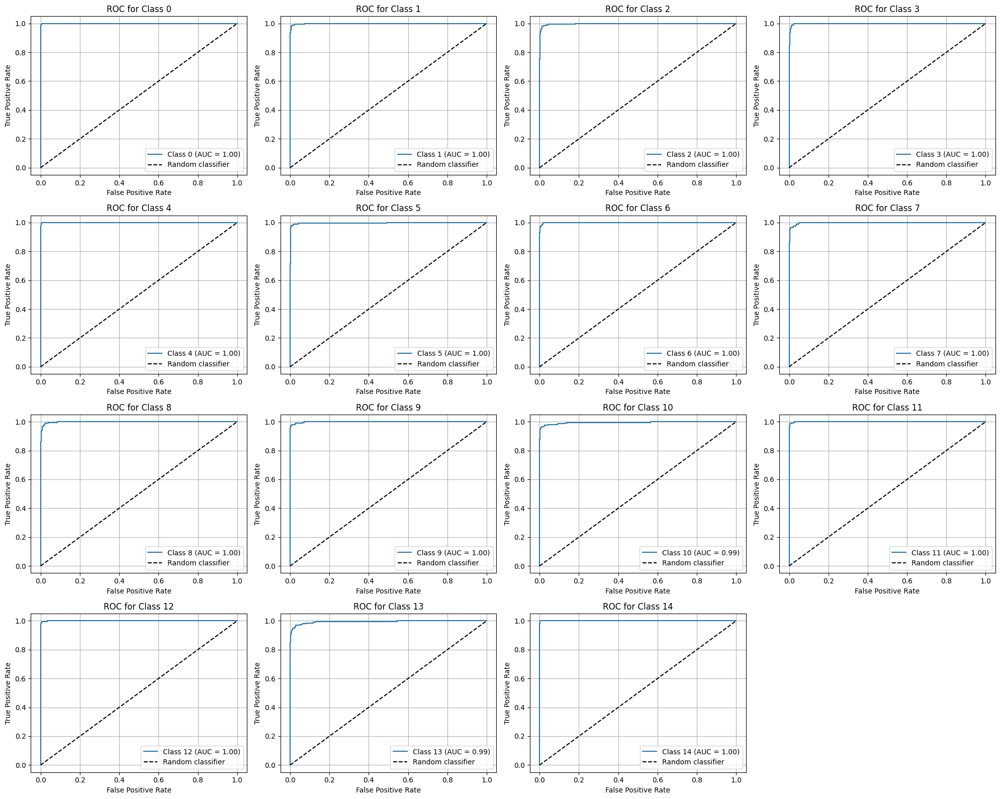

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

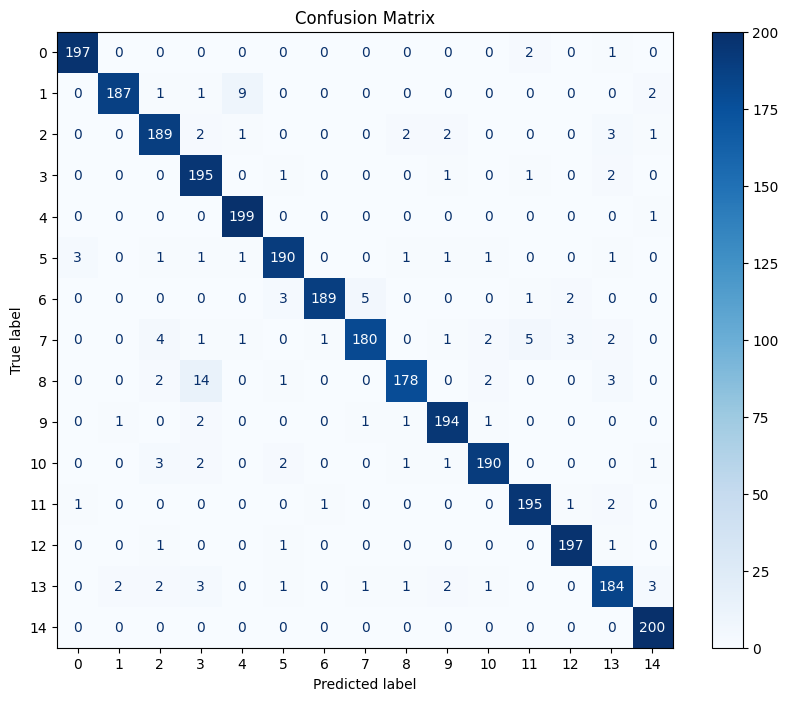

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.9546666666666667


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98       200
           1       0.98      0.94      0.96       200
           2       0.93      0.94      0.94       200
           3       0.88      0.97      0.93       200
           4       0.94      0.99      0.97       200
           5       0.95      0.95      0.95       200
           6       0.99      0.94      0.97       200
           7       0.96      0.90      0.93       200
           8       0.97      0.89      0.93       200
           9       0.96      0.97      0.97       200
          10       0.96      0.95      0.96       200
          11       0.96      0.97      0.97       200
          12       0.97      0.98      0.98       200
          13       0.92      0.92      0.92       200
          14       0.96      1.00      0.98       200

    accuracy                           0.95      3000
   macro avg       0.96      0.95      0.95      3000
weighted avg       0.96   

## Model l1 = 0.01

In [ ]:
input_shape = X_train.shape[1:]
num_classes = len(np.unique(y_train))

In [ ]:
inputs = Input(shape=input_shape)
x = Conv2D(32, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(inputs)
x = MaxPool2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(x)
x = MaxPool2D((2, 2))(x)
x = Conv2D(128, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(x)
x = MaxPool2D((2, 2))(x)

x = Flatten()(x)
x = Dense(128, activation='relu', kernel_regularizer=l1(0.01))(x)
outputs = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "functional_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_12 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_25 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_25 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_26 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_26 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_27 (Conv2D)                   │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_27 (MaxPooling2D)      │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_12 (Flatten)                 │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_24 (Dense)                     │ (None, 128)                 │      11,075,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_25 (Dense)                     │ (None, 15)                  │           1,935 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,170,895 (42.61 MB)

 Trainable params: 11,170,895 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

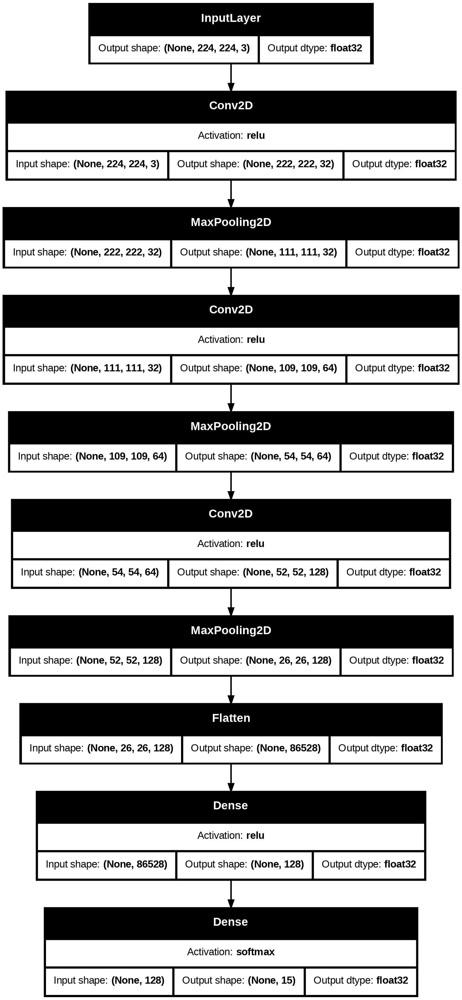

In [ ]:
try:
    plot_model(model, 'model2_l1_001.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model2_l1_001.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10,
                                                  restore_best_weights=True, verbose=1)

epochs = 100
batch_size = 32

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - accuracy: 0.0709 - loss: 49.4771 - val_accuracy: 0.0667 - val_loss: 16.9813
Epoch 2/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.0644 - loss: 16.7464 - val_accuracy: 0.0667 - val_loss: 16.8374
Epoch 3/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.0638 - loss: 16.7401 - val_accuracy: 0.0667 - val_loss: 16.4040
Epoch 4/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.0659 - loss: 16.7424 - val_accuracy: 0.0667 - val_loss: 16.6464
Epoch 5/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.0633 - loss: 16.7388 - val_accuracy: 0.0667 - val_loss: 16.6564
Epoch 6/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.0648 - loss: 16.7413 - val_accuracy: 0.0667 - val_loss: 17.2007
Epoch 7/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.0649 - loss: 16.7471 - val_accuracy: 0.0667 - val_loss: 16.9494
Epoch 8/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.0655 - 

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f'model2_l1_001 - loss: {loss}, accuracy: {acc}')

model2_l1_001 - loss: 16.404024124145508, accuracy: 0.06666667014360428


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[24.171297073364258,
 16.74616813659668,
 16.7431583404541,
 16.743776321411133,
 16.7427921295166,
 16.741552352905273,
 16.742782592773438,
 16.74103355407715,
 16.74167251586914,
 16.740381240844727,
 16.739364624023438,
 16.74025535583496,
 16.740856170654297]

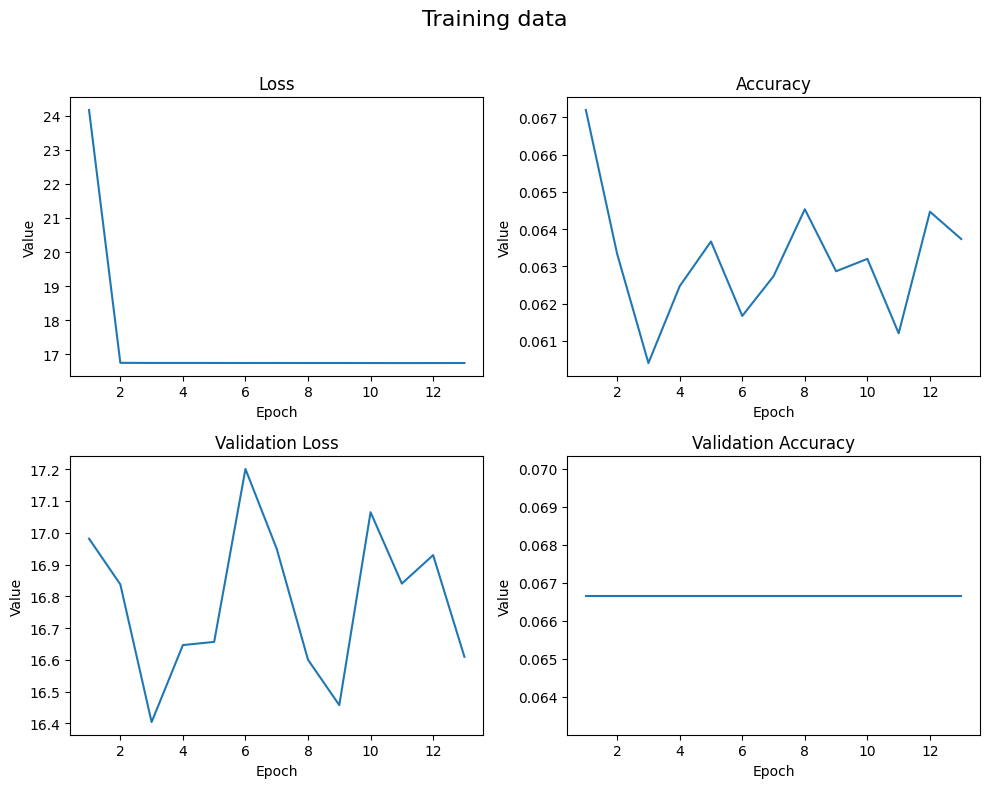

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

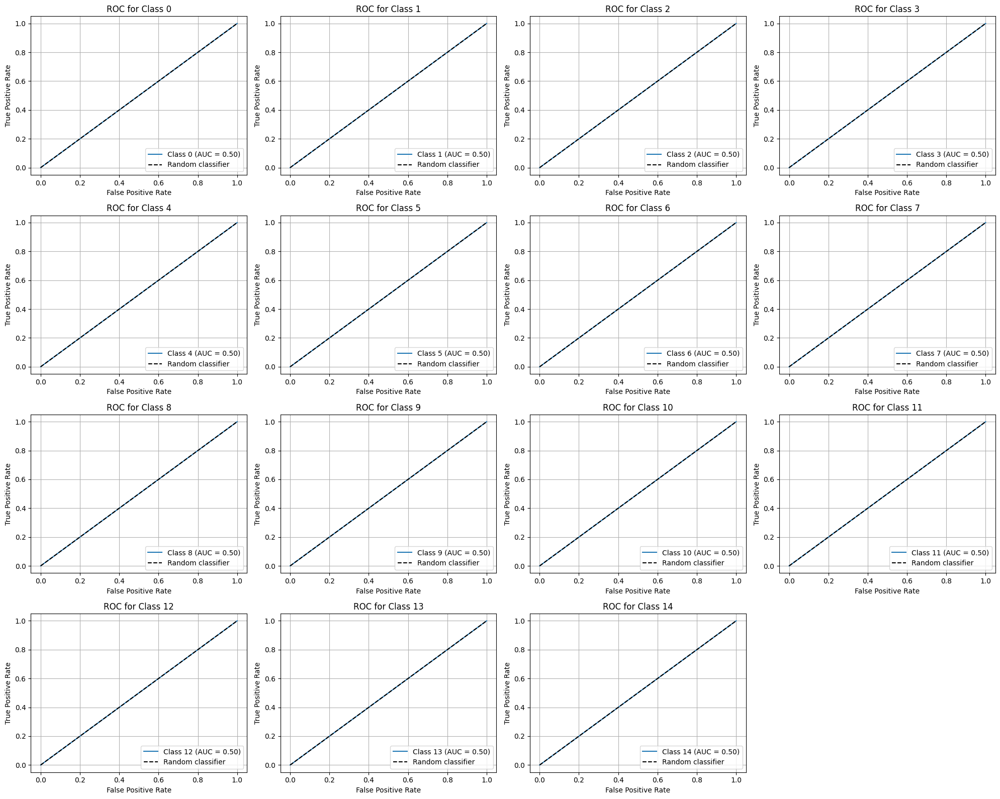

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

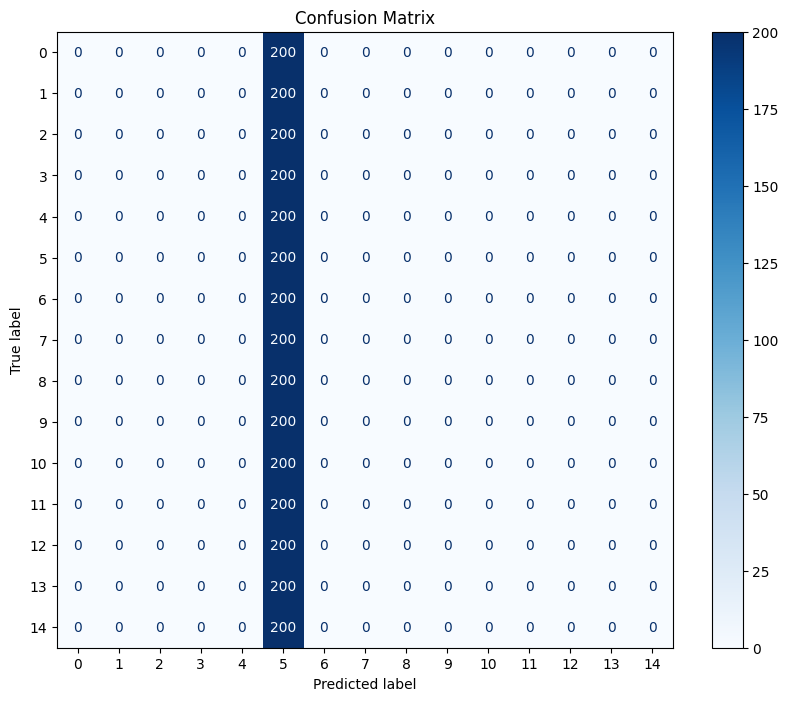

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.06666666666666667


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       200
           1       0.00      0.00      0.00       200
           2       0.00      0.00      0.00       200
           3       0.00      0.00      0.00       200
           4       0.00      0.00      0.00       200
           5       0.07      1.00      0.12       200
           6       0.00      0.00      0.00       200
           7       0.00      0.00      0.00       200
           8       0.00      0.00      0.00       200
           9       0.00      0.00      0.00       200
          10       0.00      0.00      0.00       200
          11       0.00      0.00      0.00       200
          12       0.00      0.00      0.00       200
          13       0.00      0.00      0.00       200
          14       0.00      0.00      0.00       200

    accuracy                           0.07      3000
   macro avg       0.00      0.07      0.01      3000
weighted avg       0.00   

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


## Model l1 = 0.001

In [ ]:
inputs = Input(shape=input_shape)
x = Conv2D(32, (3, 3), activation='relu', kernel_regularizer=l1(0.001))(inputs)
x = MaxPool2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l1(0.001))(x)
x = MaxPool2D((2, 2))(x)
x = Conv2D(128, (3, 3), activation='relu', kernel_regularizer=l1(0.001))(x)
x = MaxPool2D((2, 2))(x)

x = Flatten()(x)
x = Dense(128, activation='relu', kernel_regularizer=l1(0.001))(x)
outputs = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "functional_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_13 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_28 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_28 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_29 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_29 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_30 (Conv2D)                   │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_30 (MaxPooling2D)      │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_13 (Flatten)                 │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_26 (Dense)                     │ (None, 128)                 │      11,075,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_27 (Dense)                     │ (None, 15)                  │           1,935 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,170,895 (42.61 MB)

 Trainable params: 11,170,895 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

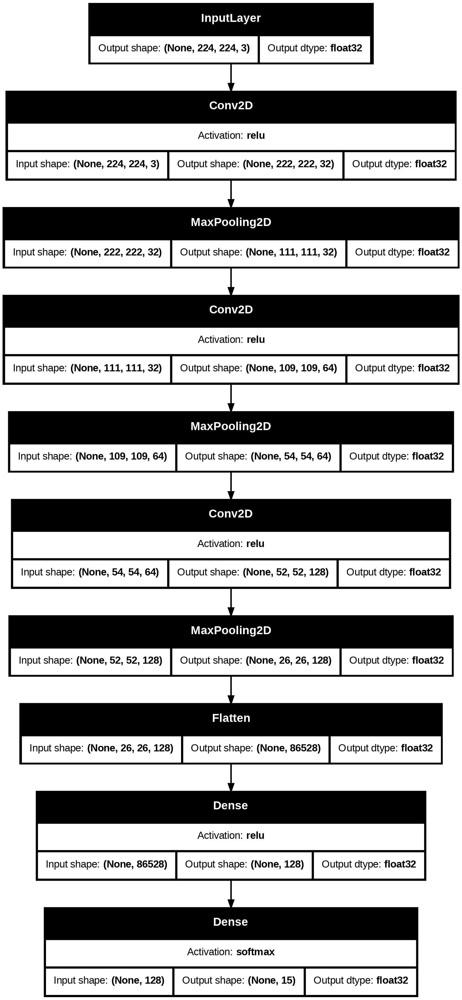

In [ ]:
try:
    plot_model(model, 'model2_l1_0001.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model2_l1_0001.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - accuracy: 0.3025 - loss: 7.8122 - val_accuracy: 0.5063 - val_loss: 3.5742
Epoch 2/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.5457 - loss: 3.4526 - val_accuracy: 0.5833 - val_loss: 3.2664
Epoch 3/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.6094 - loss: 3.2296 - val_accuracy: 0.6347 - val_loss: 3.0463
Epoch 4/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.6430 - loss: 3.1091 - val_accuracy: 0.5863 - val_loss: 3.2837
Epoch 5/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.6587 - loss: 3.0519 - val_accuracy: 0.6640 - val_loss: 3.0662
Epoch 6/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.6872 - loss: 2.9650 - val_accuracy: 0.6603 - val_loss: 3.0355
Epoch 7/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.6889 - loss: 2.9478 - val_accuracy: 0.7093 - val_loss: 2.9539
Epoch 8/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.7084 - loss: 2.9268 -

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f'model2_l1_0001 - loss: {loss}, accuracy: {acc}')

model2_l1_0001 - loss: 2.4783573150634766, accuracy: 0.824999988079071


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[4.782561302185059,
 3.4066402912139893,
 3.2184481620788574,
 3.1118314266204834,
 3.034971237182617,
 2.976734161376953,
 2.9151649475097656,
 2.9180479049682617,
 2.8406009674072266,
 2.7754926681518555,
 2.7461187839508057,
 2.7320361137390137,
 2.688032865524292,
 2.6590633392333984,
 2.6472277641296387,
 2.6269218921661377,
 2.605278730392456,
 2.6072261333465576,
 2.5833213329315186,
 2.5744588375091553,
 2.56577205657959,
 2.5539841651916504,
 2.5445656776428223,
 2.5383048057556152,
 2.5223424434661865,
 2.5295190811157227,
 2.504779100418091,
 2.5062949657440186,
 2.496436357498169,
 2.4820542335510254,
 2.4949824810028076,
 2.476696729660034,
 2.4685003757476807,
 2.487041473388672,
 2.464859962463379,
 2.459068536758423,
 2.445544481277466,
 2.454369068145752,
 2.4553115367889404,
 2.4378278255462646,
 2.4597249031066895,
 2.423468589782715,
 2.4458210468292236,
 2.429898500442505,
 2.4088046550750732,
 2.420499801635742,
 2.4293787479400635,
 2.4247889518737793,
 2.4164156

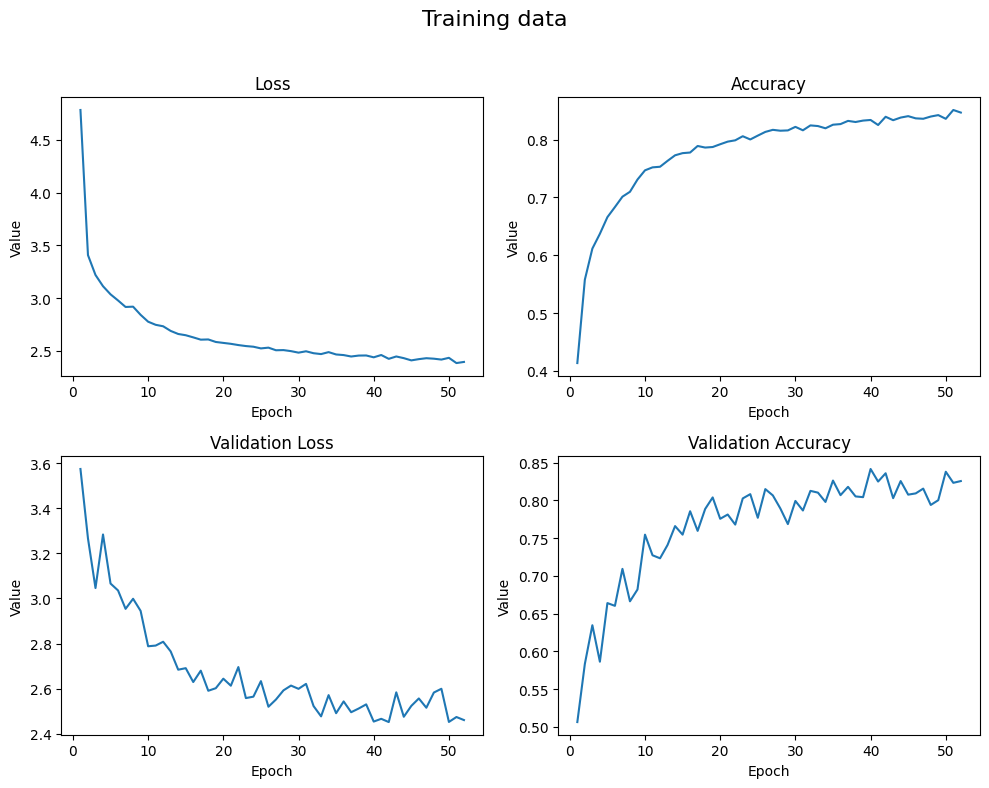

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

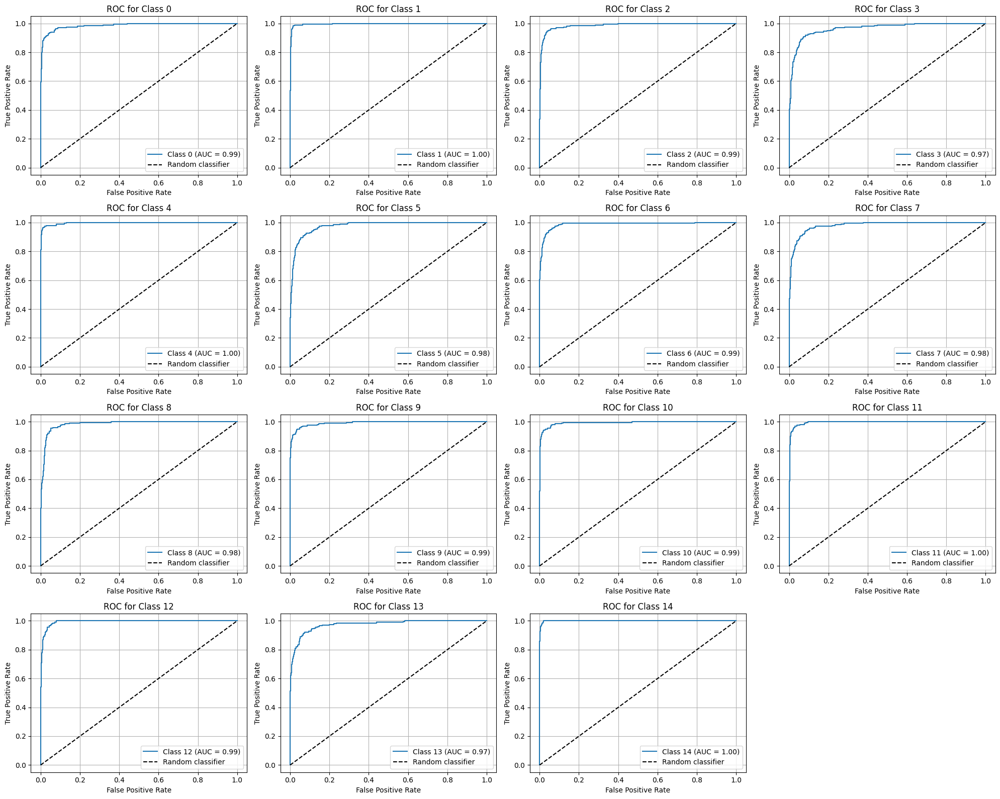

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

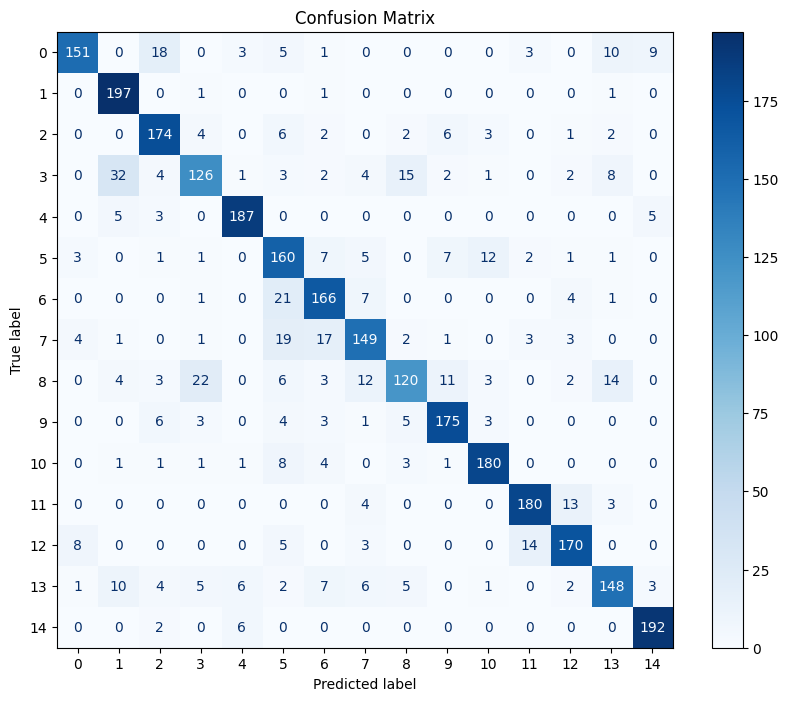

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.825


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.90      0.76      0.82       200
           1       0.79      0.98      0.88       200
           2       0.81      0.87      0.84       200
           3       0.76      0.63      0.69       200
           4       0.92      0.94      0.93       200
           5       0.67      0.80      0.73       200
           6       0.78      0.83      0.80       200
           7       0.78      0.74      0.76       200
           8       0.79      0.60      0.68       200
           9       0.86      0.88      0.87       200
          10       0.89      0.90      0.89       200
          11       0.89      0.90      0.90       200
          12       0.86      0.85      0.85       200
          13       0.79      0.74      0.76       200
          14       0.92      0.96      0.94       200

    accuracy                           0.82      3000
   macro avg       0.83      0.82      0.82      3000
weighted avg       0.83   

## Model l2 = 0.01

In [ ]:
inputs = Input(shape=input_shape)
x = Conv2D(32, (3, 3), activation='relu', kernel_regularizer=l2(0.01))(inputs)
x = MaxPool2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l2(0.01))(x)
x = MaxPool2D((2, 2))(x)
x = Conv2D(128, (3, 3), activation='relu', kernel_regularizer=l2(0.01))(x)
x = MaxPool2D((2, 2))(x)

x = Flatten()(x)
x = Dense(128, activation='relu', kernel_regularizer=l2(0.01))(x)
outputs = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "functional_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_14 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_31 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_31 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_32 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_32 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_33 (Conv2D)                   │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_33 (MaxPooling2D)      │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_14 (Flatten)                 │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_28 (Dense)                     │ (None, 128)                 │      11,075,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_29 (Dense)                     │ (None, 15)                  │           1,935 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,170,895 (42.61 MB)

 Trainable params: 11,170,895 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

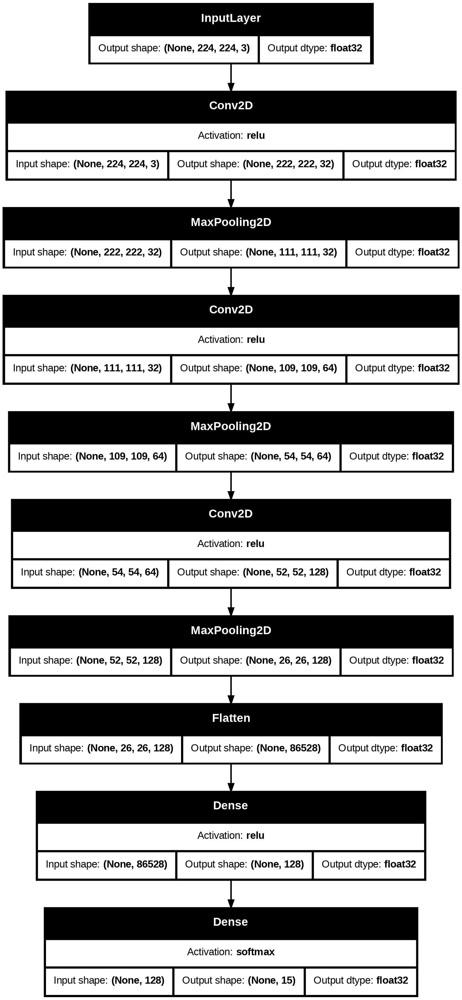

In [ ]:
try:
    plot_model(model, 'model2_l2_001.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model2_l2_001.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - accuracy: 0.3493 - loss: 3.1371 - val_accuracy: 0.7347 - val_loss: 1.4518
Epoch 2/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.7066 - loss: 1.5269 - val_accuracy: 0.7273 - val_loss: 1.4809
Epoch 3/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.7695 - loss: 1.2948 - val_accuracy: 0.8100 - val_loss: 1.1052
Epoch 4/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.8123 - loss: 1.1237 - val_accuracy: 0.8393 - val_loss: 1.0067
Epoch 5/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.8374 - loss: 1.0294 - val_accuracy: 0.8153 - val_loss: 1.1071
Epoch 6/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.8408 - loss: 1.0280 - val_accuracy: 0.8193 - val_loss: 1.1030
Epoch 7/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.8552 - loss: 0.9732 - val_accuracy: 0.8387 - val_loss: 1.0078
Epoch 8/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.8598 - loss: 0.9472 -

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f'model2_l2_001 - loss: {loss}, accuracy: {acc}')

model2_l2_001 - loss: 0.645683228969574, accuracy: 0.9229999780654907


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[2.27583384513855,
 1.459893822669983,
 1.2660468816757202,
 1.1242637634277344,
 1.0626415014266968,
 1.0207669734954834,
 0.9797928929328918,
 0.9658247232437134,
 0.9318130016326904,
 0.9163343906402588,
 0.8853800892829895,
 0.857252299785614,
 0.8938909769058228,
 0.8466413617134094,
 0.8431034684181213,
 0.8456112146377563,
 0.810971736907959,
 0.8424438834190369,
 0.8177875876426697,
 0.7963199019432068,
 0.791962742805481,
 0.7757357954978943,
 0.7980313897132874,
 0.7885057926177979,
 0.7640833854675293,
 0.7543413043022156,
 0.7554495334625244,
 0.7610956430435181,
 0.7513328194618225,
 0.7294232249259949,
 0.7437439560890198,
 0.7383252382278442,
 0.7602105736732483,
 0.7417086958885193,
 0.72916179895401,
 0.7357896566390991,
 0.6995423436164856,
 0.7197818756103516,
 0.7021629810333252,
 0.7119823694229126,
 0.7012166380882263,
 0.6930720806121826,
 0.7019972205162048,
 0.7071378231048584,
 0.6996217966079712,
 0.6868096590042114,
 0.6997668147087097,
 0.684104859828949,
 

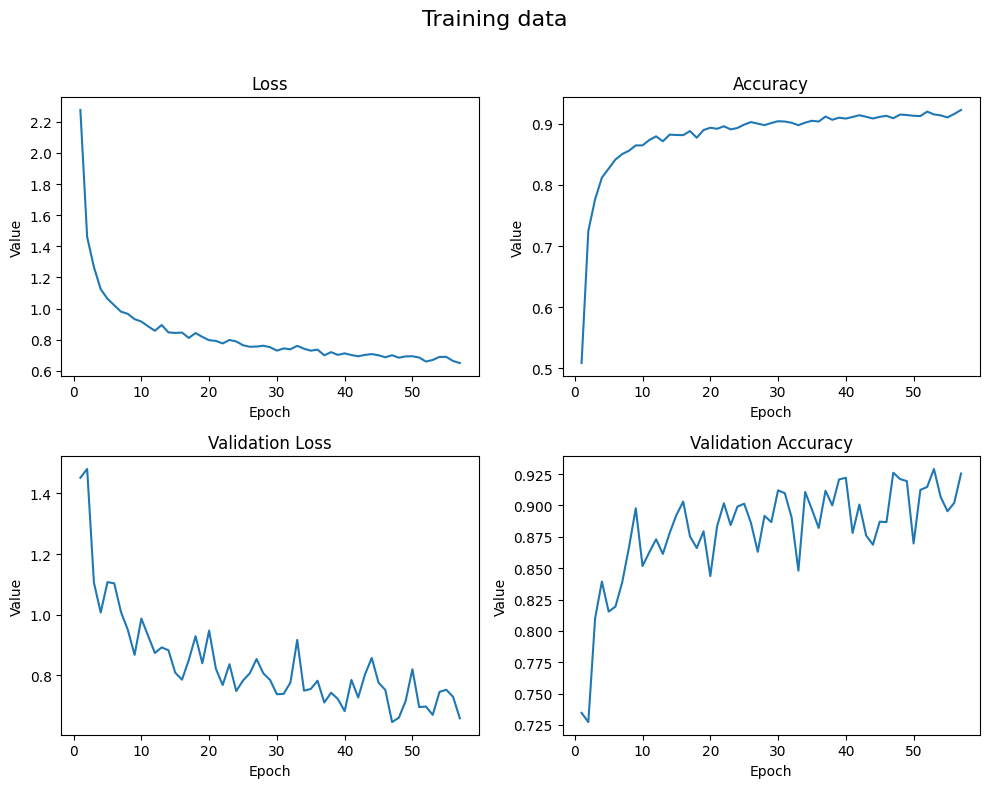

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

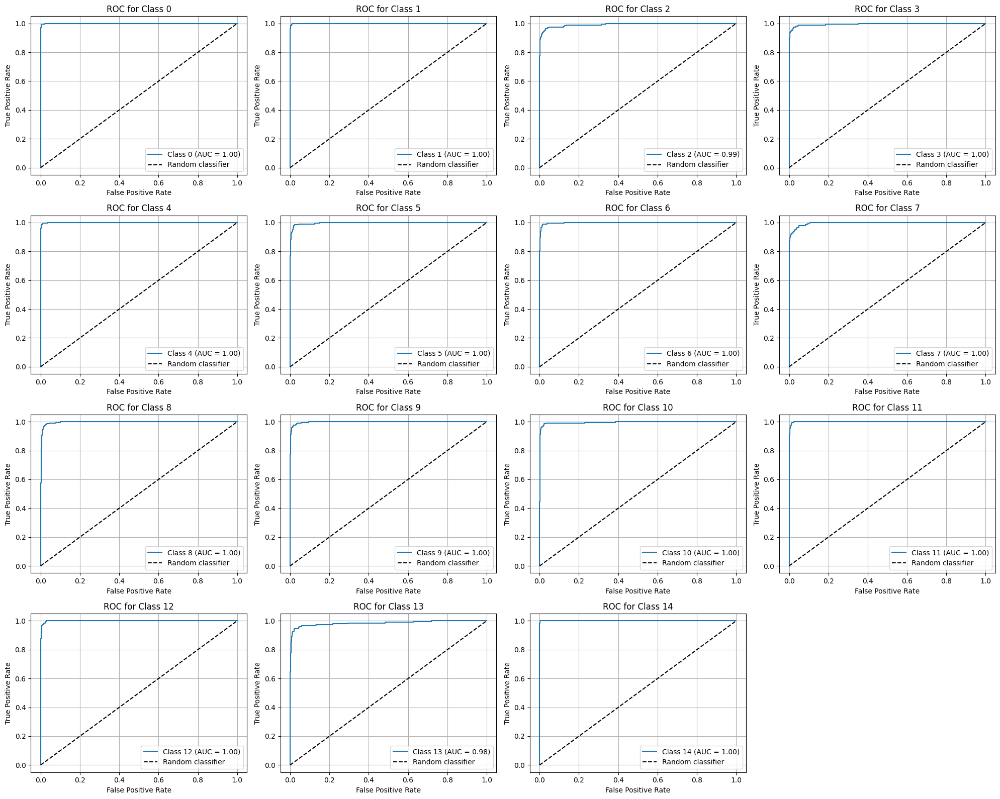

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.923


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      0.95      0.97       200
           1       0.96      0.98      0.97       200
           2       0.93      0.89      0.91       200
           3       0.93      0.92      0.92       200
           4       0.95      0.98      0.97       200
           5       0.95      0.86      0.91       200
           6       0.97      0.88      0.92       200
           7       0.83      0.92      0.87       200
           8       0.94      0.80      0.86       200
           9       0.87      0.96      0.92       200
          10       0.92      0.96      0.94       200
          11       0.85      0.98      0.91       200
          12       0.93      0.92      0.92       200
          13       0.87      0.90      0.89       200
          14       1.00      0.95      0.97       200

    accuracy                           0.92      3000
   macro avg       0.93      0.92      0.92      3000
weighted avg       0.93   

## Model l2 = 0.001

In [ ]:
inputs = Input(shape=input_shape)
x = Conv2D(32, (3, 3), activation='relu', kernel_regularizer=l2(0.001))(inputs)
x = MaxPool2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l2(0.001))(x)
x = MaxPool2D((2, 2))(x)
x = Conv2D(128, (3, 3), activation='relu', kernel_regularizer=l2(0.001))(x)
x = MaxPool2D((2, 2))(x)

x = Flatten()(x)
x = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(x)
outputs = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "functional_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_15 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_34 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_34 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_35 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_35 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_36 (Conv2D)                   │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_36 (MaxPooling2D)      │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_15 (Flatten)                 │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_30 (Dense)                     │ (None, 128)                 │      11,075,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_31 (Dense)                     │ (None, 15)                  │           1,935 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,170,895 (42.61 MB)

 Trainable params: 11,170,895 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

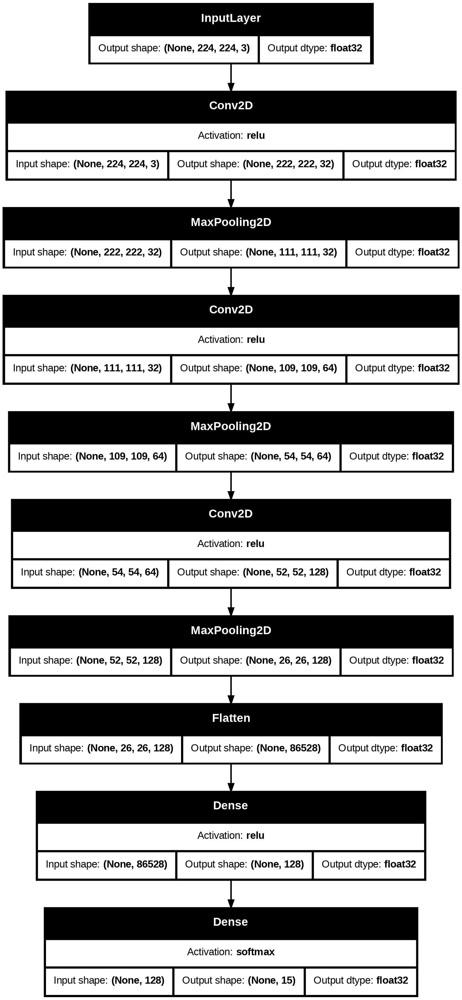

In [ ]:
try:
    plot_model(model, 'model2_l2_0001.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model2_l2_0001.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - accuracy: 0.4518 - loss: 1.9861 - val_accuracy: 0.8230 - val_loss: 0.8648
Epoch 2/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.8660 - loss: 0.7381 - val_accuracy: 0.9083 - val_loss: 0.6276
Epoch 3/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9196 - loss: 0.5775 - val_accuracy: 0.9240 - val_loss: 0.5826
Epoch 4/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9385 - loss: 0.5171 - val_accuracy: 0.8953 - val_loss: 0.6536
Epoch 5/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9473 - loss: 0.4809 - val_accuracy: 0.9377 - val_loss: 0.5584
Epoch 6/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9613 - loss: 0.4416 - val_accuracy: 0.9127 - val_loss: 0.5985
Epoch 7/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9609 - loss: 0.4296 - val_accuracy: 0.9263 - val_loss: 0.5556
Epoch 8/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9638 - loss: 0.4141 -

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f'model2_l2_0001 - loss: {loss}, accuracy: {acc}')

model2_l2_0001 - loss: 0.4102190434932709, accuracy: 0.9553333520889282


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[1.3793164491653442,
 0.700838565826416,
 0.5852668881416321,
 0.532778799533844,
 0.5038937330245972,
 0.4633403420448303,
 0.4414539337158203,
 0.4379149079322815,
 0.41978907585144043,
 0.40348654985427856,
 0.3990206718444824,
 0.398760050535202,
 0.384184867143631,
 0.3704856038093567,
 0.3972727954387665,
 0.3680904507637024,
 0.3335748314857483,
 0.36801761388778687,
 0.3592681586742401,
 0.335792601108551,
 0.35285845398902893,
 0.32637885212898254,
 0.32708120346069336,
 0.32579267024993896,
 0.34764939546585083,
 0.3218454420566559,
 0.3139863908290863]

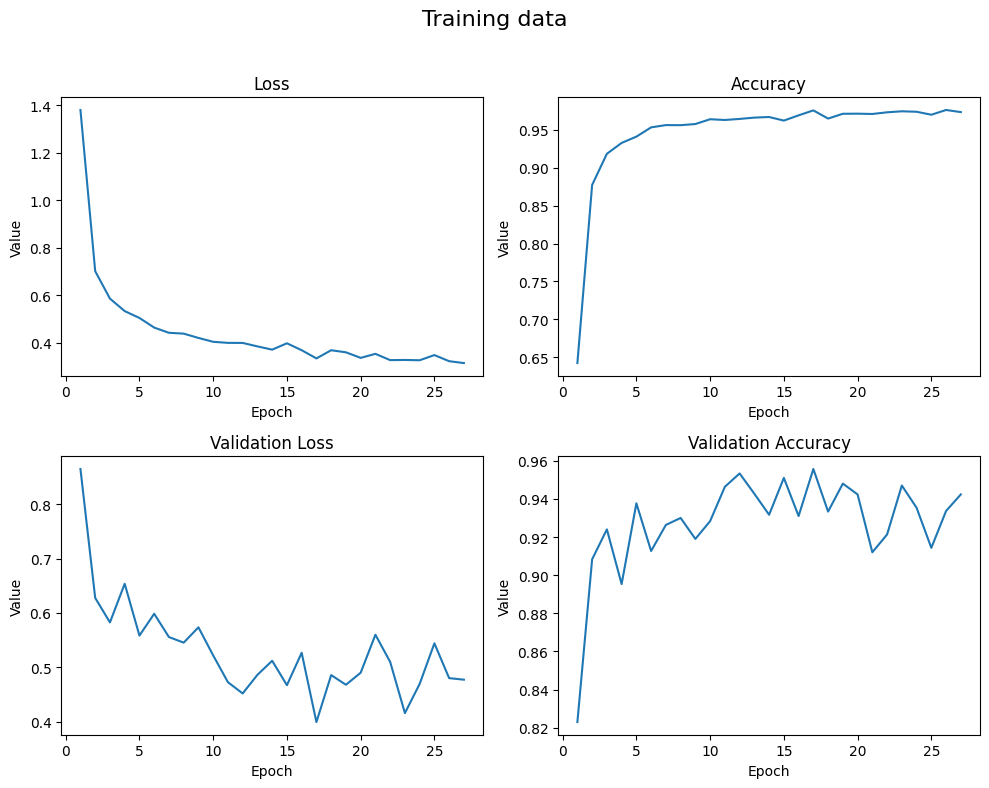

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

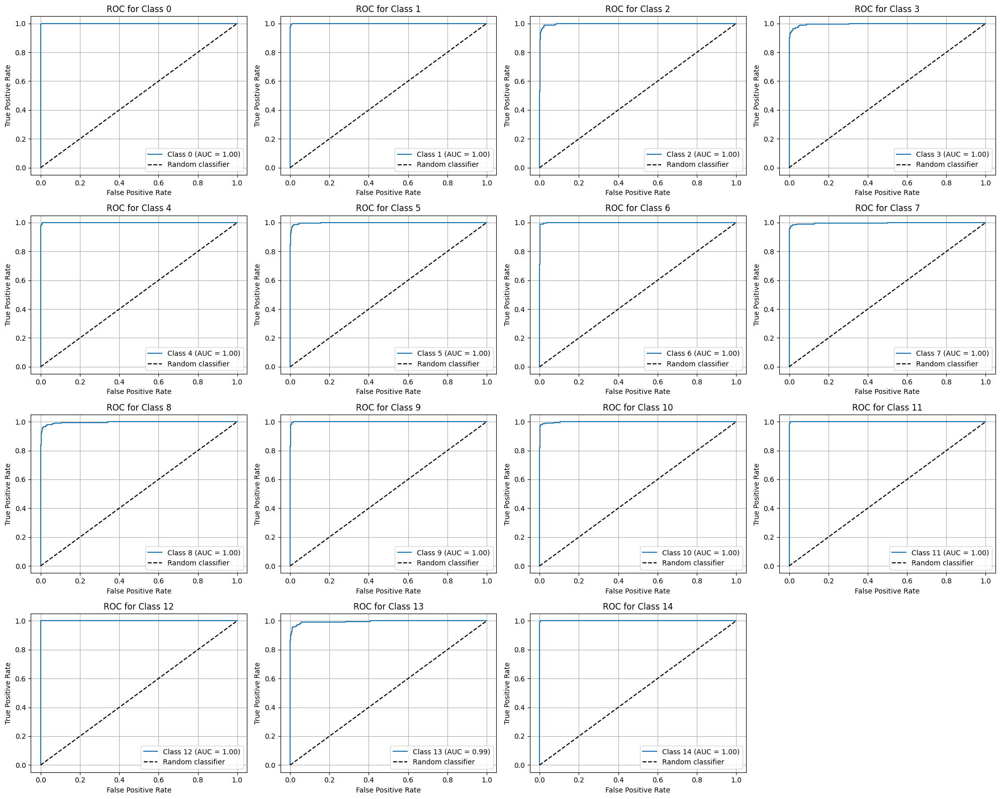

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

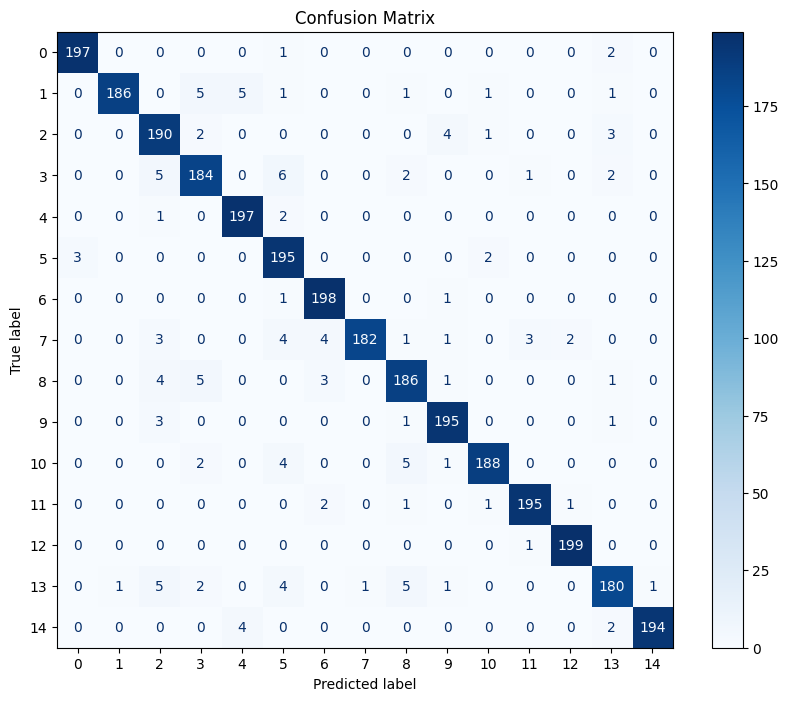

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.9553333333333334


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98       200
           1       0.99      0.93      0.96       200
           2       0.90      0.95      0.92       200
           3       0.92      0.92      0.92       200
           4       0.96      0.98      0.97       200
           5       0.89      0.97      0.93       200
           6       0.96      0.99      0.97       200
           7       0.99      0.91      0.95       200
           8       0.92      0.93      0.93       200
           9       0.96      0.97      0.97       200
          10       0.97      0.94      0.96       200
          11       0.97      0.97      0.97       200
          12       0.99      0.99      0.99       200
          13       0.94      0.90      0.92       200
          14       0.99      0.97      0.98       200

    accuracy                           0.96      3000
   macro avg       0.96      0.96      0.96      3000
weighted avg       0.96   

## Model dropout = 0.2

In [ ]:
inputs = Input(shape=input_shape)
x = Conv2D(32, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(inputs)
x = MaxPool2D((2, 2))(x)
x = Dropout(0.2)(x)
x = Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(x)
x = MaxPool2D((2, 2))(x)
x = Dropout(0.2)(x)
x = Conv2D(128, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(x)
x = MaxPool2D((2, 2))(x)
x = Dropout(0.2)(x)

x = Flatten()(x)
x = Dense(128, activation='relu', kernel_regularizer=l1(0.01))(x)
x = Dropout(0.2)(x)
outputs = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "functional_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_16 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_37 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_37 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_12 (Dropout)                 │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_38 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_38 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_13 (Dropout)                 │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_39 (Conv2D)                   │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_39 (MaxPooling2D)      │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_14 (Dropout)                 │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_16 (Flatten)                 │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_32 (Dense)                     │ (None, 128)                 │      11,075,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_15 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_33 (Dense)                     │ (None, 15)                  │           1,935 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,170,895 (42.61 MB)

 Trainable params: 11,170,895 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

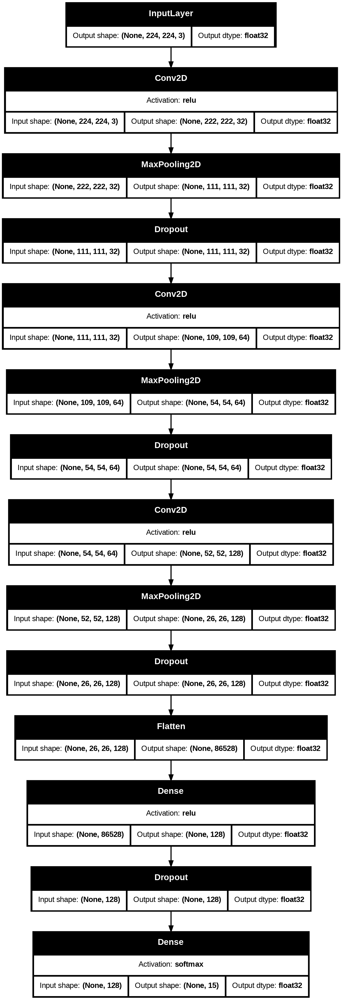

In [ ]:
try:
    plot_model(model, 'model2_dropout_02.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model2_dropout_02.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - accuracy: 0.0670 - loss: 49.6411 - val_accuracy: 0.0667 - val_loss: 16.7559
Epoch 2/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.0670 - loss: 16.5952 - val_accuracy: 0.0667 - val_loss: 16.6224
Epoch 3/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.0655 - loss: 16.5853 - val_accuracy: 0.0667 - val_loss: 16.3346
Epoch 4/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.0659 - loss: 16.5869 - val_accuracy: 0.0667 - val_loss: 16.4550
Epoch 5/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.0576 - loss: 16.5859 - val_accuracy: 0.0667 - val_loss: 16.5470
Epoch 6/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.0592 - loss: 16.5869 - val_accuracy: 0.0667 - val_loss: 16.9350
Epoch 7/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.0650 - loss: 16.5924 - val_accuracy: 0.0667 - val_loss: 16.7481
Epoch 8/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.0674 - 

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f'model2_dropout_02 - loss: {loss}, accuracy: {acc}')

model2_dropout_02 - loss: 16.33464813232422, accuracy: 0.06666667014360428


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[24.09915542602539,
 16.59573745727539,
 16.589439392089844,
 16.5883731842041,
 16.58841323852539,
 16.587345123291016,
 16.588520050048828,
 16.58718490600586,
 16.587615966796875,
 16.587141036987305,
 16.586225509643555,
 16.586759567260742,
 16.587270736694336]

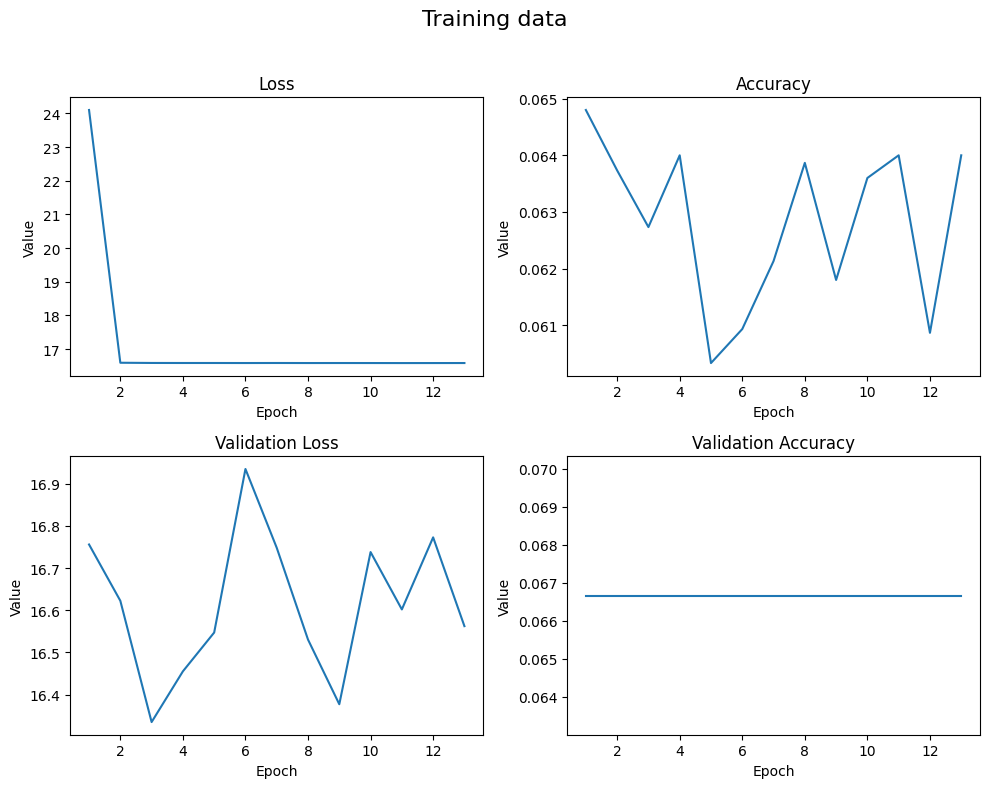

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

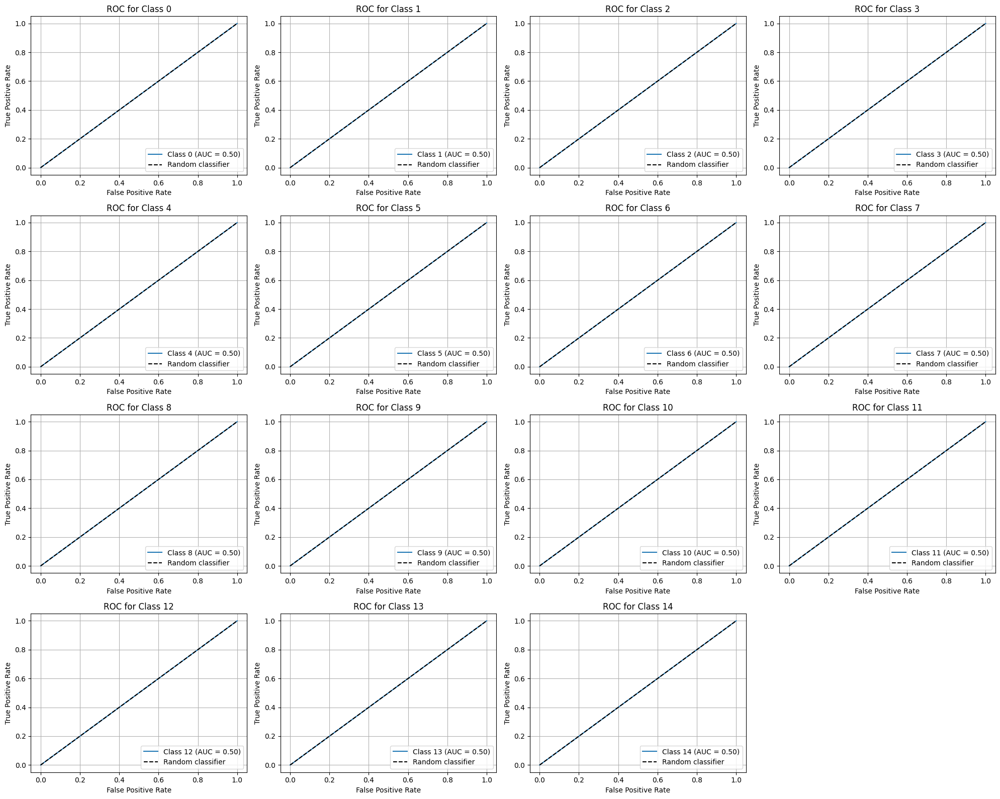

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

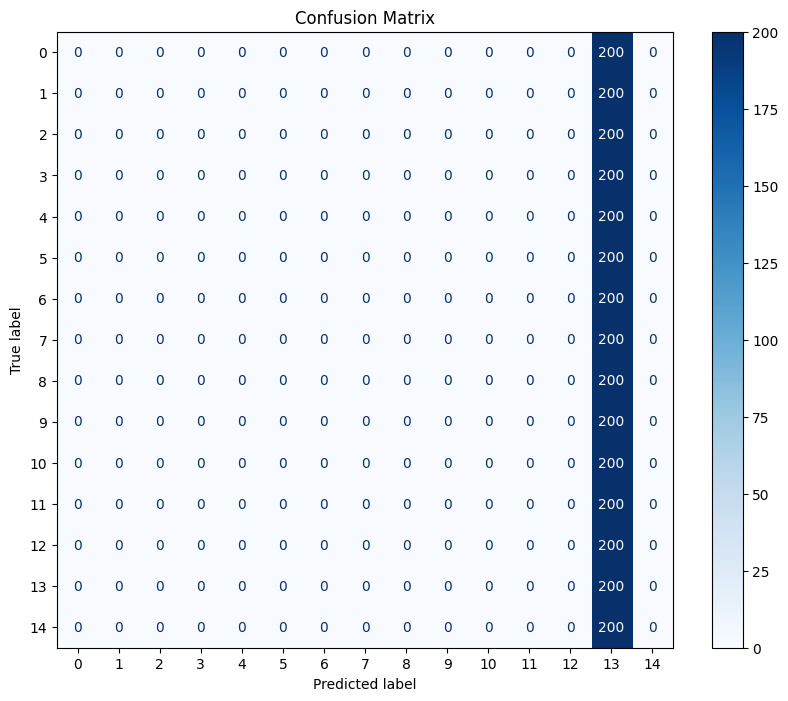

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.06666666666666667


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       200
           1       0.00      0.00      0.00       200
           2       0.00      0.00      0.00       200
           3       0.00      0.00      0.00       200
           4       0.00      0.00      0.00       200
           5       0.00      0.00      0.00       200
           6       0.00      0.00      0.00       200
           7       0.00      0.00      0.00       200
           8       0.00      0.00      0.00       200
           9       0.00      0.00      0.00       200
          10       0.00      0.00      0.00       200
          11       0.00      0.00      0.00       200
          12       0.00      0.00      0.00       200
          13       0.07      1.00      0.12       200
          14       0.00      0.00      0.00       200

    accuracy                           0.07      3000
   macro avg       0.00      0.07      0.01      3000
weighted avg       0.00   

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


## Model dropout = 0.3

In [ ]:
inputs = Input(shape=input_shape)
x = Conv2D(32, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(inputs)
x = MaxPool2D((2, 2))(x)
x = Dropout(0.3)(x)
x = Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(x)
x = MaxPool2D((2, 2))(x)
x = Dropout(0.3)(x)
x = Conv2D(128, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(x)
x = MaxPool2D((2, 2))(x)
x = Dropout(0.3)(x)

x = Flatten()(x)
x = Dense(128, activation='relu', kernel_regularizer=l1(0.01))(x)
x = Dropout(0.3)(x)
outputs = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "functional_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_17 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_40 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_40 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_16 (Dropout)                 │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_41 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_41 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_17 (Dropout)                 │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_42 (Conv2D)                   │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_42 (MaxPooling2D)      │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_18 (Dropout)                 │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_17 (Flatten)                 │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_34 (Dense)                     │ (None, 128)                 │      11,075,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_19 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_35 (Dense)                     │ (None, 15)                  │           1,935 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,170,895 (42.61 MB)

 Trainable params: 11,170,895 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

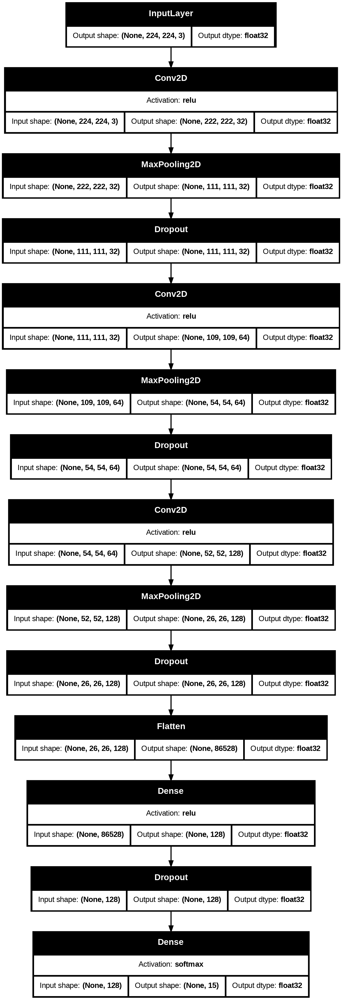

In [ ]:
try:
    plot_model(model, 'model2_dropout_03.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model2_dropout_03.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - accuracy: 0.0642 - loss: 50.9970 - val_accuracy: 0.0667 - val_loss: 16.6749
Epoch 2/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.0647 - loss: 16.5380 - val_accuracy: 0.0667 - val_loss: 16.5413
Epoch 3/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.0651 - loss: 16.5317 - val_accuracy: 0.0667 - val_loss: 16.3423
Epoch 4/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.0639 - loss: 16.5358 - val_accuracy: 0.0667 - val_loss: 16.4169
Epoch 5/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.0614 - loss: 16.5354 - val_accuracy: 0.0667 - val_loss: 16.5325
Epoch 6/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.0677 - loss: 16.5370 - val_accuracy: 0.0667 - val_loss: 16.7916
Epoch 7/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.0584 - loss: 16.5411 - val_accuracy: 0.0667 - val_loss: 16.6602
Epoch 8/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.0654 - 

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f'model2_dropout_03 - loss: {loss}, accuracy: {acc}')

model2_dropout_03 - loss: 16.342323303222656, accuracy: 0.06666667014360428


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[24.513742446899414,
 16.537370681762695,
 16.536300659179688,
 16.537370681762695,
 16.537599563598633,
 16.536958694458008,
 16.537830352783203,
 16.53633689880371,
 16.536706924438477,
 16.536563873291016,
 16.535858154296875,
 16.536258697509766,
 16.53665542602539]

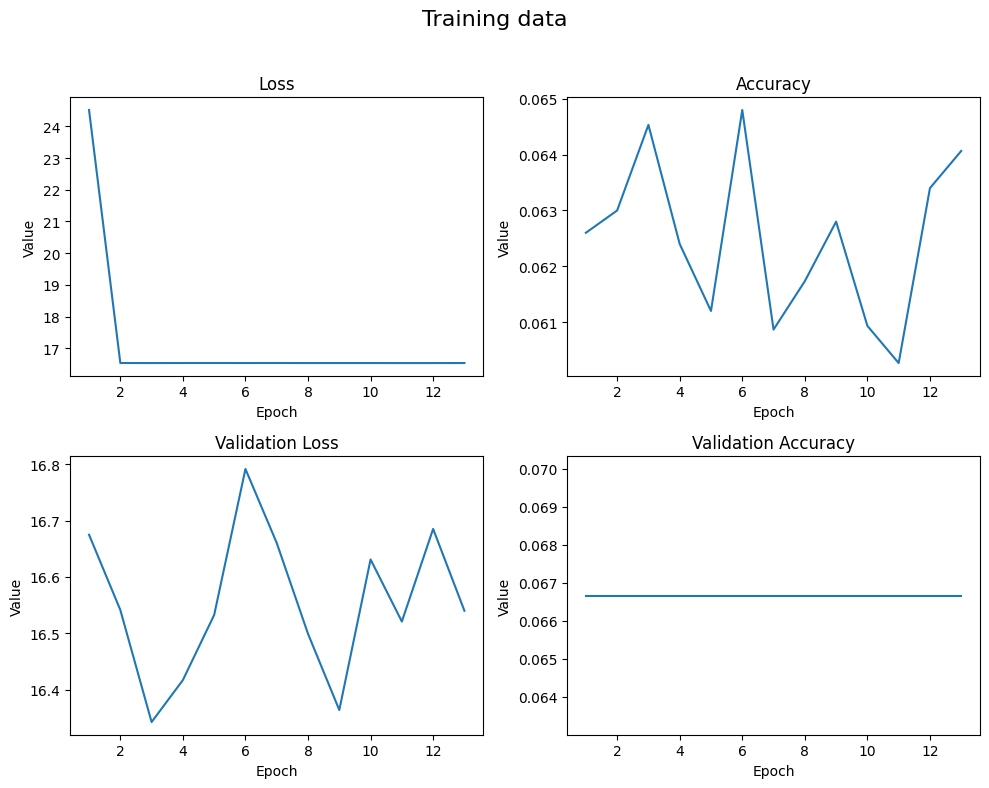

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

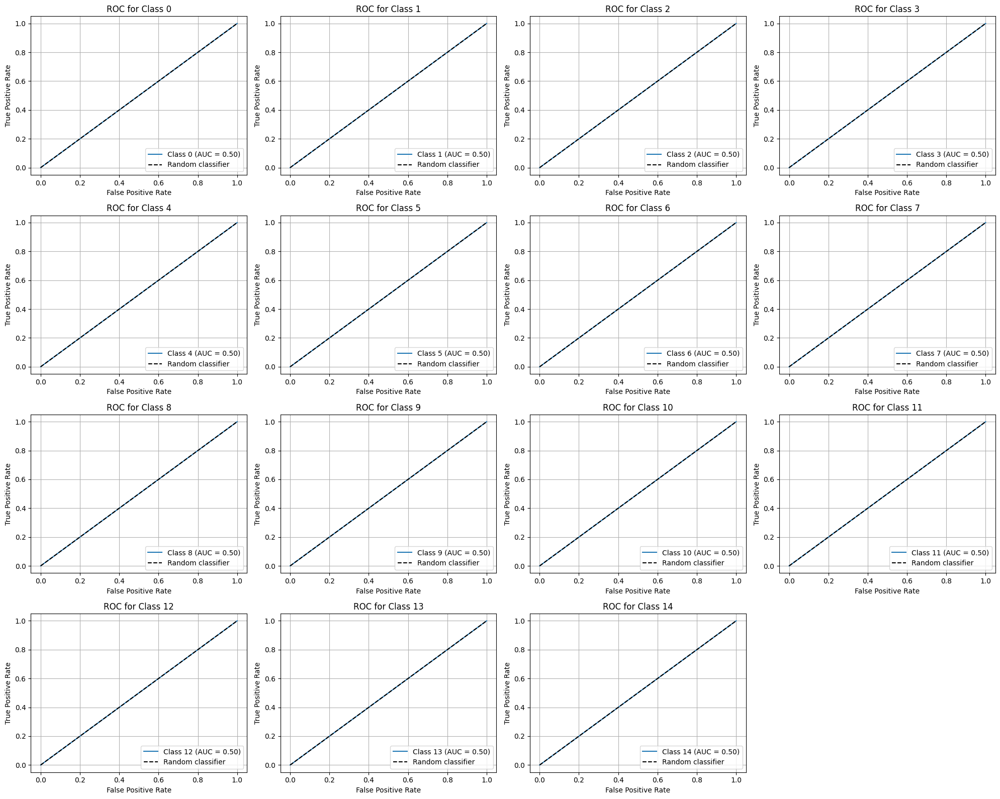

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

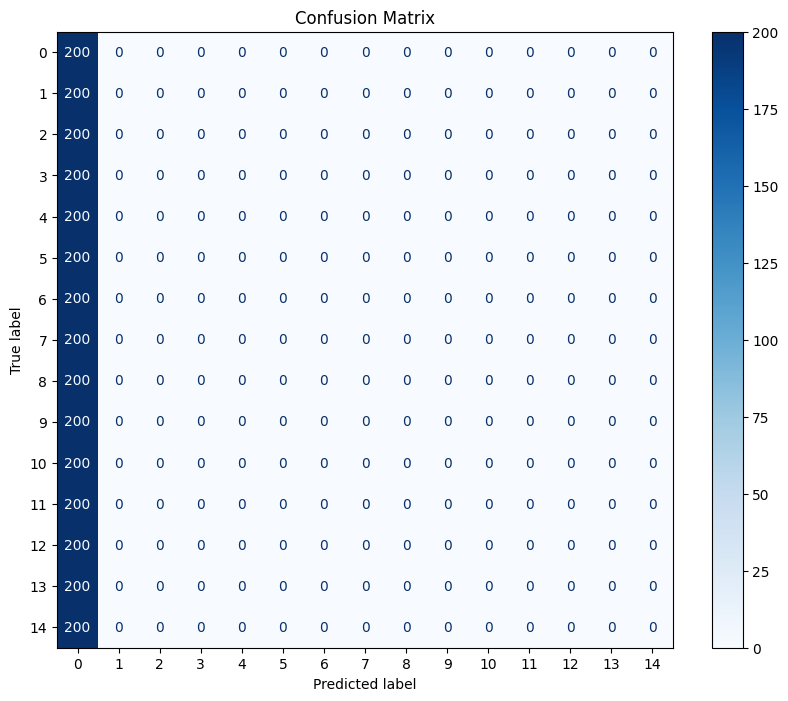

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.06666666666666667


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.07      1.00      0.12       200
           1       0.00      0.00      0.00       200
           2       0.00      0.00      0.00       200
           3       0.00      0.00      0.00       200
           4       0.00      0.00      0.00       200
           5       0.00      0.00      0.00       200
           6       0.00      0.00      0.00       200
           7       0.00      0.00      0.00       200
           8       0.00      0.00      0.00       200
           9       0.00      0.00      0.00       200
          10       0.00      0.00      0.00       200
          11       0.00      0.00      0.00       200
          12       0.00      0.00      0.00       200
          13       0.00      0.00      0.00       200
          14       0.00      0.00      0.00       200

    accuracy                           0.07      3000
   macro avg       0.00      0.07      0.01      3000
weighted avg       0.00   

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


## Model dropout = 0.4

In [ ]:
inputs = Input(shape=input_shape)
x = Conv2D(32, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(inputs)
x = MaxPool2D((2, 2))(x)
x = Dropout(0.4)(x)
x = Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(x)
x = MaxPool2D((2, 2))(x)
x = Dropout(0.4)(x)
x = Conv2D(128, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(x)
x = MaxPool2D((2, 2))(x)
x = Dropout(0.4)(x)

x = Flatten()(x)
x = Dense(128, activation='relu', kernel_regularizer=l1(0.01))(x)
x = Dropout(0.4)(x)
outputs = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "functional_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_18 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_43 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_43 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_20 (Dropout)                 │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_44 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_44 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_21 (Dropout)                 │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_45 (Conv2D)                   │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_45 (MaxPooling2D)      │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_22 (Dropout)                 │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_18 (Flatten)                 │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_36 (Dense)                     │ (None, 128)                 │      11,075,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_23 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_37 (Dense)                     │ (None, 15)                  │           1,935 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,170,895 (42.61 MB)

 Trainable params: 11,170,895 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

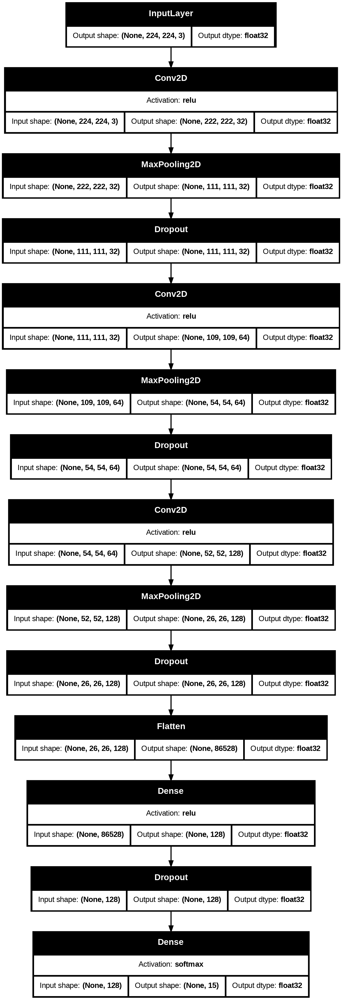

In [ ]:
try:
    plot_model(model, 'model2_dropout_04.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model2_dropout_04.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - accuracy: 0.0662 - loss: 50.6511 - val_accuracy: 0.0667 - val_loss: 16.5736
Epoch 2/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.0632 - loss: 16.4870 - val_accuracy: 0.0667 - val_loss: 16.4941
Epoch 3/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.0655 - loss: 16.4775 - val_accuracy: 0.0667 - val_loss: 16.3427
Epoch 4/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.0634 - loss: 16.4818 - val_accuracy: 0.0667 - val_loss: 16.3794
Epoch 5/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.0639 - loss: 16.4821 - val_accuracy: 0.0667 - val_loss: 16.4867
Epoch 6/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.0605 - loss: 16.4829 - val_accuracy: 0.0667 - val_loss: 16.7075
Epoch 7/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.0702 - loss: 16.4874 - val_accuracy: 0.0667 - val_loss: 16.5796
Epoch 8/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.0646 - 

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f'model2_dropout_04 - loss: {loss}, accuracy: {acc}')

model2_dropout_04 - loss: 16.34274673461914, accuracy: 0.06666667014360428


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[24.32988929748535,
 16.485755920410156,
 16.482057571411133,
 16.48322296142578,
 16.483930587768555,
 16.482995986938477,
 16.48436164855957,
 16.48320960998535,
 16.483545303344727,
 16.483692169189453,
 16.482730865478516,
 16.48319435119629,
 16.4832706451416]

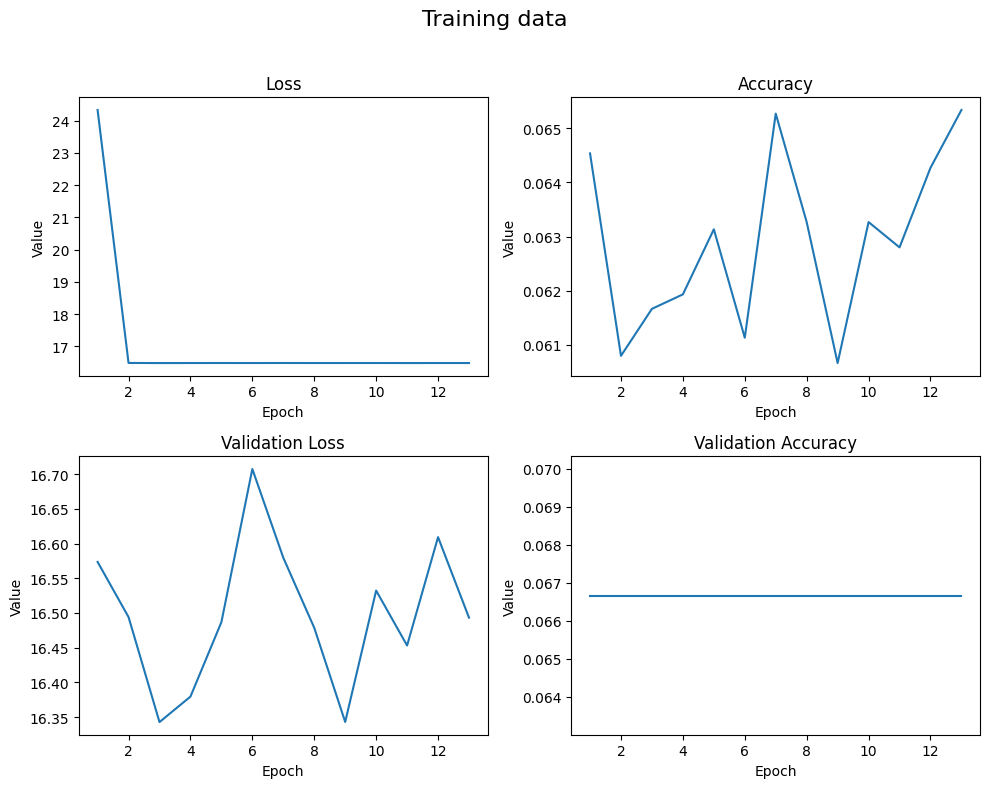

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

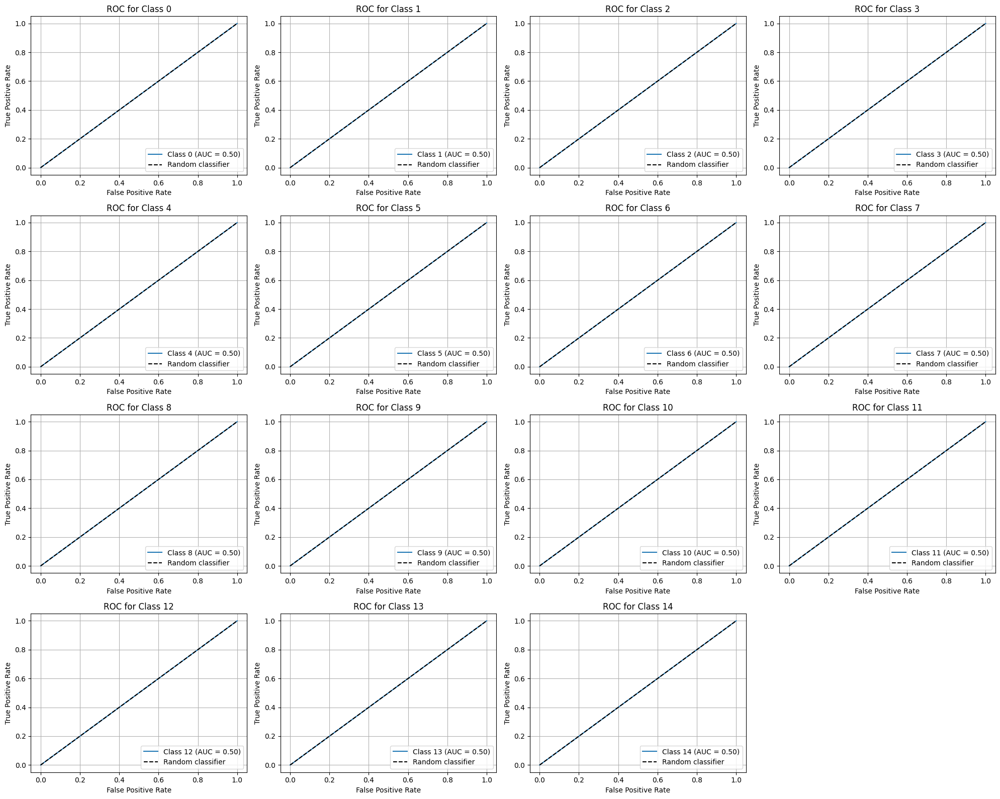

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

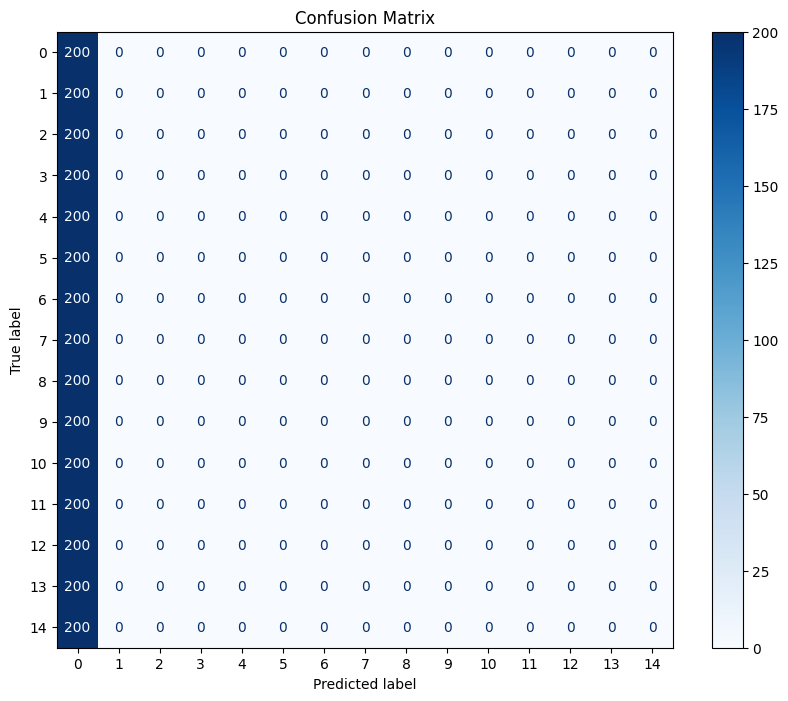

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.06666666666666667


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.07      1.00      0.12       200
           1       0.00      0.00      0.00       200
           2       0.00      0.00      0.00       200
           3       0.00      0.00      0.00       200
           4       0.00      0.00      0.00       200
           5       0.00      0.00      0.00       200
           6       0.00      0.00      0.00       200
           7       0.00      0.00      0.00       200
           8       0.00      0.00      0.00       200
           9       0.00      0.00      0.00       200
          10       0.00      0.00      0.00       200
          11       0.00      0.00      0.00       200
          12       0.00      0.00      0.00       200
          13       0.00      0.00      0.00       200
          14       0.00      0.00      0.00       200

    accuracy                           0.07      3000
   macro avg       0.00      0.07      0.01      3000
weighted avg       0.00   

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


## Model batch normalization

In [ ]:
inputs = Input(shape=input_shape)
x = Conv2D(32, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(inputs)
x = BatchNormalization()(x)
x = MaxPool2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(x)
x = BatchNormalization()(x)
x = MaxPool2D((2, 2))(x)
x = Conv2D(128, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(x)
x = BatchNormalization()(x)
x = MaxPool2D((2, 2))(x)

x = Flatten()(x)
x = Dense(128, activation='relu', kernel_regularizer=l1(0.01))(x)
x = BatchNormalization()(x)
outputs = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "functional_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_19 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_46 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 222, 222, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_46 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_47 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 109, 109, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_47 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_48 (Conv2D)                   │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_8                │ (None, 52, 52, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_48 (MaxPooling2D)      │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_19 (Flatten)                 │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_38 (Dense)                     │ (None, 128)                 │      11,075,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_9                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_39 (Dense)                     │ (None, 15)                  │           1,935 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,172,303 (42.62 MB)

 Trainable params: 11,171,599 (42.62 MB)

 Non-trainable params: 704 (2.75 KB)

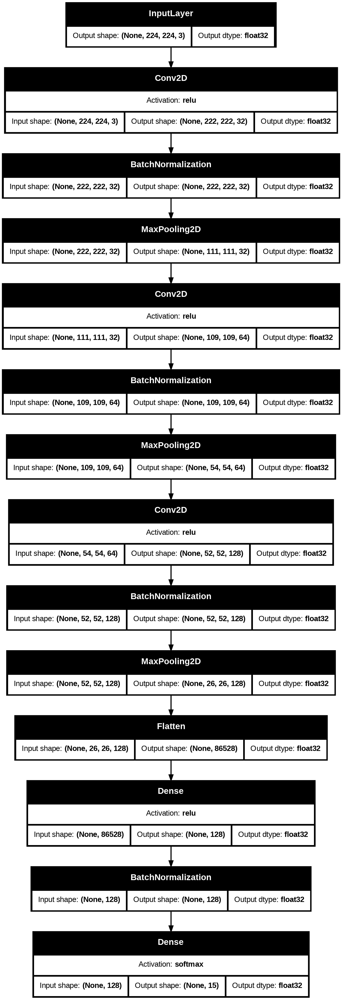

In [ ]:
try:
    plot_model(model, 'model2_batchnorm.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model2_batchnorm.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - accuracy: 0.4379 - loss: 77.3277 - val_accuracy: 0.1453 - val_loss: 32.7314
Epoch 2/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - accuracy: 0.5432 - loss: 27.8342 - val_accuracy: 0.5413 - val_loss: 21.9905
Epoch 3/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.6256 - loss: 21.0010 - val_accuracy: 0.5350 - val_loss: 20.4720
Epoch 4/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - accuracy: 0.6729 - loss: 20.3970 - val_accuracy: 0.6153 - val_loss: 19.6158
Epoch 5/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.6893 - loss: 20.0010 - val_accuracy: 0.3410 - val_loss: 22.1597
Epoch 6/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - accuracy: 0.7141 - loss: 20.4694 - val_accuracy: 0.6287 - val_loss: 21.4159
Epoch 7/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.7224 - loss: 20.8476 - val_accuracy: 0.6000 - val_loss: 21.7956
Epoch 8/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - accuracy: 0.7298 - 

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f'model2_batchnorm - loss: {loss}, accuracy: {acc}')

model2_batchnorm - loss: 14.659403800964355, accuracy: 0.831333339214325


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[44.71905517578125,
 25.42885971069336,
 20.5919189453125,
 20.278162002563477,
 20.124984741210938,
 20.578060150146484,
 20.639007568359375,
 20.100969314575195,
 19.76898193359375,
 19.372896194458008,
 18.583951950073242,
 18.086994171142578,
 17.57505226135254,
 17.370193481445312,
 17.288999557495117,
 16.926485061645508,
 16.896286010742188,
 16.515268325805664,
 16.3868408203125,
 16.37053108215332,
 16.302566528320312,
 16.020645141601562,
 15.985101699829102,
 15.92370319366455,
 15.78189468383789,
 15.731221199035645,
 15.576282501220703,
 15.530275344848633,
 15.435887336730957,
 15.494297981262207,
 15.387679100036621,
 15.309577941894531,
 15.374587059020996,
 15.311558723449707,
 15.116002082824707,
 15.135486602783203,
 15.188410758972168,
 15.080146789550781,
 15.058107376098633,
 15.01323413848877,
 15.010666847229004,
 14.989476203918457,
 14.941593170166016,
 14.930222511291504,
 14.891002655029297,
 14.899659156799316,
 14.83414363861084,
 14.852288246154785,
 14.8

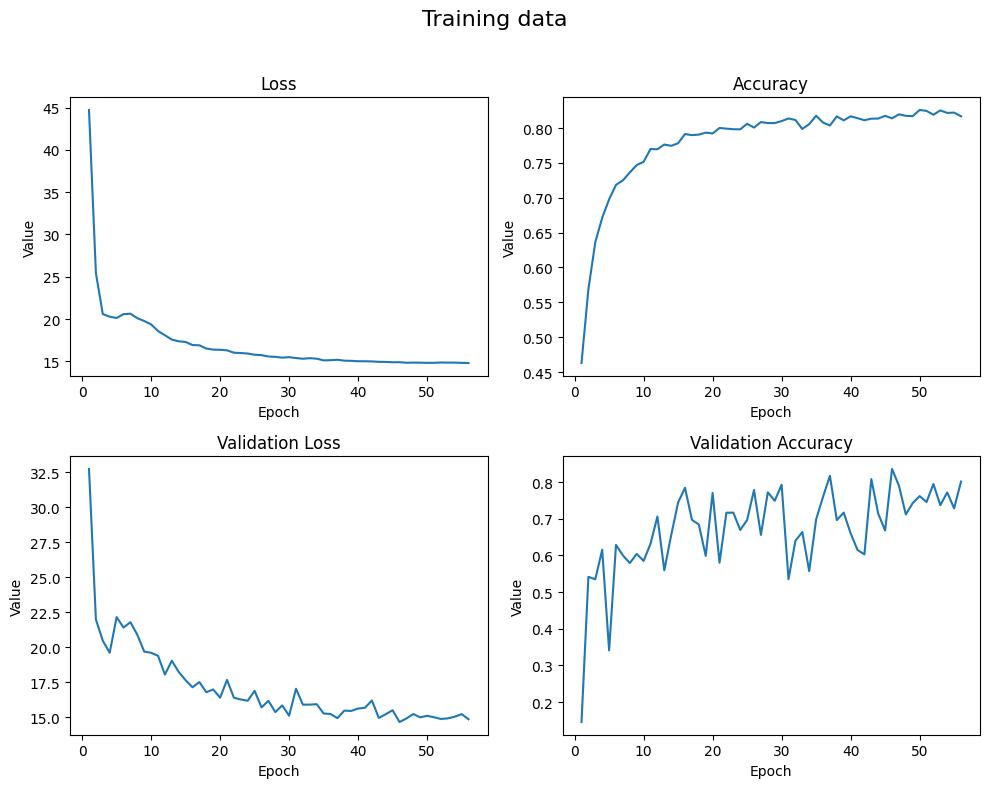

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

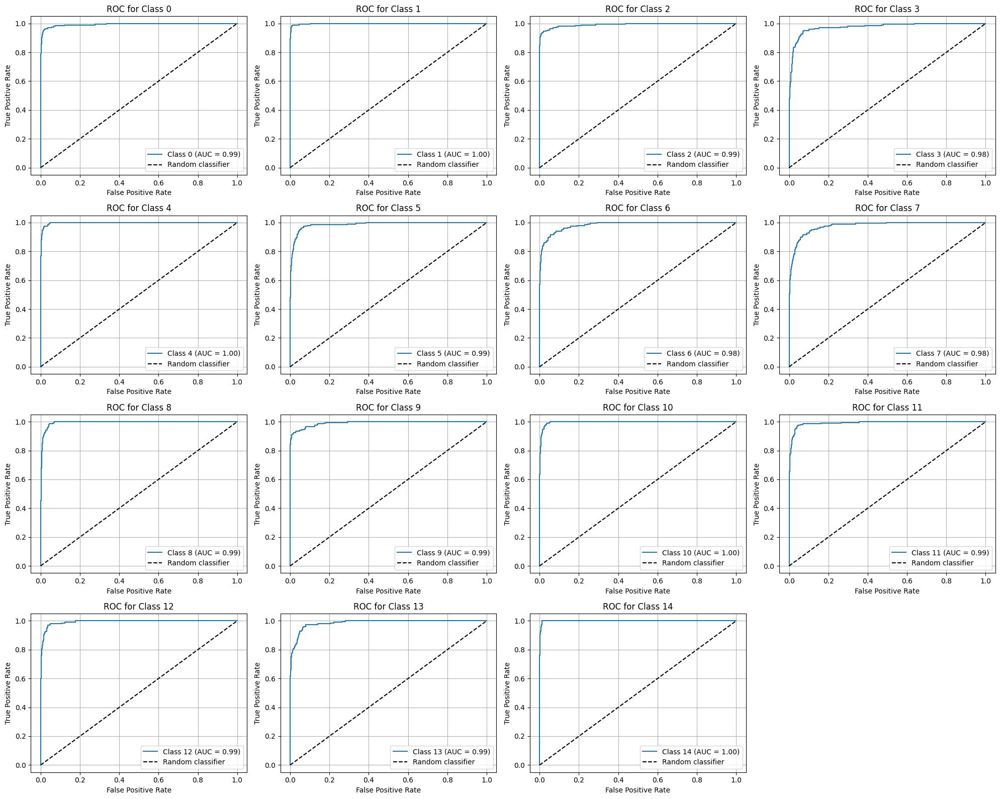

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

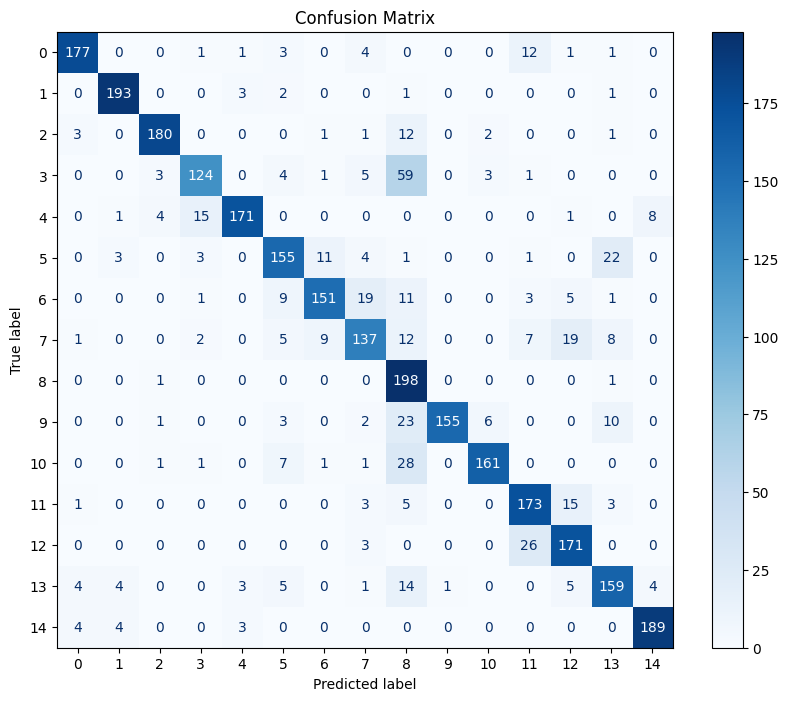

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.8313333333333334


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.93      0.89      0.91       200
           1       0.94      0.96      0.95       200
           2       0.95      0.90      0.92       200
           3       0.84      0.62      0.71       200
           4       0.94      0.85      0.90       200
           5       0.80      0.78      0.79       200
           6       0.87      0.76      0.81       200
           7       0.76      0.69      0.72       200
           8       0.54      0.99      0.70       200
           9       0.99      0.78      0.87       200
          10       0.94      0.81      0.87       200
          11       0.78      0.86      0.82       200
          12       0.79      0.85      0.82       200
          13       0.77      0.80      0.78       200
          14       0.94      0.94      0.94       200

    accuracy                           0.83      3000
   macro avg       0.85      0.83      0.83      3000
weighted avg       0.85   

## Model elasticnet (l1 = 0.01; l2 = 0.01)

In [ ]:
inputs = Input(shape=X_train.shape[1:])
x = Conv2D(32, (3, 3), activation='relu', kernel_regularizer=l1_l2(l1=0.01, l2=0.01))(inputs)
x = MaxPool2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l1_l2(l1=0.01, l2=0.01))(x)
x = MaxPool2D((2, 2))(x)
x = Conv2D(128, (3, 3), activation='relu', kernel_regularizer=l1_l2(l1=0.01, l2=0.01))(x)
x = MaxPool2D((2, 2))(x)

x = Flatten()(x)
x = Dense(128, activation='relu', kernel_regularizer=l1_l2(l1=0.01, l2=0.01))(x)
outputs = Dense(len(np.unique(y_train)), activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "functional_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_20 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_49 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_49 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_50 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_50 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_51 (Conv2D)                   │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_51 (MaxPooling2D)      │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_20 (Flatten)                 │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_40 (Dense)                     │ (None, 128)                 │      11,075,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_41 (Dense)                     │ (None, 15)                  │           1,935 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,170,895 (42.61 MB)

 Trainable params: 11,170,895 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

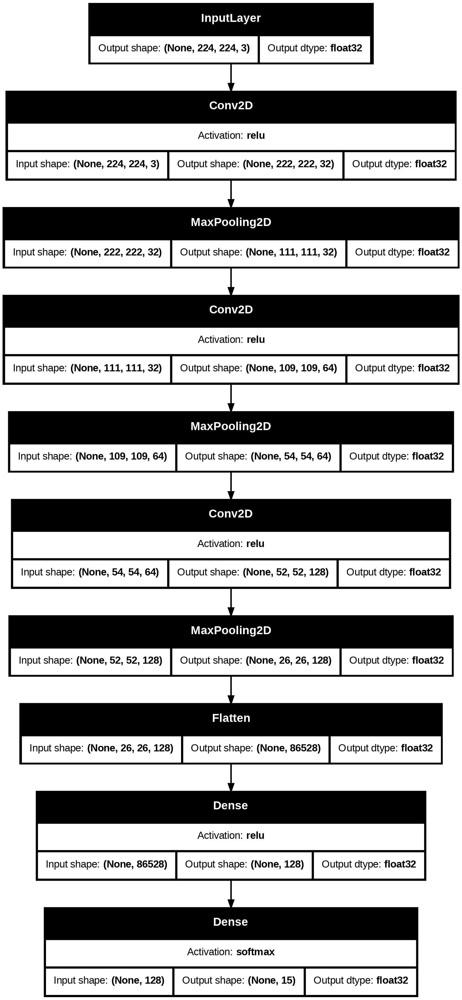

In [ ]:
try:
    plot_model(model, 'model2_l1_l2.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model2_l1_l2.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10,
                                                  restore_best_weights=True, verbose=1)

epochs = 100
batch_size = 32

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - accuracy: 0.0657 - loss: 49.9348 - val_accuracy: 0.0667 - val_loss: 16.9782
Epoch 2/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.0669 - loss: 16.6336 - val_accuracy: 0.0667 - val_loss: 16.4861
Epoch 3/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.0621 - loss: 16.5003 - val_accuracy: 0.0667 - val_loss: 16.3972
Epoch 4/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.0633 - loss: 16.6191 - val_accuracy: 0.0667 - val_loss: 16.7501
Epoch 5/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.0673 - loss: 16.7941 - val_accuracy: 0.0667 - val_loss: 17.0540
Epoch 6/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.0639 - loss: 17.0893 - val_accuracy: 0.0667 - val_loss: 17.5129
Epoch 7/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.0664 - loss: 17.1081 - val_accuracy: 0.0667 - val_loss: 17.2409
Epoch 8/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.0670 - 

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f'model2_l1_l2 - loss: {loss}, accuracy: {acc}')

model2_l1_l2 - loss: 16.397180557250977, accuracy: 0.06666667014360428


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[24.372453689575195,
 16.555171966552734,
 16.55483055114746,
 16.63867950439453,
 16.8979549407959,
 17.09390640258789,
 17.104984283447266,
 17.113431930541992,
 17.116859436035156,
 17.116329193115234,
 17.116880416870117,
 17.116863250732422,
 17.11787986755371]

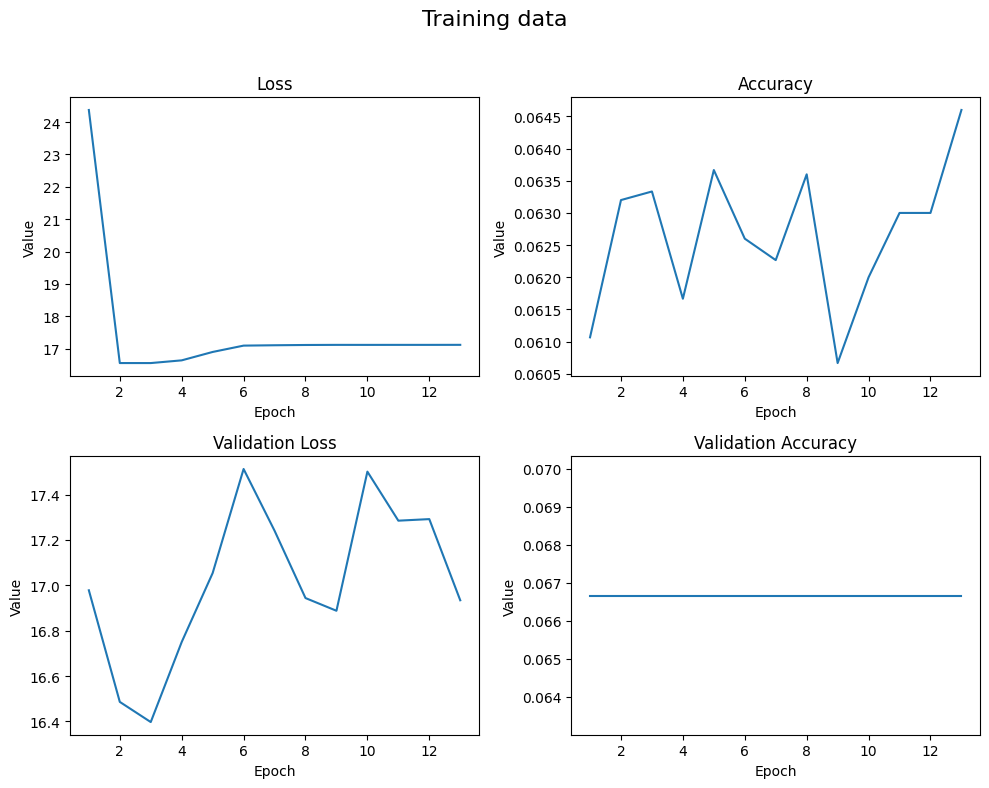

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

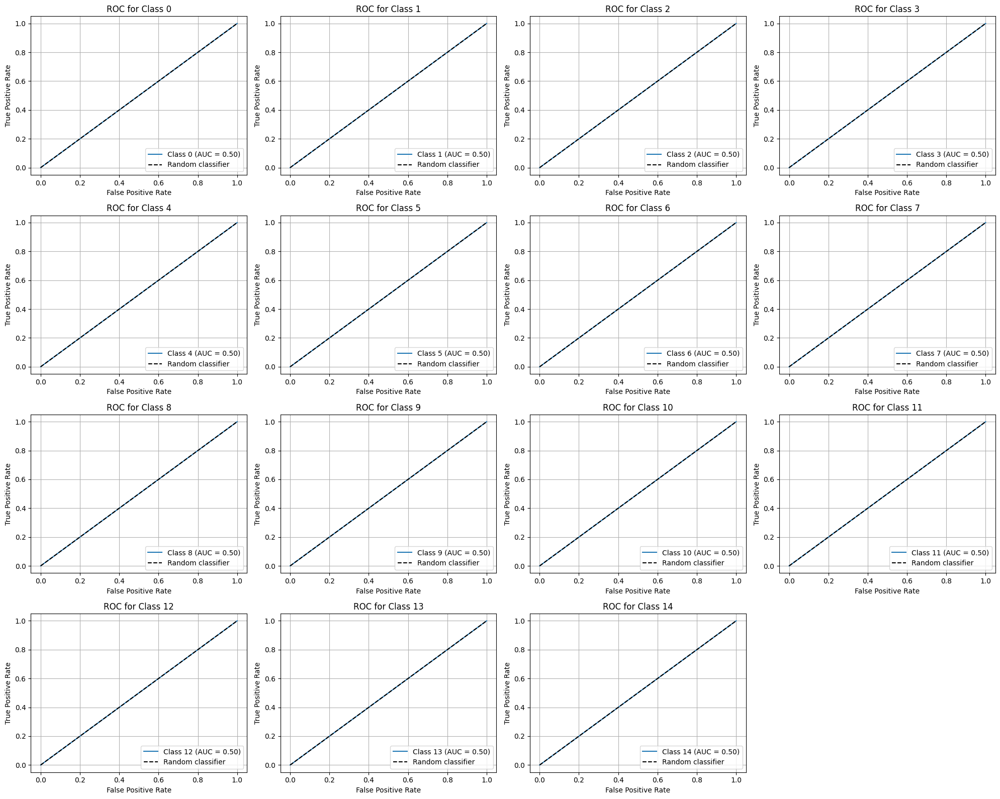

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

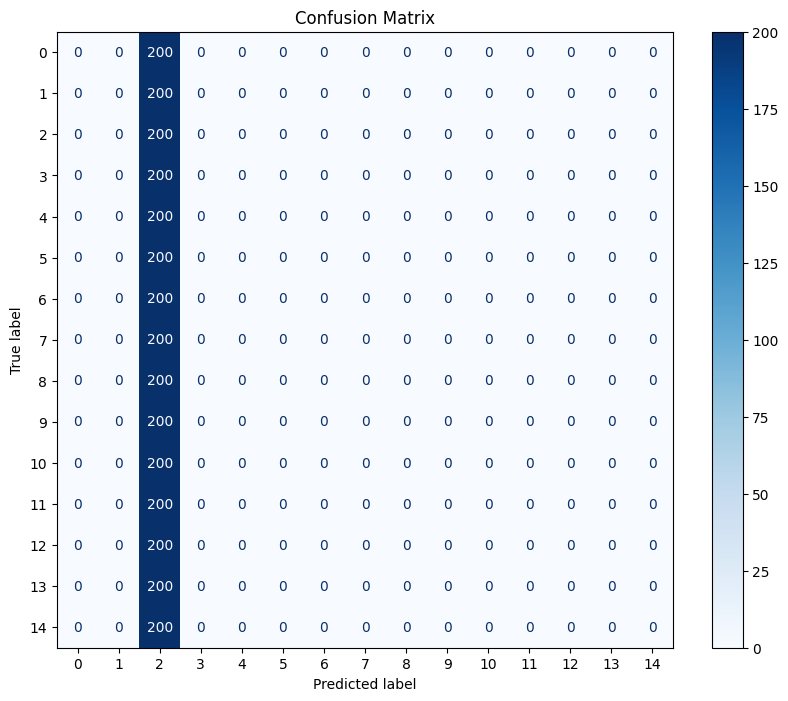

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.06666666666666667


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       200
           1       0.00      0.00      0.00       200
           2       0.07      1.00      0.12       200
           3       0.00      0.00      0.00       200
           4       0.00      0.00      0.00       200
           5       0.00      0.00      0.00       200
           6       0.00      0.00      0.00       200
           7       0.00      0.00      0.00       200
           8       0.00      0.00      0.00       200
           9       0.00      0.00      0.00       200
          10       0.00      0.00      0.00       200
          11       0.00      0.00      0.00       200
          12       0.00      0.00      0.00       200
          13       0.00      0.00      0.00       200
          14       0.00      0.00      0.00       200

    accuracy                           0.07      3000
   macro avg       0.00      0.07      0.01      3000
weighted avg       0.00   

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


## Model batchnormalization; dropout = 0.03;

In [ ]:
inputs = Input(shape=X_train.shape[1:])
x = Conv2D(32, (3, 3), activation='relu')(inputs)
x = BatchNormalization()(x)
x = MaxPool2D((2, 2))(x)
x = Dropout(0.3)(x)
x = Conv2D(64, (3, 3), activation='relu')(x)
x = BatchNormalization()(x)
x = MaxPool2D((2, 2))(x)
x = Dropout(0.3)(x)
x = Conv2D(128, (3, 3), activation='relu')(x)
x = BatchNormalization()(x)
x = MaxPool2D((2, 2))(x)
x = Dropout(0.3)(x)

x = Flatten()(x)
x = Dense(128, activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.3)(x)
outputs = Dense(len(np.unique(y_train)), activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "functional_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_21 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_52 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_10               │ (None, 222, 222, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_52 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_24 (Dropout)                 │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_53 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_11               │ (None, 109, 109, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_53 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_25 (Dropout)                 │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_54 (Conv2D)                   │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_12               │ (None, 52, 52, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_54 (MaxPooling2D)      │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_26 (Dropout)                 │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_21 (Flatten)                 │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_42 (Dense)                     │ (None, 128)                 │      11,075,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_13               │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_27 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_43 (Dense)                     │ (None, 15)                  │           1,935 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,172,303 (42.62 MB)

 Trainable params: 11,171,599 (42.62 MB)

 Non-trainable params: 704 (2.75 KB)

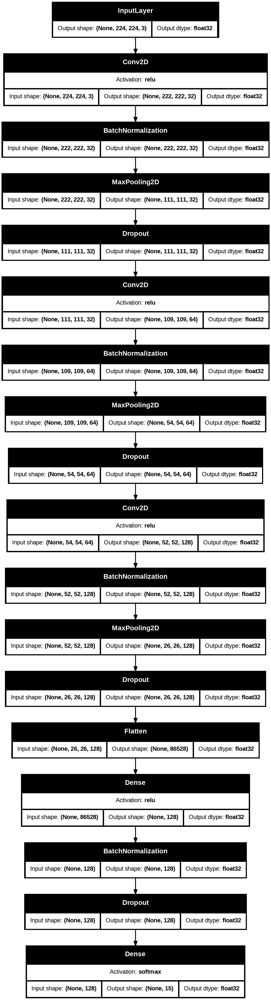

In [ ]:
try:
    plot_model(model, 'model2_dropout_batchnorm.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model2_dropout_batchnorm.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - accuracy: 0.6115 - loss: 1.3004 - val_accuracy: 0.4467 - val_loss: 3.0266
Epoch 2/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.9315 - loss: 0.2395 - val_accuracy: 0.7420 - val_loss: 0.8726
Epoch 3/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.9570 - loss: 0.1501 - val_accuracy: 0.8813 - val_loss: 0.4219
Epoch 4/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.9850 - loss: 0.0570 - val_accuracy: 0.7403 - val_loss: 1.3421
Epoch 5/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.9877 - loss: 0.0449 - val_accuracy: 0.7417 - val_loss: 1.2571
Epoch 6/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.9902 - loss: 0.0344 - val_accuracy: 0.9347 - val_loss: 0.2455
Epoch 7/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.9901 - loss: 0.0333 - val_accuracy: 0.8793 - val_loss: 0.4534
Epoch 8/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.9895 - loss: 0.0322 -

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f'model2_dropout_batchnorm - loss: {loss}, accuracy: {acc}')

model2_dropout_batchnorm - loss: 0.07559798657894135, accuracy: 0.9796666502952576


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[0.7937793135643005,
 0.26385241746902466,
 0.12701500952243805,
 0.06082693859934807,
 0.044282153248786926,
 0.036035824567079544,
 0.04497382417321205,
 0.034291185438632965,
 0.033890947699546814,
 0.02990029938519001,
 0.028265533968806267,
 0.024202600121498108,
 0.019600210711359978,
 0.02167198248207569,
 0.02068847417831421,
 0.02063155546784401,
 0.018283532932400703,
 0.017241261899471283,
 0.015237984247505665,
 0.015996085479855537,
 0.013018535450100899,
 0.013098684139549732,
 0.008388426154851913,
 0.015982424840331078,
 0.011426855809986591,
 0.010332136414945126]

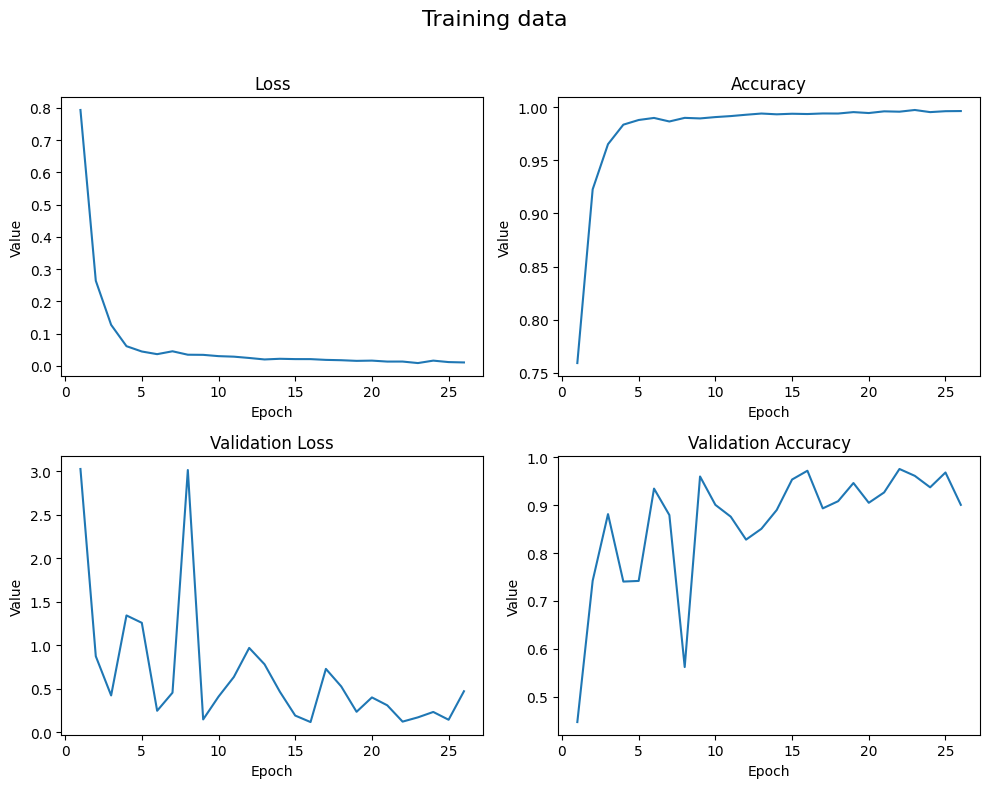

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

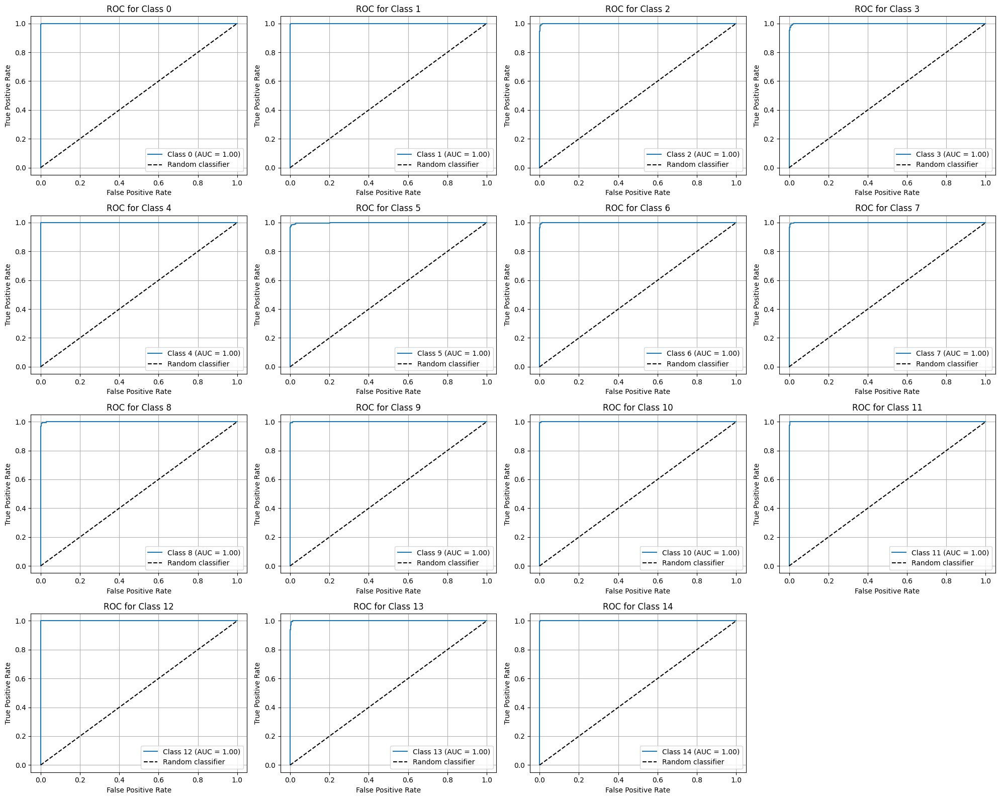

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

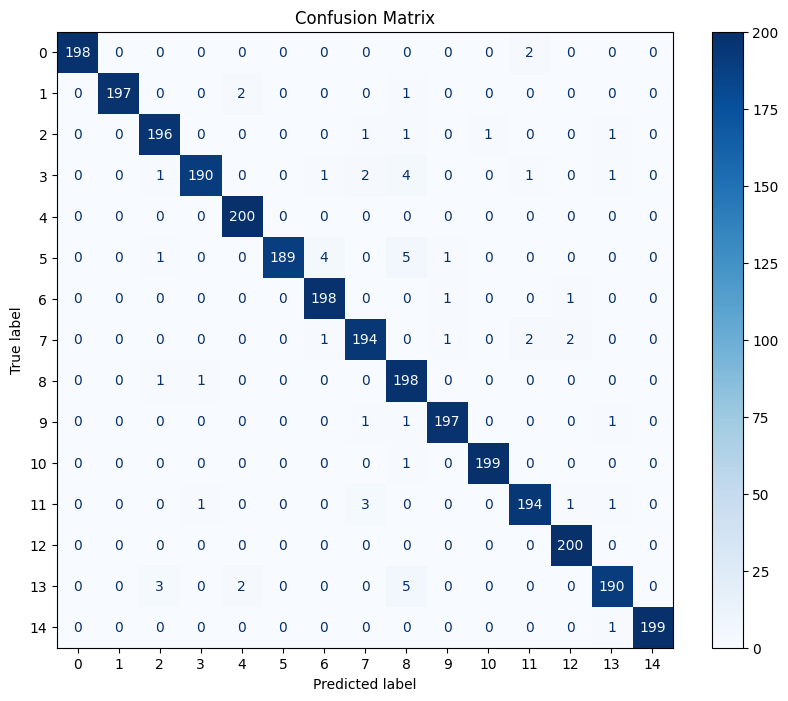

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.9796666666666667


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99       200
           1       1.00      0.98      0.99       200
           2       0.97      0.98      0.98       200
           3       0.99      0.95      0.97       200
           4       0.98      1.00      0.99       200
           5       1.00      0.94      0.97       200
           6       0.97      0.99      0.98       200
           7       0.97      0.97      0.97       200
           8       0.92      0.99      0.95       200
           9       0.98      0.98      0.98       200
          10       0.99      0.99      0.99       200
          11       0.97      0.97      0.97       200
          12       0.98      1.00      0.99       200
          13       0.97      0.95      0.96       200
          14       1.00      0.99      1.00       200

    accuracy                           0.98      3000
   macro avg       0.98      0.98      0.98      3000
weighted avg       0.98   